In [1]:
import numpy as np 
import pandas as pd

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

import re


%matplotlib inline

import pandas_profiling # утилита, удобна для знакомства с данными
# с её помощью можно получить кучу описательных статистик по датасету

from wordcloud import WordCloud

import os

from PIL import Image

from sklearn.model_selection import train_test_split

# Кодирование категориальных переменных
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce

# Шкалирование переменных
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve

# Модели
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import StratifiedKFold

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

import xgboost as xgb 
from xgboost import XGBClassifier
import time
from sklearn.metrics import cohen_kappa_score, make_scorer
from imblearn.over_sampling import SMOTE

from sklearn.linear_model import SGDClassifier, LogisticRegressionCV
# SGD - стохастический градиентный спуск

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from graphviz import Source

import sklearn
import lightgbm as lgb
from catboost import CatBoostClassifier


In [3]:
data = pd.read_csv("train/train.csv")

breeds = pd.read_csv('breed_labels.csv') # словарь пород
colors = pd.read_csv('color_labels.csv') # словарь окрасов шерсти
states = pd.read_csv('state_labels.csv') # словарь местоположения

data.shape

(14993, 24)

In [4]:
pandas_profiling.ProfileReport(data)

Summarize dataset:   0%|          | 0/37 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14993 entries, 0 to 14992
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Type           14993 non-null  int64  
 1   Name           13736 non-null  object 
 2   Age            14993 non-null  int64  
 3   Breed1         14993 non-null  int64  
 4   Breed2         14993 non-null  int64  
 5   Gender         14993 non-null  int64  
 6   Color1         14993 non-null  int64  
 7   Color2         14993 non-null  int64  
 8   Color3         14993 non-null  int64  
 9   MaturitySize   14993 non-null  int64  
 10  FurLength      14993 non-null  int64  
 11  Vaccinated     14993 non-null  int64  
 12  Dewormed       14993 non-null  int64  
 13  Sterilized     14993 non-null  int64  
 14  Health         14993 non-null  int64  
 15  Quantity       14993 non-null  int64  
 16  Fee            14993 non-null  int64  
 17  State          14993 non-null  int64  
 18  Rescue

In [6]:
data.describe()

,Type,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,FurLength,Vaccinated,Dewormed,Sterilized,Health,Quantity,Fee,State,VideoAmt,PhotoAmt,AdoptionSpeed
count,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000,14993.000000
mean,1.457614,10.452078,265.272594,74.009738,1.776162,2.234176,3.222837,1.882012,1.862002,1.467485,1.731208,1.558727,1.914227,1.036617,1.576069,21.259988,41346.028347,0.056760,3.889215,2.516441
std,0.498217,18.155790,60.056818,123.011575,0.681592,1.745225,2.742562,2.984086,0.547959,0.599070,0.667649,0.695817,0.566172,0.199535,1.472477,78.414548,32.444153,0.346185,3.487810,1.177265
min,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,41324.000000,0.000000,0.000000,0.000000
25%,1.000000,2.000000,265.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,0.000000,41326.000000,0.000000,2.000000,2.000000
50%,1.000000,3.000000,266.000000,0.000000,2.000000,2.000000,2.000000,0.000000,2.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,0.000000,41326.000000,0.000000,3.000000,2.000000
75%,2.000000,12.000000,307.000000,179.000000,2.000000,3.000000,6.000000,5.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,0.000000,41401.000000,0.000000,5.000000,4.000000
max,2.000000,255.000000,307.000000,307.000000,3.000000,7.000000,7.000000,7.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,20.000000,3000.000000,41415.000000,8.000000,30.000000,4.000000


In [7]:
missing = data.isnull().sum().to_frame(name = "count_of_missing_values")
missing["%"] = data.isnull().sum() / len(data)
missing

,count_of_missing_values,%
Type,0,0.000000
Name,1257,0.083839
Age,0,0.000000
Breed1,0,0.000000
Breed2,0,0.000000
Gender,0,0.000000
Color1,0,0.000000
Color2,0,0.000000
Color3,0,0.000000
MaturitySize,0,0.000000


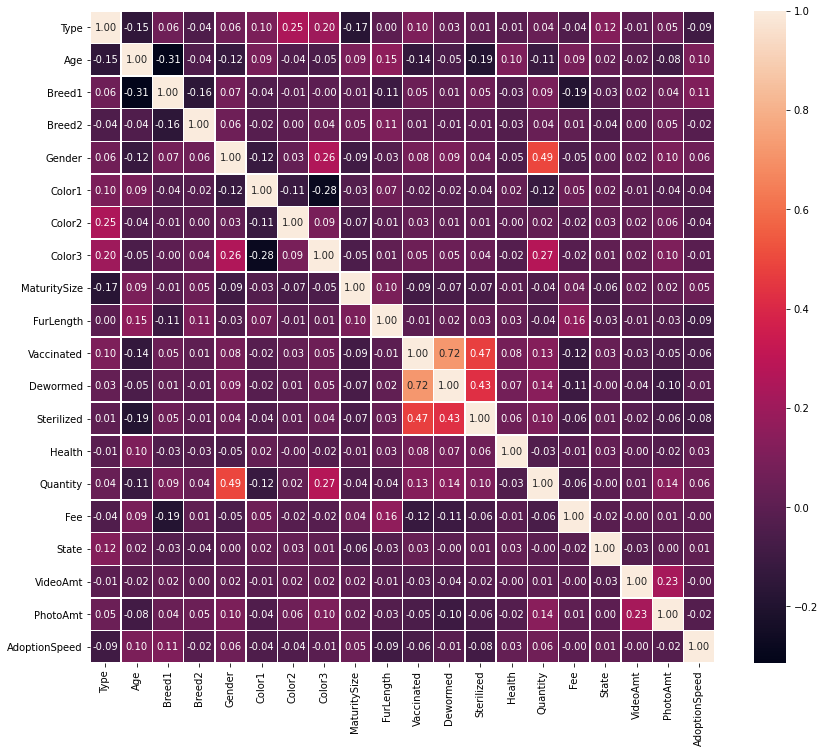

In [8]:
#correlation map
plt.figure(figsize=(14, 12))
sns.heatmap(data.corr(), annot=True, linewidths=.5, fmt= '.2f')
plt.show()

In [9]:
data.columns

Index(['Type', 'Name', 'Age', 'Breed1', 'Breed2', 'Gender', 'Color1', 'Color2',
       'Color3', 'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'Health', 'Quantity', 'Fee', 'State', 'RescuerID',
       'VideoAmt', 'Description', 'PetID', 'PhotoAmt', 'AdoptionSpeed'],
      dtype='object')

## Тип животного:

1 - собака

2 - кот

In [10]:
data["Type"] = data["Type"].apply(lambda x: "dog" if x == 1 else "cat") 
animals = data["Type"].value_counts().to_frame("count")
animals["%"] = data["Type"].value_counts(normalize = True)
animals

,count,%
dog,8132,0.542386
cat,6861,0.457614


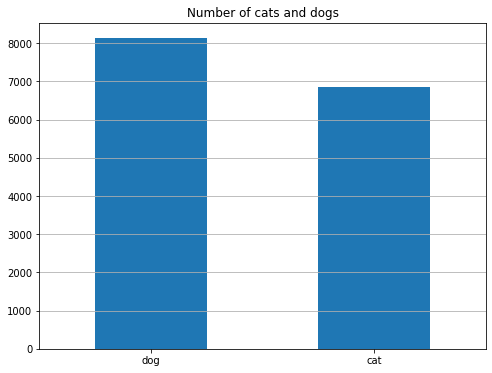

In [11]:
data["Type"].value_counts().plot.bar(figsize=(8, 6), rot = 0)
plt.grid(axis='y')
plt.title('Number of cats and dogs');

## Имена

In [12]:
data["Name"]

0                Nibble
1           No Name Yet
2                Brisco
3                  Miko
4                Hunter
              ...      
14988               NaN
14989    Serato & Eddie
14990           Monkies
14991           Ms Daym
14992              Fili
Name: Name, Length: 14993, dtype: object

In [13]:
data["Name"].values

array(['Nibble', 'No Name Yet', 'Brisco', ..., 'Monkies', 'Ms Daym',
       'Fili'], dtype=object)

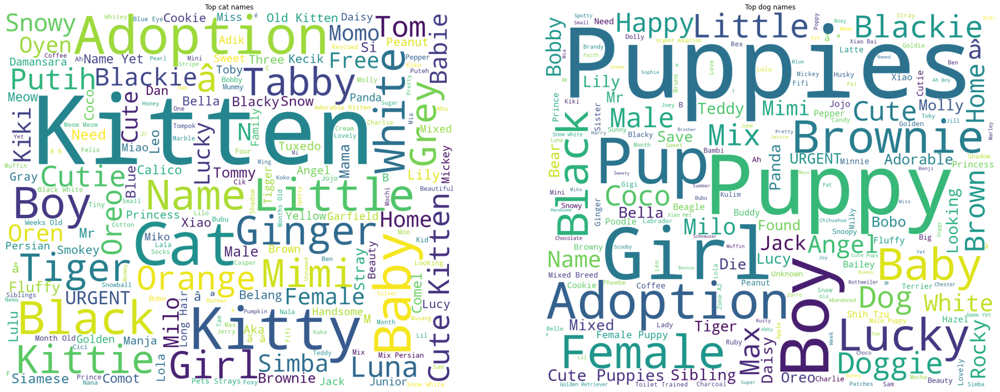

In [14]:
fig, ax = plt.subplots(figsize = (32, 24))
plt.subplot(1, 2, 1)
text_cat = ' '.join(data.loc[data['Type'] == 'cat', 'Name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white',
                      width=1200, height=1000).generate(text_cat)
plt.imshow(wordcloud)
plt.title('Top cat names')
plt.axis("off")

plt.subplot(1, 2, 2)
text_dog = ' '.join(data.loc[data['Type'] == 'dog', 'Name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white',
                      width=1200, height=1000).generate(text_dog)
plt.imshow(wordcloud)
plt.title('Top dog names')
plt.axis("off")

plt.show()

In [15]:
data.fillna('no_name', inplace = True)

In [16]:
names = set()
for x in data["Name"].fillna('').values:
    strn = x.lower()
    if (strn.find("name") != -1 and (strn.find("no") != -1 or strn.find("un") != -1 or
                                    strn.find("less") != -1 or strn.find("haven't") != -1)):
        names.add(x)
# for x in names:
#     print(x)

In [17]:
for x in data["Name"]:
    if len(x) < 3 or re.search(r"\d+", x) is not None:
        names.add(x)
        # print(x)

In [18]:
for x in names:
    data.loc[data['Name'] == x, 'Name'] = "no_name"

<AxesSubplot:>

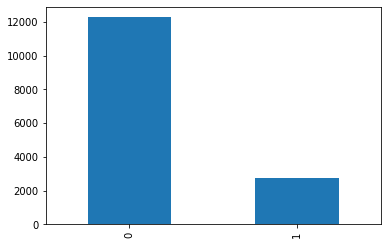

In [19]:
data["No_name"] = 0
data.loc[data['Name'] == 'no_name', 'No_name'] = 1
data["No_name"].value_counts().plot.bar()

## Возраст (в месяцах)

<AxesSubplot:>

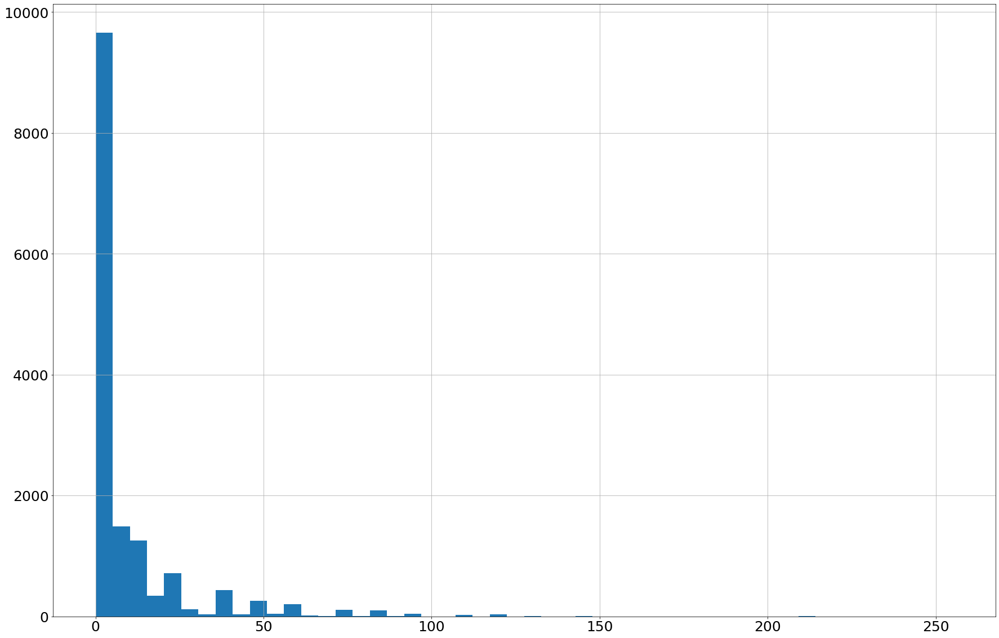

In [20]:
data["Age"].hist(bins = 50, figsize = (30, 20), xlabelsize = 25, ylabelsize = 25)

In [21]:
data["Age"].value_counts().sort_index()

0       179
1      2304
2      3503
3      1966
4      1109
       ... 
168       1
180       2
212       3
238       1
255       2
Name: Age, Length: 106, dtype: int64

<AxesSubplot:>

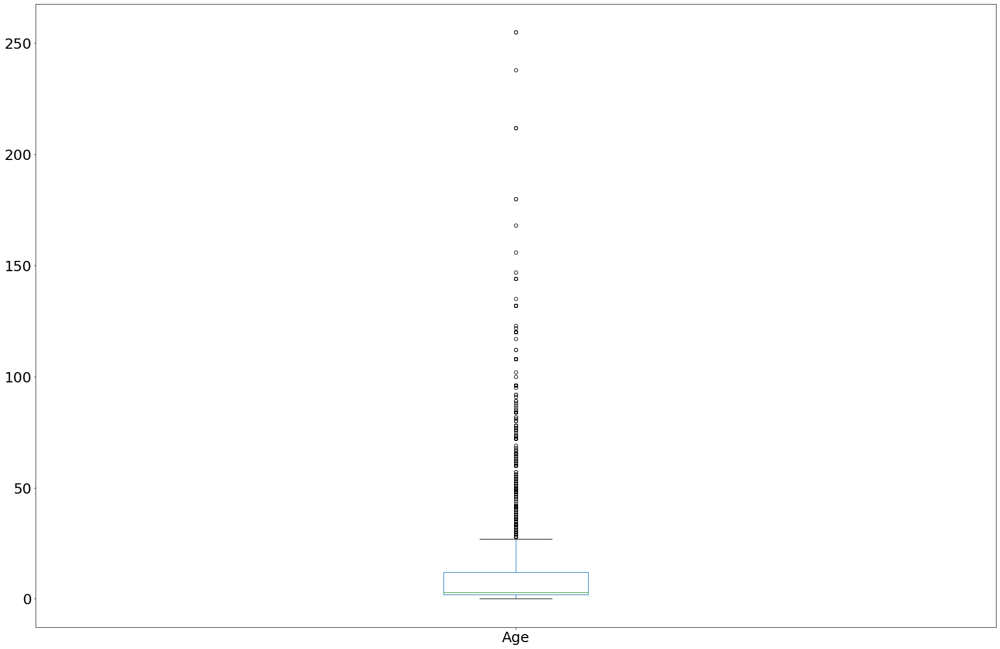

In [22]:
data["Age"].plot.box(figsize = (30, 20), fontsize = 25)

In [31]:
def outlier_detect_IQR(data,col,threshold=3):    
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    lower = data[col].quantile(0.25) - (IQR * threshold)
    upper = data[col].quantile(0.75) + (IQR * threshold)
    borders = (upper, lower)
    emiss = pd.concat([data[col] > upper, data[col] < lower],axis=1)
    outlier_index = emiss.any(axis=1)
    print('Количество выбросов в данных:', outlier_index.value_counts()[1])
    print('Доля выбросов:',outlier_index.value_counts()[1]/len(outlier_index))
    return outlier_index, borders

In [32]:
index,para = outlier_detect_IQR(data=data,col='Age',threshold=1)
print('Верхняя граница:',para[0],'\nНижняя граница:',para[1])

Количество выбросов в данных: 2200
Доля выбросов: 0.1467351430667645
Верхняя граница: 22.0 
Нижняя граница: -8.0


In [33]:
data.loc[index,'Age'].sort_values()

2180      23
10492     23
834       23
14182     23
9425      23
        ... 
3998     212
11087    212
13398    238
5160     255
11172    255
Name: Age, Length: 2200, dtype: int64

In [34]:
data["Age"].min()

0

Заменим выбросы выборочным значением

In [35]:
def impute_outlier_with_arbitrary(data,outlier_index,value,col=[]):
    data_copy = data.copy(deep=True)
    for i in col:
        data_copy.loc[outlier_index,i] = value
    return data_copy

In [36]:
data = impute_outlier_with_arbitrary(data=data,outlier_index=index, value= 24, col=['Age'])

<AxesSubplot:>

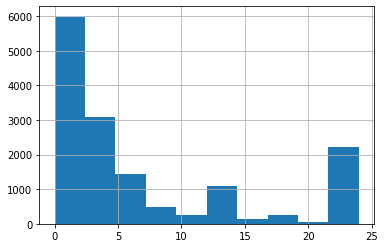

In [37]:
data["Age"].hist()

## Порода

In [40]:
data['Pure_breed'] = 0
data.loc[data['Breed2'] == 0, 'Pure_breed'] = 1
print(f"Доля чистокровных животных = {round(data['Pure_breed'].sum()/len(data), 2)} %")

Доля чистокровных животных = 0.72 %


In [41]:
breeds_dict = {k: v for k, v in zip(breeds['BreedID'], breeds['BreedName'])}
breeds_dict

{1: 'Affenpinscher',
 2: 'Afghan Hound',
 3: 'Airedale Terrier',
 4: 'Akbash',
 5: 'Akita',
 6: 'Alaskan Malamute',
 7: 'American Bulldog',
 8: 'American Eskimo Dog',
 9: 'American Hairless Terrier',
 10: 'American Staffordshire Terrier',
 11: 'American Water Spaniel',
 12: 'Anatolian Shepherd',
 13: 'Appenzell Mountain Dog',
 14: 'Australian Cattle Dog/Blue Heeler',
 15: 'Australian Kelpie',
 16: 'Australian Shepherd',
 17: 'Australian Terrier',
 18: 'Basenji',
 19: 'Basset Hound',
 20: 'Beagle',
 21: 'Bearded Collie',
 22: 'Beauceron',
 23: 'Bedlington Terrier',
 24: 'Belgian Shepherd Dog Sheepdog',
 25: 'Belgian Shepherd Laekenois',
 26: 'Belgian Shepherd Malinois',
 27: 'Belgian Shepherd Tervuren',
 28: 'Bernese Mountain Dog',
 29: 'Bichon Frise',
 30: 'Black and Tan Coonhound',
 31: 'Black Labrador Retriever',
 32: 'Black Mouth Cur',
 33: 'Black Russian Terrier',
 34: 'Bloodhound',
 35: 'Blue Lacy',
 36: 'Bluetick Coonhound',
 37: 'Boerboel',
 38: 'Bolognese',
 39: 'Border Collie'

In [42]:
data['Breed1_name'] = data['Breed1'].apply(lambda x: '_'.join(breeds_dict[x].split()) if x in breeds_dict else 'Unknown')
data['Breed2_name'] = data['Breed2'].apply(lambda x: '_'.join(breeds_dict[x].split()) if x in breeds_dict else '-')
data

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,...,RescuerID,VideoAmt,Description,PetID,PhotoAmt,AdoptionSpeed,No_name,Pure_breed,Breed1_name,Breed2_name
0,cat,Nibble,3,299,0,1,1,7,0,1,...,8480853f516546f6cf33aa88cd76c379,0,Nibble is a 3+ month old ball of cuteness. He ...,86e1089a3,1.0,2,0,1,Tabby,-
1,cat,no_name,1,265,0,1,1,2,0,2,...,3082c7125d8fb66f7dd4bff4192c8b14,0,I just found it alone yesterday near my apartm...,6296e909a,2.0,0,1,1,Domestic_Medium_Hair,-
2,dog,Brisco,1,307,0,1,2,7,0,2,...,fa90fa5b1ee11c86938398b60abc32cb,0,Their pregnant mother was dumped by her irresp...,3422e4906,7.0,3,0,1,Mixed_Breed,-
3,dog,Miko,4,307,0,2,1,2,0,2,...,9238e4f44c71a75282e62f7136c6b240,0,"Good guard dog, very alert, active, obedience ...",5842f1ff5,8.0,2,0,1,Mixed_Breed,-
4,dog,Hunter,1,307,0,1,1,0,0,2,...,95481e953f8aed9ec3d16fc4509537e8,0,This handsome yet cute boy is up for adoption....,850a43f90,3.0,2,0,1,Mixed_Breed,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14988,cat,no_name,2,266,0,3,1,0,0,2,...,61c84bd7bcb6fb31d2d480b1bcf9682e,0,I have 4 kittens that need to be adopt urgentl...,dc0935a84,3.0,2,1,1,Domestic_Short_Hair,-
14989,cat,Serato & Eddie,24,265,264,3,1,4,7,2,...,1d5096c4a5e159a3b750c5cfcf6ceabf,0,Serato(female cat- 3 color) is 4 years old and...,a01ab5b30,3.0,4,0,0,Domestic_Medium_Hair,Domestic_Long_Hair
14990,cat,Monkies,2,265,266,3,5,6,7,3,...,6f40a7acfad5cc0bb3e44591ea446c05,0,"Mix breed, good temperament kittens. Love huma...",d981b6395,5.0,3,0,0,Domestic_Medium_Hair,Domestic_Short_Hair
14991,cat,Ms Daym,9,266,0,2,4,7,0,1,...,c311c0c569245baa147d91fa4e351ae4,0,she is very shy..adventures and independent..s...,e4da1c9e4,3.0,4,0,1,Domestic_Short_Hair,-


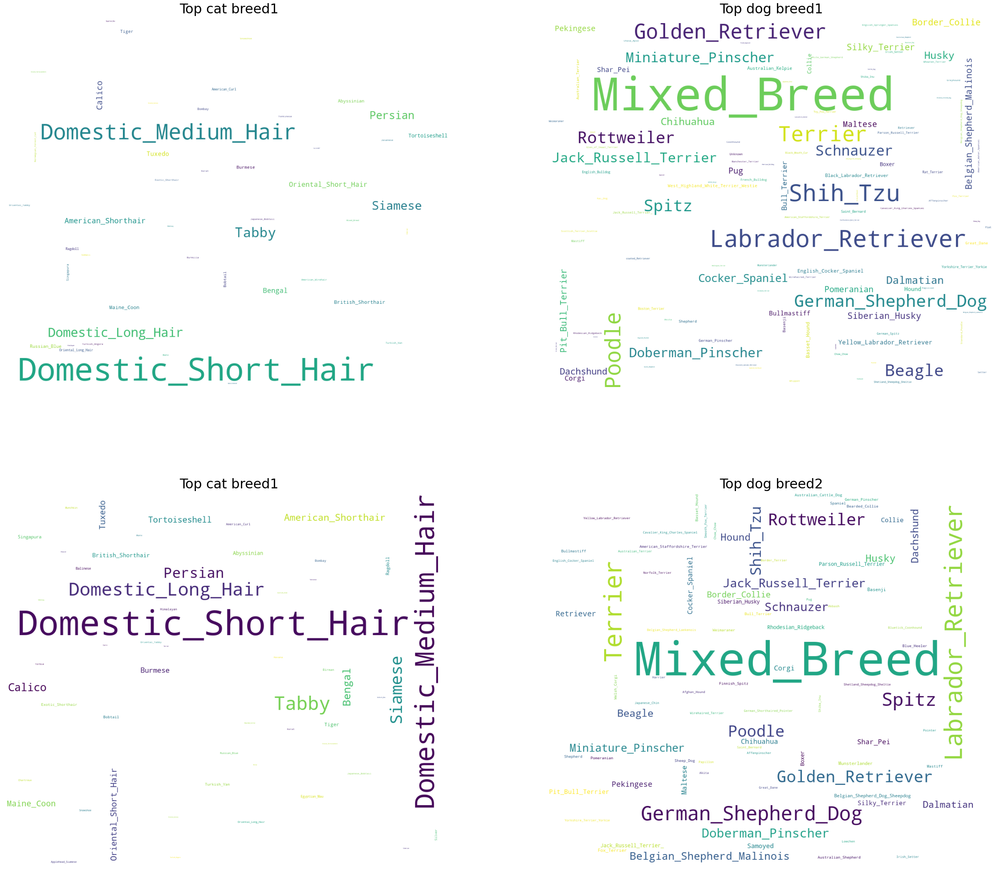

In [43]:
fig, ax = plt.subplots(figsize = (40, 36))
plt.subplot(2, 2, 1)
text_cat1 = ' '.join(data.loc[data['Type'] == 'cat', 'Breed1_name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text_cat1)
plt.imshow(wordcloud)
plt.title('Top cat breed1', fontdict={'fontsize': 30})
plt.axis("off")

plt.subplot(2, 2, 2)
text_dog1 = ' '.join(data.loc[data['Type'] == 'dog', 'Breed1_name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text_dog1)
plt.imshow(wordcloud)
plt.title('Top dog breed1', fontdict={'fontsize': 30})
plt.axis("off")

plt.subplot(2, 2, 3)
text_cat2 = ' '.join(data.loc[data['Type'] == 'cat', 'Breed2_name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text_cat2)
plt.imshow(wordcloud)
plt.title('Top cat breed1', fontdict={'fontsize': 30})
plt.axis("off")

plt.subplot(2, 2, 4)
text_dog2 = ' '.join(data.loc[data['Type'] == 'dog', 'Breed2_name'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1200, height=1000).generate(text_dog2)
plt.imshow(wordcloud)
plt.title('Top dog breed2', fontdict={'fontsize': 30})
plt.axis("off")
plt.show()

In [44]:
no_pure_breeds = ['Mixed_Breed', 'Domestic_Long_Hair', 'Domestic_Medium_Hair', 'Domestic_Short_Hair']

for x in no_pure_breeds:
    data.loc[data['Breed1_name'] == x, 'Pure_breed'] = 0
    data.loc[data['Breed2_name'] == x, 'Pure_breed'] = 0

In [45]:
print(f"Доля чистокровных животных = {round(data['Pure_breed'].sum()/len(data), 2)} %")

Доля чистокровных животных = 0.13 %


<AxesSubplot:>

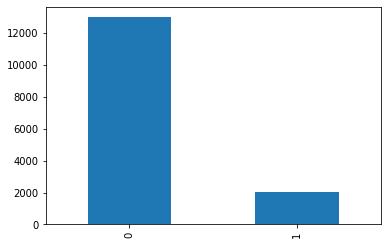

In [46]:
data['Pure_breed'].value_counts().plot.bar()

## Пол

Пол питомца (1 = мужской, 2 = женский, 3 = смешанный, если в записи несколько животных)

Text(0.5, 1.0, 'Number of gender')

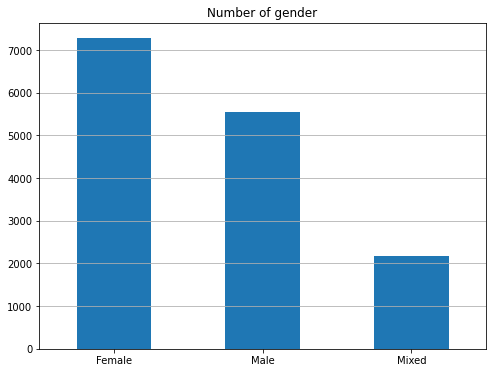

In [47]:
graph_data = data['Gender'].apply(lambda x: 'Male' if x == 1 else ('Female' if x == 2 else 'Mixed'))
graph_data.value_counts().plot.bar(figsize=(8, 6), rot = 0)
plt.grid(axis='y')
plt.title('Number of gender')

In [48]:
graph_data.value_counts().to_frame("count")

,count
Female,7277
Male,5536
Mixed,2180


## Окрас

In [49]:
colors_dict = {k: v for k, v in zip(colors['ColorID'], colors['ColorName'])}
data['Color1_name'] = data['Color1'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
data['Color2_name'] = data['Color2'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
data['Color3_name'] = data['Color3'].apply(lambda x: colors_dict[x] if x in colors_dict else '')
colors_dict

{1: 'Black',
 2: 'Brown',
 3: 'Golden',
 4: 'Yellow',
 5: 'Cream',
 6: 'Gray',
 7: 'White'}

<AxesSubplot:>

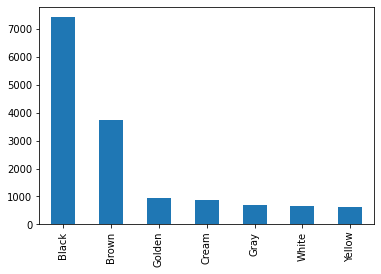

In [50]:
data["Color1_name"].value_counts().plot.bar()

<AxesSubplot:>

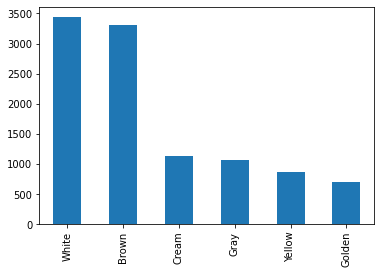

In [51]:
data["Color2_name"].value_counts().drop(index='').plot.bar() 

<AxesSubplot:>

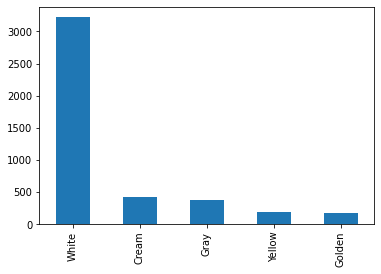

In [52]:
data["Color3_name"].value_counts().drop(index='').plot.bar() 

In [53]:
data['full_color'] = (data['Color1_name'] + '__' + data['Color2_name'] + '__' + data['Color3_name']).str.replace('__', '')

In [54]:
data

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,...,PhotoAmt,AdoptionSpeed,No_name,Pure_breed,Breed1_name,Breed2_name,Color1_name,Color2_name,Color3_name,full_color
0,cat,Nibble,3,299,0,1,1,7,0,1,...,1.0,2,0,1,Tabby,-,Black,White,,BlackWhite
1,cat,no_name,1,265,0,1,1,2,0,2,...,2.0,0,1,0,Domestic_Medium_Hair,-,Black,Brown,,BlackBrown
2,dog,Brisco,1,307,0,1,2,7,0,2,...,7.0,3,0,0,Mixed_Breed,-,Brown,White,,BrownWhite
3,dog,Miko,4,307,0,2,1,2,0,2,...,8.0,2,0,0,Mixed_Breed,-,Black,Brown,,BlackBrown
4,dog,Hunter,1,307,0,1,1,0,0,2,...,3.0,2,0,0,Mixed_Breed,-,Black,,,Black
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14988,cat,no_name,2,266,0,3,1,0,0,2,...,3.0,2,1,0,Domestic_Short_Hair,-,Black,,,Black
14989,cat,Serato & Eddie,24,265,264,3,1,4,7,2,...,3.0,4,0,0,Domestic_Medium_Hair,Domestic_Long_Hair,Black,Yellow,White,BlackYellowWhite
14990,cat,Monkies,2,265,266,3,5,6,7,3,...,5.0,3,0,0,Domestic_Medium_Hair,Domestic_Short_Hair,Cream,Gray,White,CreamGrayWhite
14991,cat,Ms Daym,9,266,0,2,4,7,0,1,...,3.0,4,0,0,Domestic_Short_Hair,-,Yellow,White,,YellowWhite


<AxesSubplot:>

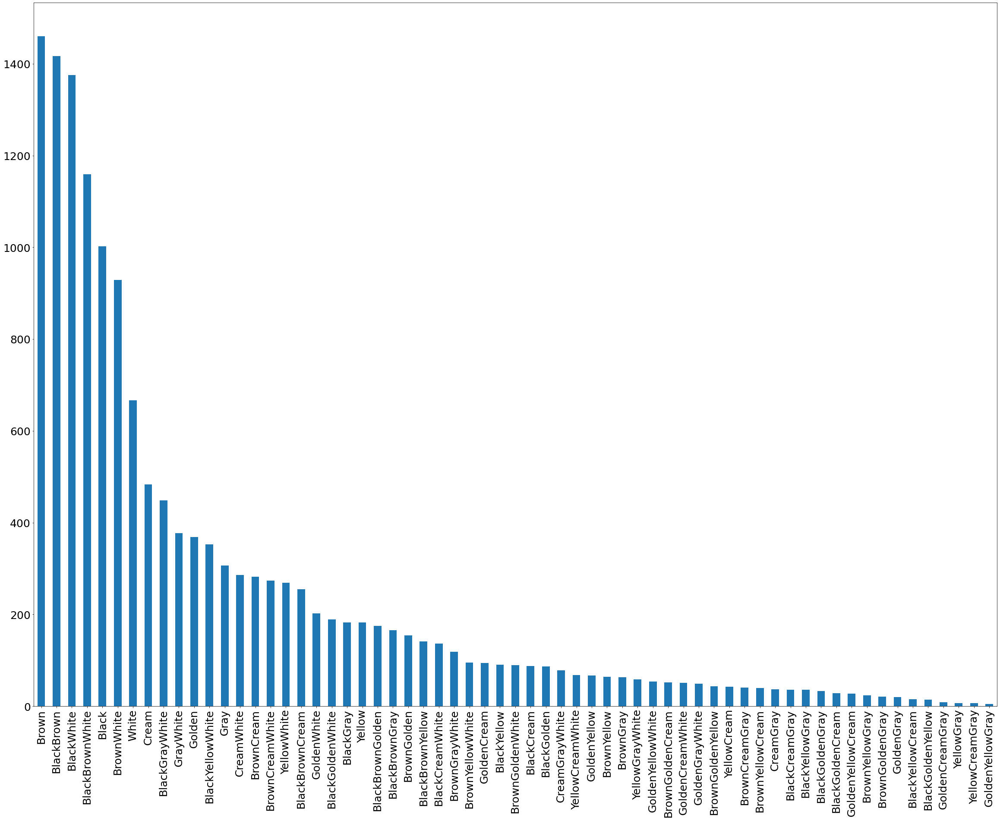

In [55]:
data["full_color"].value_counts().plot.bar(figsize = (40, 30), fontsize=25)

<AxesSubplot:>

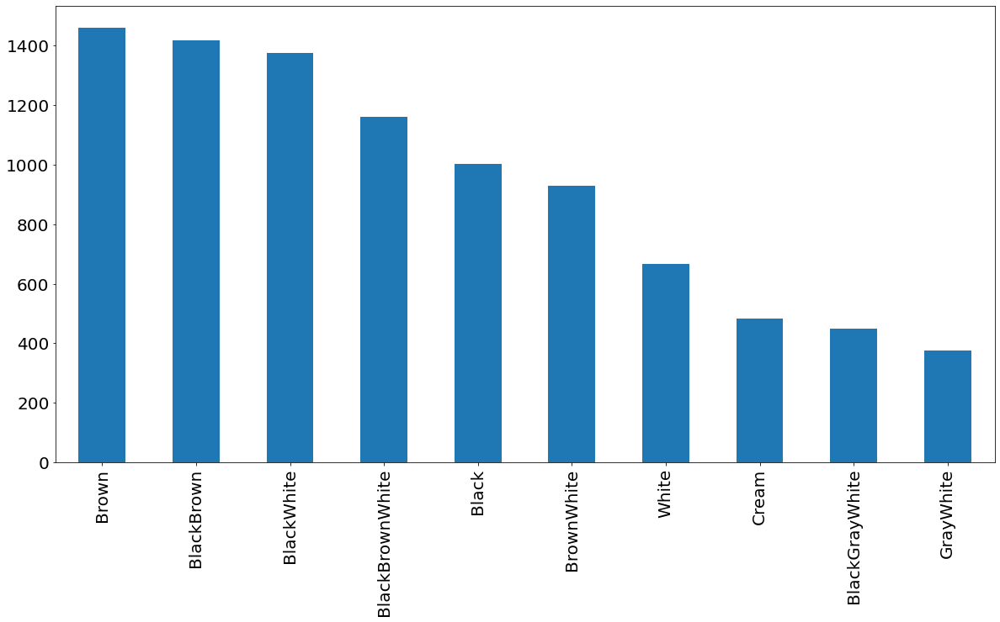

In [56]:
data["full_color"].value_counts()[:10].plot.bar(figsize = (20, 10), fontsize=20)

## Размер животного в зрелом возрасте

1 = маленький, 2 = средний, 3 = большой, 4 = очень большой, 0 = не указано

Text(0.5, 1.0, 'Number of MaturitySize')

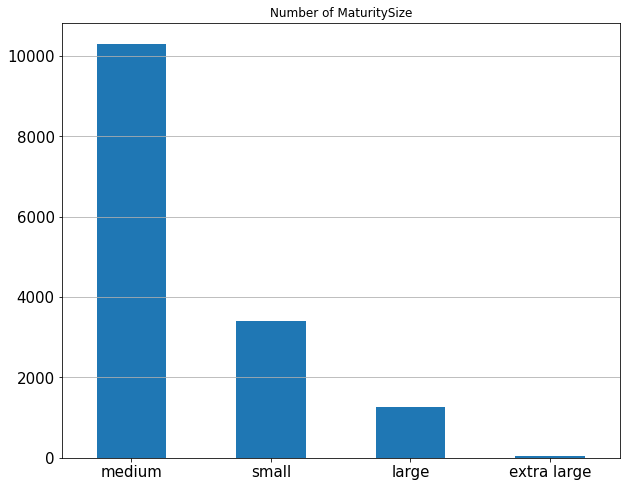

In [57]:
graph_data = data['MaturitySize'].apply(lambda x: 'small' if x == 1 else ('medium' if x == 2 else ('large' if x == 3 else 'extra large')))
graph_data.value_counts().plot.bar(figsize=(10, 8), rot = 0, fontsize=15)
plt.grid(axis='y')
plt.title('Number of MaturitySize')

Text(0.5, 1.0, "Number of dog's MaturitySize")

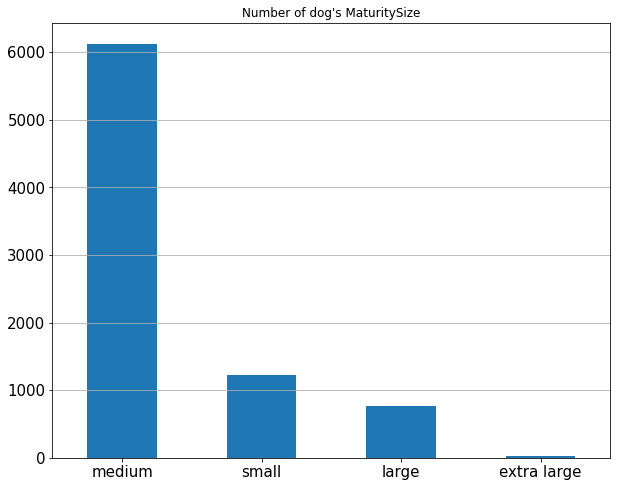

In [58]:
graph_data = data[data['Type'] == 'dog']['MaturitySize'].apply(lambda x: 'small' if x == 1 else ('medium' if x == 2 else ('large' if x == 3 else 'extra large')))
graph_data.value_counts().plot.bar(figsize=(10, 8), rot = 0, fontsize=15)
plt.grid(axis='y')
plt.title("Number of dog's MaturitySize")

Text(0.5, 1.0, "Number of cat's MaturitySize")

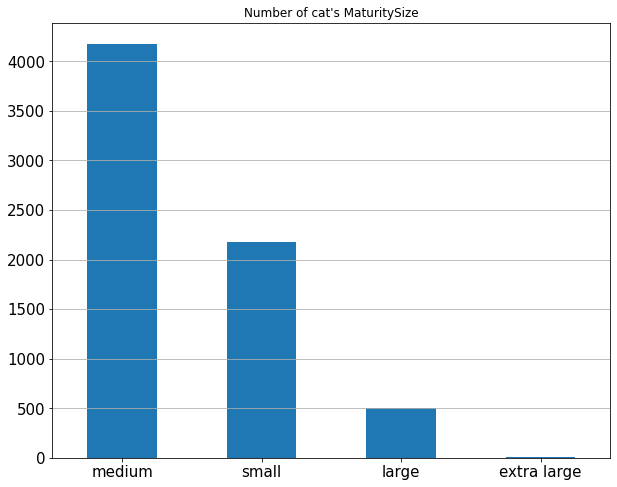

In [59]:
graph_data = data[data['Type'] == 'cat']['MaturitySize'].apply(lambda x: 'small' if x == 1 else ('medium' if x == 2 else ('large' if x == 3 else 'extra large')))
graph_data.value_counts().plot.bar(figsize=(10, 8), rot = 0, fontsize=15)
plt.grid(axis='y')
plt.title("Number of cat's MaturitySize")

## Длина шерсти

1 = короткая, 2 = средняя, 3 = длинная, 0 = не указано

In [60]:
data["FurLength"].value_counts()

1    8808
2    5361
3     824
Name: FurLength, dtype: int64

Text(0.5, 1.0, 'Number of pets by FurLength')

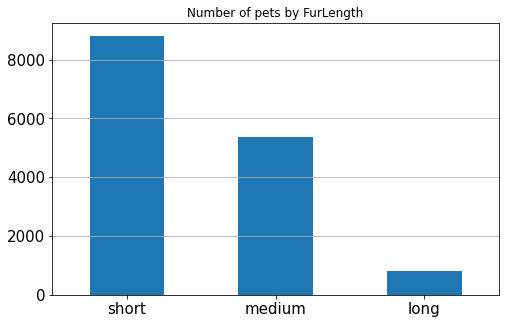

In [61]:
graph_data = data['FurLength'].apply(lambda x: 'short' if x == 1 else ('medium' if x == 2 else 'long'))
graph_data.value_counts().plot.bar(figsize=(8, 5), rot = 0, fontsize=15)
plt.grid(axis='y')
plt.title('Number of pets by FurLength')

## Здоровье
Есть 4 признака, относящиеся к здоровью питомца
- Vaccinated — вакцинировано ли домашнее животное (1 = да, 2 = нет, 3 = не уверены)
- Dewormed — избавлено ли животное от глистов (гельминтов) (1 = да, 2 = нет, 3 = не уверены)
- Sterilized — стерилизовано ли животное (1 = да, 2 = нет, 3 = не уверены)
- Health - состояние здоровья (1 = здоровый, 2 = легкая травма, 3 = серьезная травма)

In [62]:
data["Vaccinated"].value_counts()

2    7227
1    5898
3    1868
Name: Vaccinated, dtype: int64

Text(0.5, 1.0, 'Number of pets by Vaccinated')

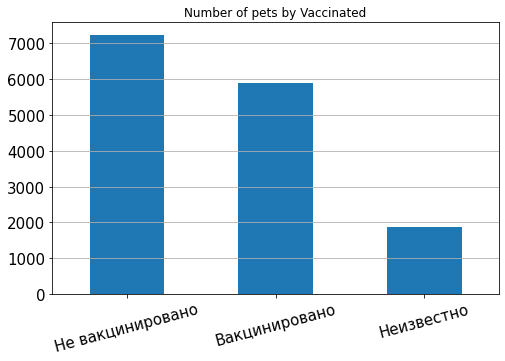

In [63]:
graph_data = data['Vaccinated'].apply(lambda x: 'Вакцинировано' if x == 1 else ('Не вакцинировано' if x == 2 else 'Неизвестно'))
graph_data.value_counts().plot.bar(figsize=(8, 5), rot = 15, fontsize=15)
plt.grid(axis='y')
plt.title('Number of pets by Vaccinated')

In [64]:
data["Dewormed"].value_counts()

1    8397
2    4815
3    1781
Name: Dewormed, dtype: int64

Text(0.5, 1.0, 'Избавлено ли животное от глистов')

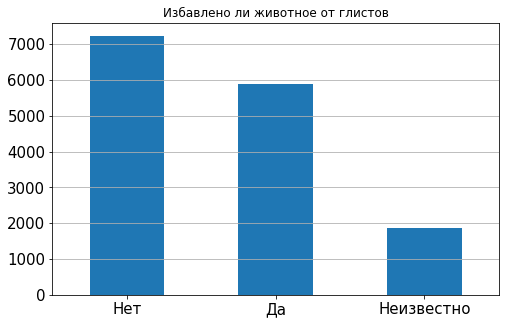

In [65]:
graph_data = data['Vaccinated'].apply(lambda x: 'Да' if x == 1 else ('Нет' if x == 2 else 'Неизвестно'))
graph_data.value_counts().plot.bar(figsize=(8, 5), rot = 0, fontsize=15)
plt.grid(axis='y')
plt.title('Избавлено ли животное от глистов')

In [66]:
data["Sterilized"].value_counts()

2    10077
1     3101
3     1815
Name: Sterilized, dtype: int64

Text(0.5, 1.0, 'Стерилизовано ли животное')

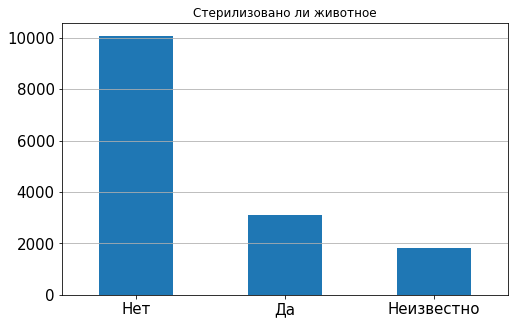

In [67]:
graph_data = data['Sterilized'].apply(lambda x: 'Да' if x == 1 else ('Нет' if x == 2 else 'Неизвестно'))
graph_data.value_counts().plot.bar(figsize=(8, 5), rot = 0, fontsize=15)
plt.grid(axis='y')
plt.title('Стерилизовано ли животное')

In [68]:
data["Health"].value_counts()

1    14478
2      481
3       34
Name: Health, dtype: int64

Text(0.5, 1.0, 'Состояние здоровья')

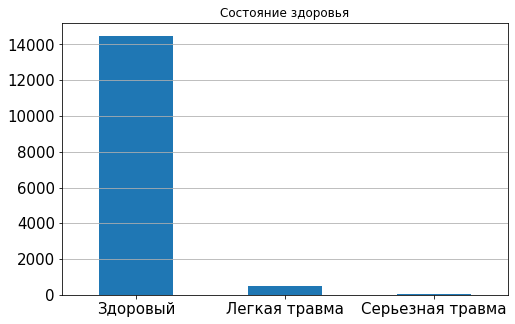

In [69]:
graph_data = data['Health'].apply(lambda x: 'Здоровый' if x == 1 else ('Легкая травма' if x == 2 else 'Серьезная травма'))
graph_data.value_counts().plot.bar(figsize=(8, 5), rot = 0, fontsize=15)
plt.grid(axis='y')
plt.title('Состояние здоровья')

In [70]:
main_count = data['AdoptionSpeed'].value_counts(normalize=True).sort_index()

def prepare_plot_dict(df, col, main_count):
    """
    Preparing dictionary with data for plotting.
    
    I want to show how much higher/lower are the rates of Adoption speed for the current column comparing to base values (as described higher),
    At first I calculate base rates, then for each category in the column I calculate rates of Adoption speed and find difference with the base rates.
    
    """
    main_count = dict(main_count)
    plot_dict = {}
    for i in df[col].unique():
        val_count = dict(df.loc[df[col] == i, 'AdoptionSpeed'].value_counts().sort_index())

        for k, v in main_count.items():
            if k in val_count:
                plot_dict[val_count[k]] = ((val_count[k] / sum(val_count.values())) / main_count[k]) * 100 - 100
            else:
                plot_dict[0] = 0

    return plot_dict

def make_count_plot(df, x, hue='AdoptionSpeed', title='', main_count=main_count):
    """
    Plotting countplot with correct annotations.
    """
    g = sns.countplot(x=x, data=df, hue=hue);
    plt.title(f'AdoptionSpeed {title}', fontsize=20);
    ax = g.axes

    plot_dict = prepare_plot_dict(df, x, main_count)

    for p in ax.patches:
        h = p.get_height() if str(p.get_height()) != 'nan' else 0
        text = f"{plot_dict[h]:.0f}%" if plot_dict[h] < 0 else f"+{plot_dict[h]:.0f}%"
        ax.annotate(text, (p.get_x() + p.get_width() / 2., h),
             ha='center', va='center', fontsize=20, color='green' if plot_dict[h] > 0 else 'red', rotation=0, xytext=(0, 10),
             textcoords='offset points') 

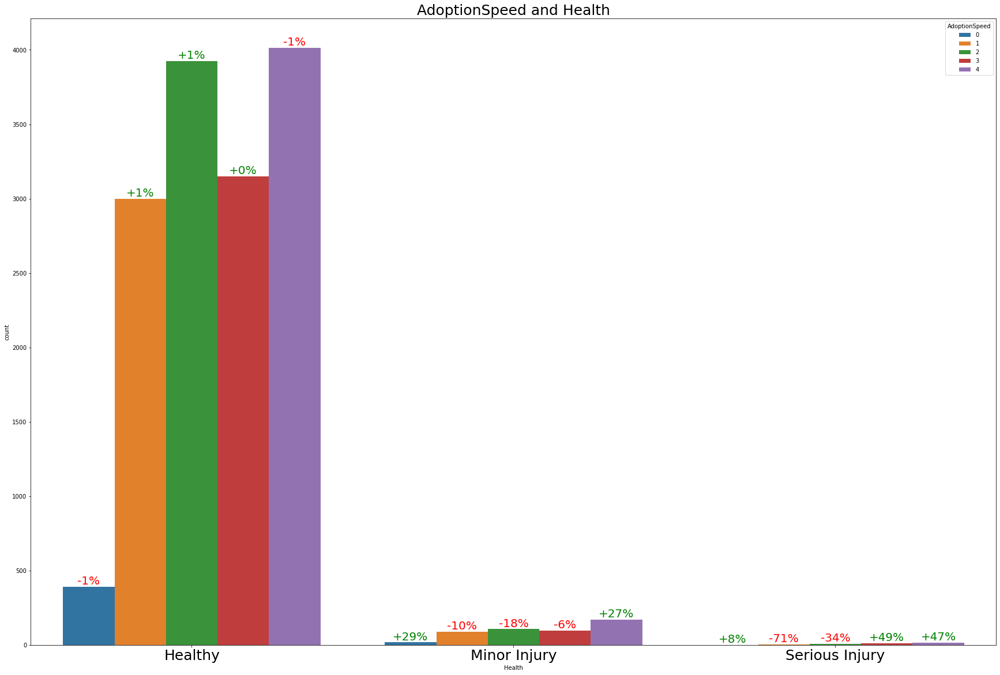

In [71]:
plt.subplots(figsize=(30,20))
make_count_plot(df=data, x='Health', title='Health')
plt.xticks([0, 1, 2], ['Healthy', 'Minor Injury', 'Serious Injury'], fontsize=25);
plt.title('AdoptionSpeed and Health', fontsize=25);

Text(0.5, 1.0, 'Самые популярные комбинации типов здоровья')

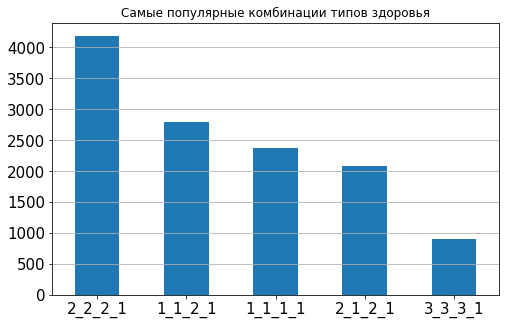

In [72]:
data['full_health'] = data['Vaccinated'].astype(str) + '_' + data['Dewormed'].astype(str) + '_' + data['Sterilized'].astype(str) + '_' + data['Health'].astype(str)
data['full_health'].value_counts()[:5].plot.bar(figsize=(8, 5), rot = 0, fontsize=15)
plt.grid(axis='y')
plt.title('Самые популярные комбинации типов здоровья')

- 1_1_1_1 — вакцинировано, избавлено от глистов, стерилизовано и здорово
- 1_1_2_1 — вакцинировано, избавлено от глистов, не стерилизовано и здорово
- 2_1_2_1 — не вакцинировано, избавлено от глистов, не стерилизовано и здорово
- 2_2_2_1 — не вакцинировано, не избавлено от глистов, не стерилизовано и здорово
- 3_3_3_1 — животное здорово, но информации о вакцинации, стерилизации и об избавлении от глистов нет

In [73]:
data['full_health'].value_counts()[:5]

2_2_2_1    4189
1_1_2_1    2786
1_1_1_1    2377
2_1_2_1    2081
3_3_3_1     907
Name: full_health, dtype: int64

## Количество животных в одном профиле

<AxesSubplot:>

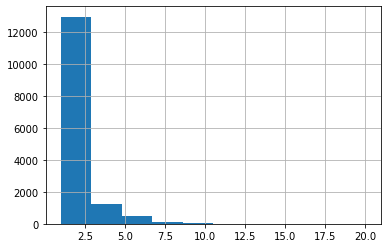

In [74]:
data['Quantity'].hist()

In [75]:
data['Quantity'].value_counts().sort_index()

1     11565
2      1422
3       726
4       531
5       333
6       185
7        84
8        52
9        33
10       19
11       10
12        6
13        2
14        2
15        4
16        3
17        3
18        1
20       12
Name: Quantity, dtype: int64

<AxesSubplot:>

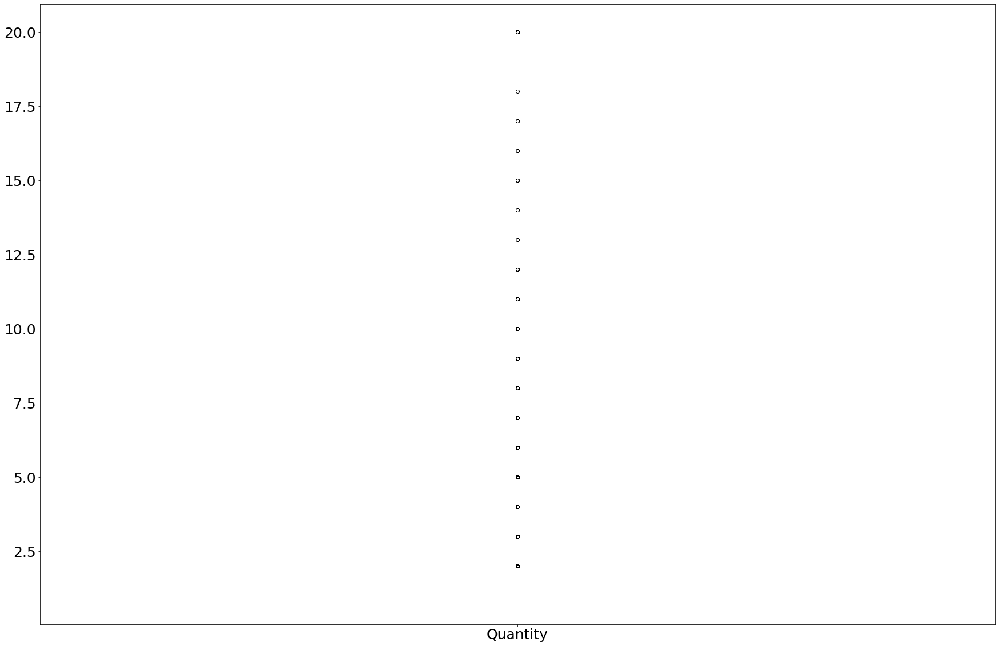

In [76]:
data['Quantity'].plot.box(figsize = (30, 20), fontsize = 25)

In [77]:
data['one_pet'] = data["Quantity"].apply(lambda x: 1 if x==1  else 0)

## Стоимость

Некоторых животных отдают бесплатно, а за некоторых требуют плату

Free        12663
Not Free     2330
Name: Free, dtype: int64


<AxesSubplot:>

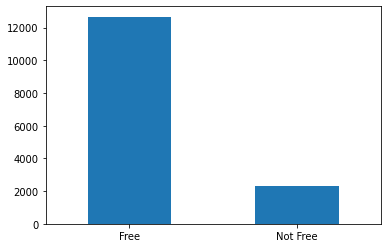

In [78]:
data['Free'] = data['Fee'].apply(lambda x: 'Free' if x == 0 else 'Not Free')
print(data["Free"].value_counts())
data["Free"].value_counts().plot.bar(rot = 0)

In [79]:
data['Free'] = data['Fee'].apply(lambda x: 1 if x == 0 else 0)

<AxesSubplot:>

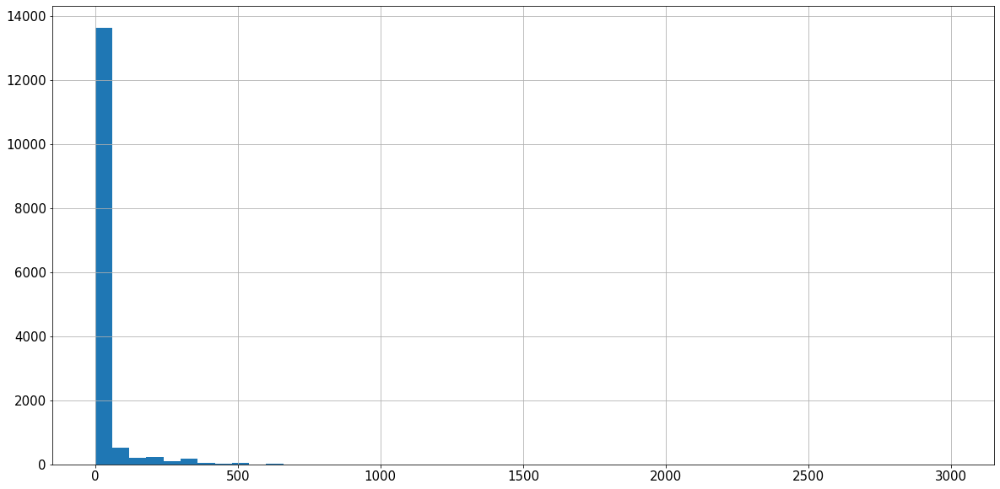

In [80]:
data['Fee'].hist(figsize = (20, 10), xlabelsize = 15, ylabelsize = 15, bins = 50)

In [81]:
data["Fee"].max()

3000

In [82]:
data.sort_values('Fee', ascending=False)[['Name', 'Description', 'Fee', 'Breed1_name', 'Age']].head(10)

,Name,Description,Fee,Breed1_name,Age
8722,Khaleesi And Drogo,Both pups are family home trained. They love t...,3000,German_Shepherd_Dog,4
10477,Bull Dog,Found this bull dog near my neighbourhood for ...,2000,English_Bulldog,24
8879,Rottweiler Semi-Adult - Adoption,Looking for new lovely home due to owner lack ...,1000,Rottweiler,8
2078,Rottweiler - Adoption,Open for Adoption with Fees Looking for new lo...,1000,Rottweiler,8
8834,Adpoted,adpoted,1000,Shih_Tzu,24
4844,Coda,She is pure breed Siberian husky. Born at July...,1000,Siberian_Husky,7
9745,Oscar,Oscar was found in Ara Damansara recently. My ...,800,Rottweiler,24
9782,no_name,Available open for booking cute kitten Solid w...,800,Persian,1
14454,no_name,Looking for serius buyer Only female 2 month p...,750,Persian,2
11687,no_name,Open for adoption! They are a family of a set ...,750,Dilute_Tortoiseshell,12


Text(0.5, 1.0, 'Distribution of fees lower than 400')

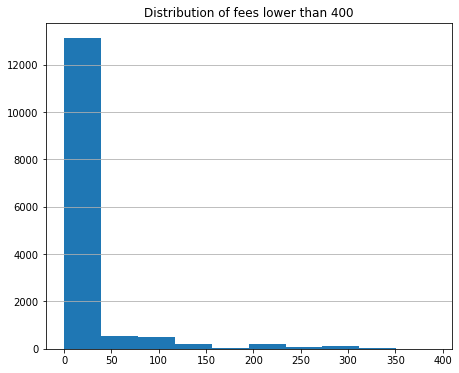

In [83]:
plt.figure(figsize=(16, 6));
plt.subplot(1, 2, 1)
plt.hist(data.loc[data['Fee'] < 400, 'Fee'])
plt.grid(axis='y')
plt.title('Distribution of fees lower than 400')

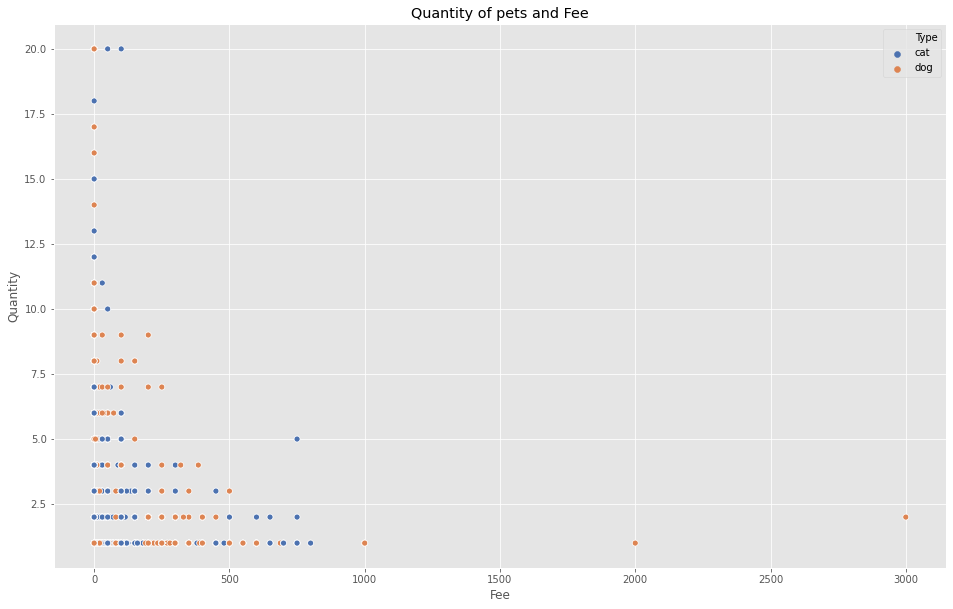

In [84]:
plt.style.use('ggplot')
plt.figure(figsize=(16, 10));
sns.scatterplot(x="Fee", y="Quantity", hue="Type",data=data, palette = "deep");
plt.title('Quantity of pets and Fee');

<AxesSubplot:>

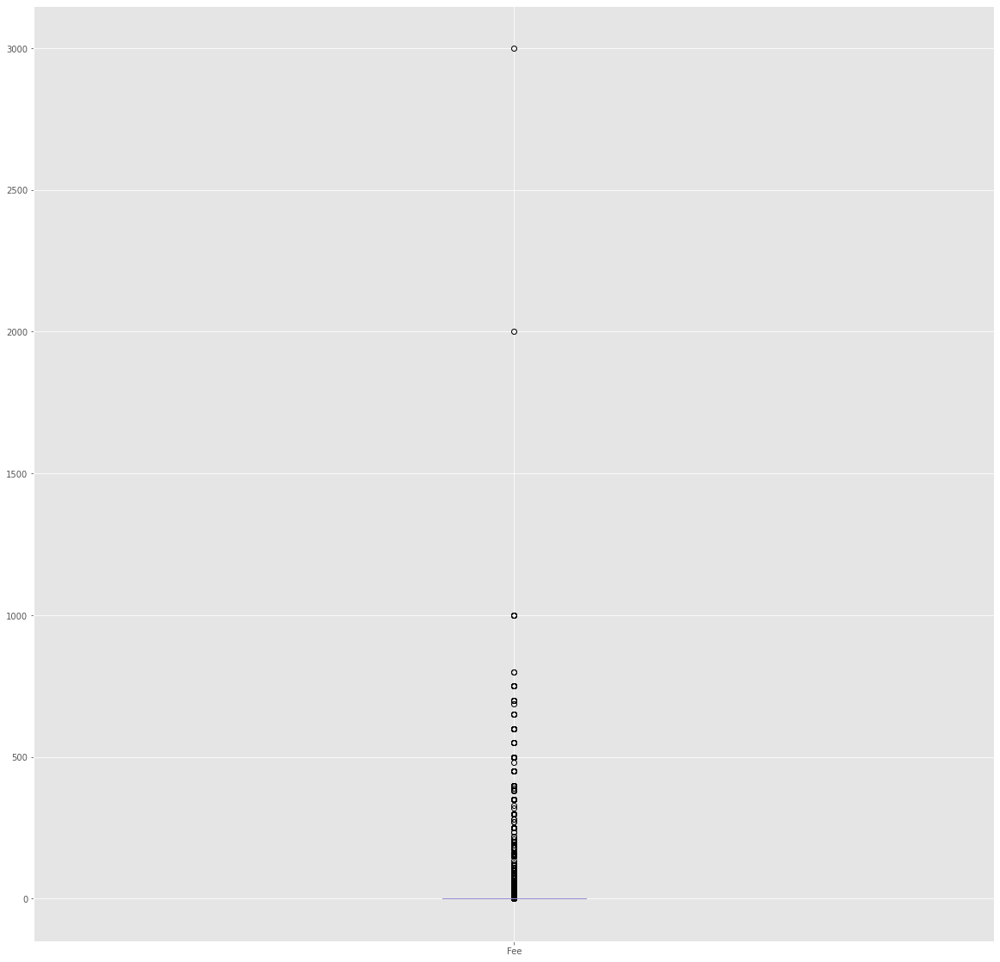

In [85]:
data["Fee"].plot.box(figsize=(20,20))
# Что делать в этом случае?

<AxesSubplot:>

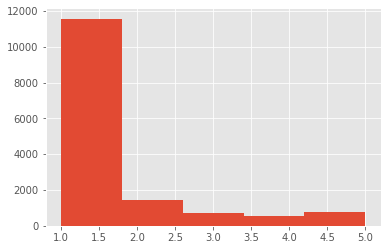

In [86]:
data["Quantity"] = data["Quantity"].apply(lambda x: x if x <= 5 else 5)
data["Fee"] = data["Fee"].apply(lambda x: x if x <= 500 else 500) 
data["Quantity"].hist(bins=5)

<AxesSubplot:>

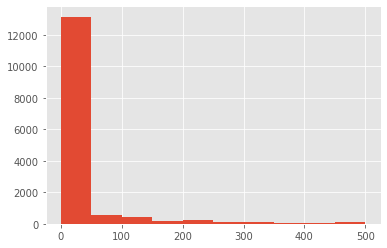

In [87]:
data["Fee"].hist()

## Месторасположение

In [88]:
data["State"].value_counts()

41326    8714
41401    3845
41327     843
41336     507
41330     420
41332     253
41324     137
41325     110
41335      85
41361      26
41345      22
41367      15
41342      13
41415       3
Name: State, dtype: int64

In [89]:
states_dict = {k: v for k, v in zip(states['StateID'], states['StateName'])}
states_dict

{41336: 'Johor',
 41325: 'Kedah',
 41367: 'Kelantan',
 41401: 'Kuala Lumpur',
 41415: 'Labuan',
 41324: 'Melaka',
 41332: 'Negeri Sembilan',
 41335: 'Pahang',
 41330: 'Perak',
 41380: 'Perlis',
 41327: 'Pulau Pinang',
 41345: 'Sabah',
 41342: 'Sarawak',
 41326: 'Selangor',
 41361: 'Terengganu'}

In [90]:
data['State_name'] = data['State'].apply(lambda x: '_'.join(states_dict[x].split()) if x in states_dict else 'Unknown')

<AxesSubplot:>

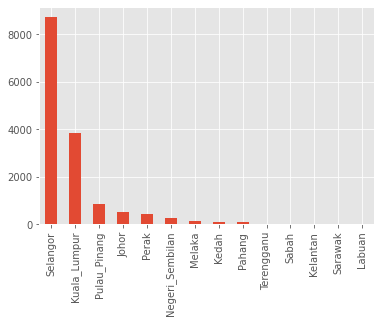

In [91]:
data['State_name'].value_counts().plot.bar()

In [92]:
data['State_name'].value_counts()

Selangor           8714
Kuala_Lumpur       3845
Pulau_Pinang        843
Johor               507
Perak               420
Negeri_Sembilan     253
Melaka              137
Kedah               110
Pahang               85
Terengganu           26
Sabah                22
Kelantan             15
Sarawak              13
Labuan                3
Name: State_name, dtype: int64

In [93]:
print(data['State_name'].value_counts(normalize=True).head(6).sum())
data['State_name'].value_counts(normalize=True).head(6)

0.9725872073634363


Selangor           0.581205
Kuala_Lumpur       0.256453
Pulau_Pinang       0.056226
Johor              0.033816
Perak              0.028013
Negeri_Sembilan    0.016875
Name: State_name, dtype: float64

In [94]:
data.shape 
14993*0.9725872073634363

14582.0

In [95]:
state_in = ['Selangor', 'Kuala_Lumpur', 'Pulau_Pinang', 'Johor', 'Perak', 'Negeri_Sembilan']
data["State_name"] = data["State_name"].apply(lambda x: np.nan if x not in state_in else x)

In [96]:
data.dropna(inplace=True)

In [97]:
data.shape

(14582, 36)

In [98]:
data['State_name'].value_counts()

Selangor           8714
Kuala_Lumpur       3845
Pulau_Pinang        843
Johor               507
Perak               420
Negeri_Sembilan     253
Name: State_name, dtype: int64

## ID тех, кто отдаёт питомцев

In [99]:
data["RescuerID"].value_counts()

fa90fa5b1ee11c86938398b60abc32cb    459
aa66486163b6cbc25ea62a34b11c9b91    315
c00756f2bdd8fa88fc9f07a8309f7d5d    231
b53c34474d9e24574bcec6a3d3306a0d    228
ee2747ce26468ec44c7194e7d1d9dad9    156
                                   ... 
22414cc92d4bbd1571fa0cd246cb591b      1
93f135ddaf72b4ed1b60521fdeab9426      1
e928450b5c3ee09ec5c378459a043916      1
566ba0fd7393d94d0a98df0354be3b5c      1
7e1b8f045013ae6e1cd40f5cca103d9f      1
Name: RescuerID, Length: 5415, dtype: int64

<AxesSubplot:>

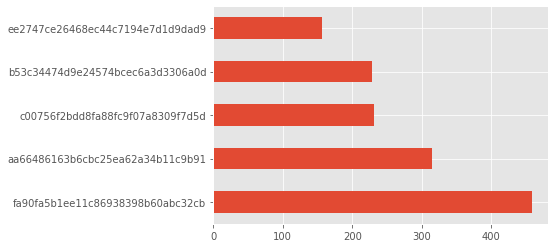

In [100]:
data["RescuerID"].value_counts().head().plot.barh()

In [101]:
st = set(data["RescuerID"].value_counts().values)
dict_resc = dict(data["RescuerID"].value_counts())
st = list(st)
st.sort(reverse=True) 
dict_rank = dict()
i = 1
for x in st:
    dict_rank[x] = i
    i += 1
data["RankRescuer"] = data["RescuerID"].apply(lambda x: dict_rank[dict_resc[x]]) 

## Количество видео

<AxesSubplot:>

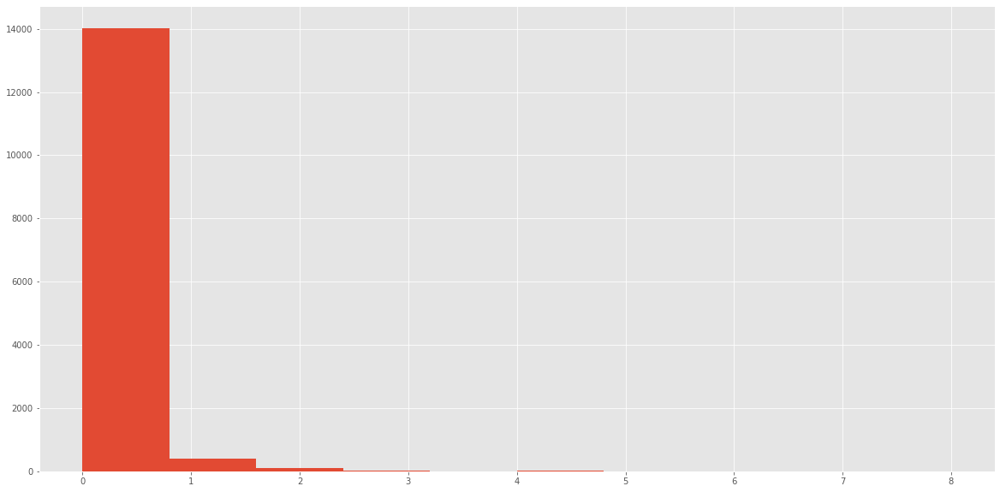

In [102]:
data['VideoAmt'].hist(figsize=(20,10))

In [103]:
data["VideoAmt"].value_counts(normalize=True)

0    0.961185
1    0.028323
2    0.006241
3    0.002400
4    0.001029
5    0.000343
6    0.000274
8    0.000137
7    0.000069
Name: VideoAmt, dtype: float64

<AxesSubplot:>

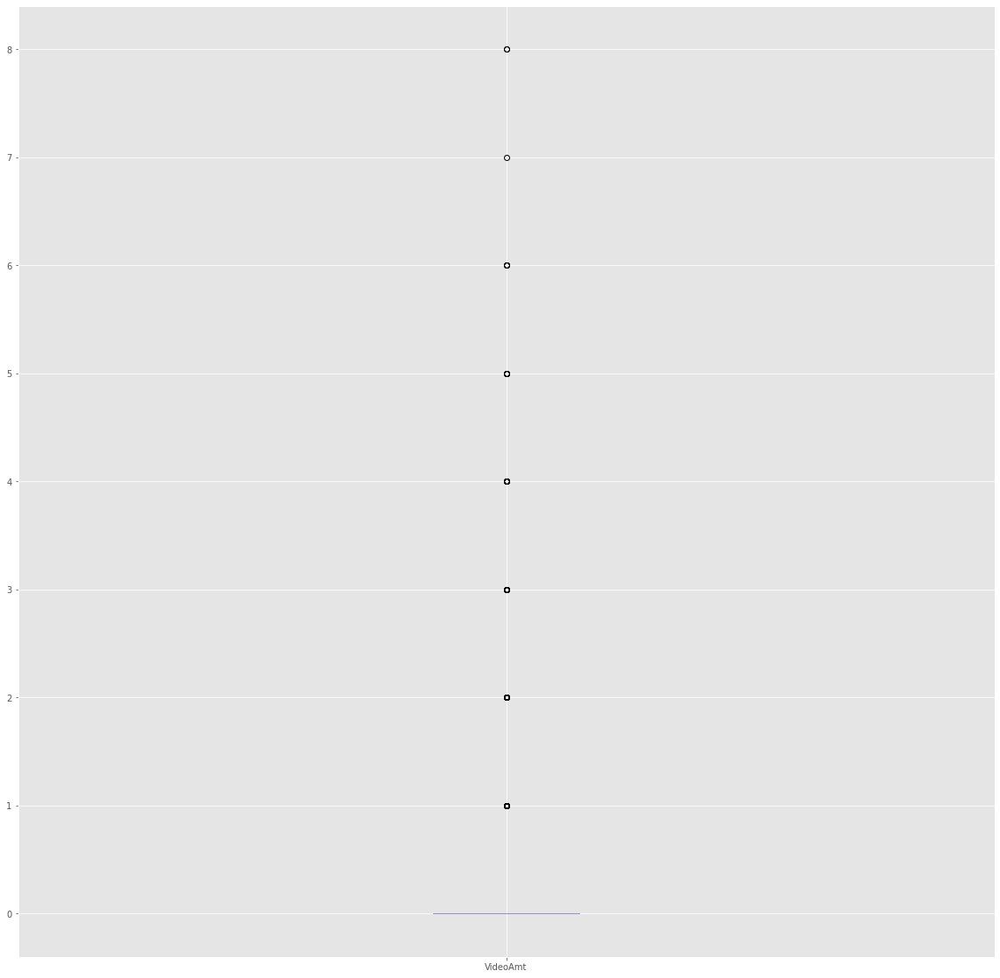

In [104]:
data["VideoAmt"].plot.box(figsize=(20,20))

In [105]:
data["has_video"] = data["VideoAmt"].apply(lambda x: 1 if x > 0 else 0)
data[data["has_video"] == 1][["VideoAmt", "has_video"]]

,VideoAmt,has_video
76,1,1
88,3,1
89,4,1
125,1,1
153,1,1
...,...,...
14892,1,1
14897,2,1
14950,1,1
14960,1,1


## Количество фото

In [106]:
print(F'Maximum amount of photos in {data["PhotoAmt"].max()}')

Maximum amount of photos in 30.0


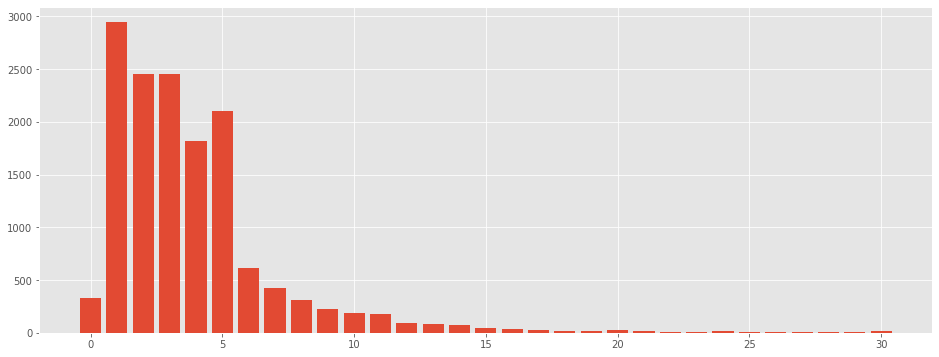

In [107]:
index = range(0, 31)
values = data['PhotoAmt'].value_counts().sort_index().to_numpy()
plt.figure(figsize=(16, 6));
plt.bar(index,values)
plt.show()

<AxesSubplot:>

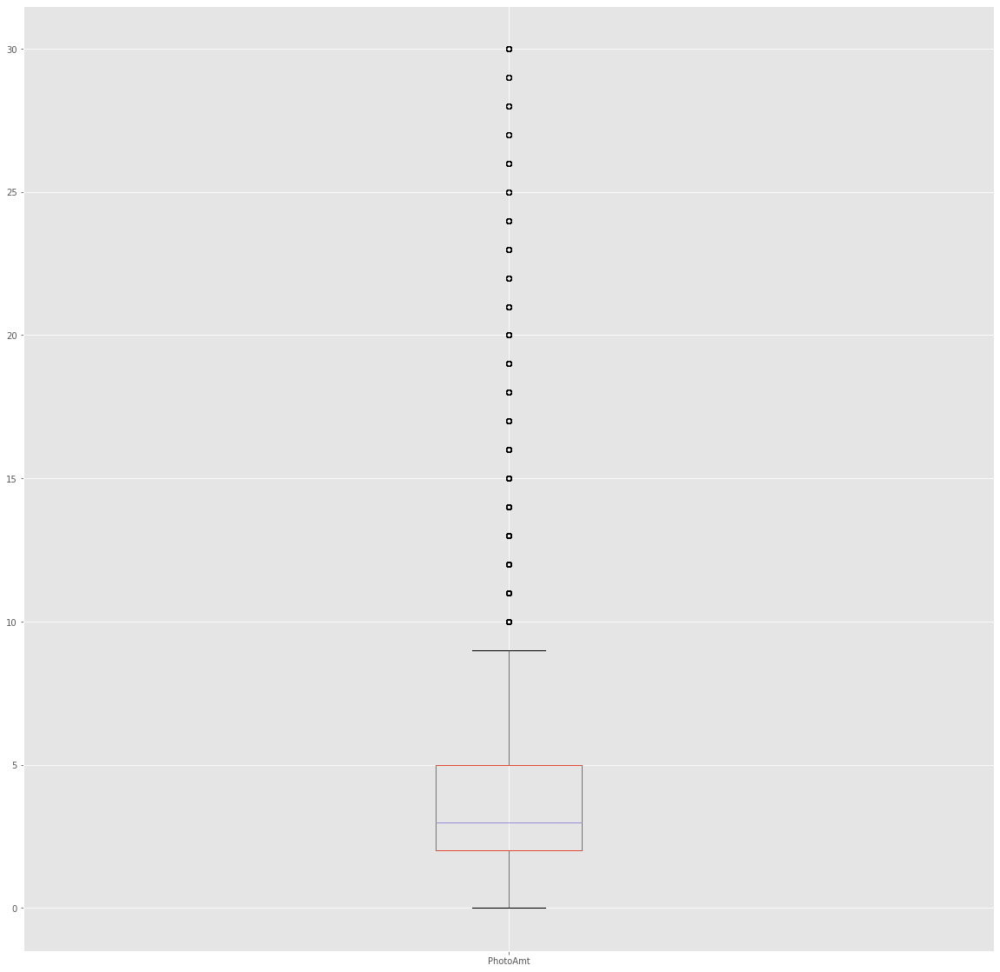

In [108]:
data["PhotoAmt"].plot.box(figsize=(20,20))

In [109]:
index,para = outlier_detect_IQR(data=data,col='PhotoAmt',threshold=1)
print('Верхняя граница:',para[0],'\nНижняя граница:',para[1])

Количество выбросов в данных: 1131
Доля выбросов: 0.07756137704018654
Верхняя граница: 8.0 
Нижняя граница: -1.0


In [110]:
data = impute_outlier_with_arbitrary(data=data,outlier_index=index, value= 8, col=['PhotoAmt'])

<AxesSubplot:>

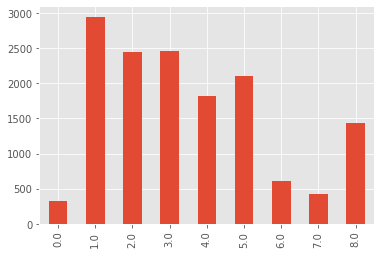

In [111]:
data['PhotoAmt'].value_counts().sort_index().plot.bar()

<AxesSubplot:>

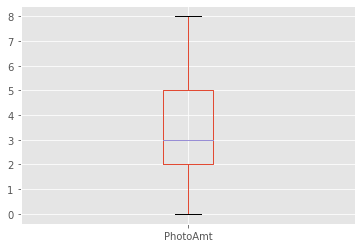

In [112]:
data['PhotoAmt'].plot.box()

## Описание

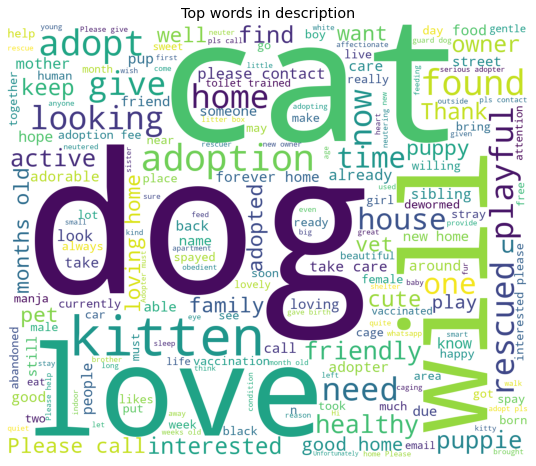

In [113]:
fig, ax = plt.subplots(figsize = (12, 8))
text_cat = ' '.join(data['Description'].fillna('').values)
wordcloud = WordCloud(max_font_size=None, background_color='white',
                      width=1200, height=1000).generate(text_cat)
plt.imshow(wordcloud)
plt.title('Top words in description');
plt.axis("off");

In [103]:
sentiment_dict = {}
for filename in os.listdir('../petfinder/train_sentiment/'):
    with open('../petfinder/train_sentiment/' + filename, 'r', errors='ignore') as f:
        sentiment = json.load(f)
    pet_id = filename.split('.')[0]
    sentiment_dict[pet_id] = {}
    sentiment_dict[pet_id]['magnitude'] = sentiment['documentSentiment']['magnitude']
    sentiment_dict[pet_id]['score'] = sentiment['documentSentiment']['score']
    sentiment_dict[pet_id]['language'] = sentiment['language']

In [104]:
data['lang'] = data['PetID'].apply(lambda x: sentiment_dict[x]['language'] if x in sentiment_dict else 'no')
data['magnitude'] = data['PetID'].apply(lambda x: sentiment_dict[x]['magnitude'] if x in sentiment_dict else 0)
data['score'] = data['PetID'].apply(lambda x: sentiment_dict[x]['score'] if x in sentiment_dict else 0)
data

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,...,full_color,full_health,one_pet,Free,State_name,RankRescuer,has_video,lang,magnitude,score
0,cat,Nibble,3,299,0,1,1,7,0,1,...,BlackWhite,2_2_2_1,1,0,Selangor,54,0,en,2.4,0.3
1,cat,no_name,1,265,0,1,1,2,0,2,...,BlackBrown,3_3_3_1,1,1,Kuala_Lumpur,61,0,en,0.7,-0.2
2,dog,Brisco,1,307,0,1,2,7,0,2,...,BrownWhite,1_1_2_1,1,1,Selangor,1,0,en,3.7,0.2
3,dog,Miko,4,307,0,2,1,2,0,2,...,BlackBrown,1_1_2_1,1,0,Kuala_Lumpur,19,0,en,0.9,0.9
4,dog,Hunter,1,307,0,1,1,0,0,2,...,Black,2_2_2_1,1,1,Selangor,6,0,en,3.7,0.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14988,cat,no_name,2,266,0,3,1,0,0,2,...,Black,2_2_2_1,0,1,Selangor,58,0,en,2.5,0.4
14989,cat,Serato & Eddie,24,265,264,3,1,4,7,2,...,BlackYellowWhite,1_1_1_1,0,1,Selangor,59,0,en,0.3,0.0
14990,cat,Monkies,2,265,266,3,5,6,7,3,...,CreamGrayWhite,2_1_3_1,0,0,Selangor,43,0,en,2.5,0.8
14991,cat,Ms Daym,9,266,0,2,4,7,0,1,...,YellowWhite,1_1_1_1,1,1,Johor,57,0,en,0.9,0.9


<AxesSubplot:>

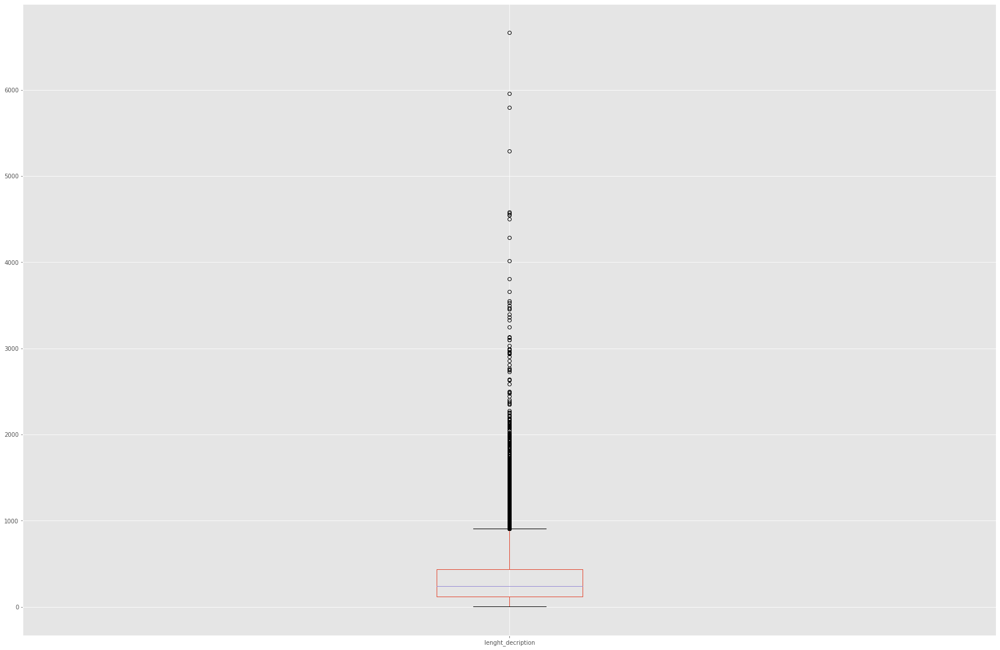

In [105]:
data["lenght_decription"] = data["Description"].apply(lambda x: len(x))
data["lenght_decription"].plot.box(figsize = (30, 20))

In [106]:
index,para = outlier_detect_IQR(data=data,col='lenght_decription',threshold=1)
print('Верхняя граница:',para[0],'\nНижняя граница:',para[1])

Количество выбросов в данных: 1334
Доля выбросов: 0.0914826498422713
Верхняя граница: 748.0 
Нижняя граница: -197.0


In [107]:
data = impute_outlier_with_arbitrary(data=data,outlier_index=index, value= 800, col=['lenght_decription'])

<AxesSubplot:>

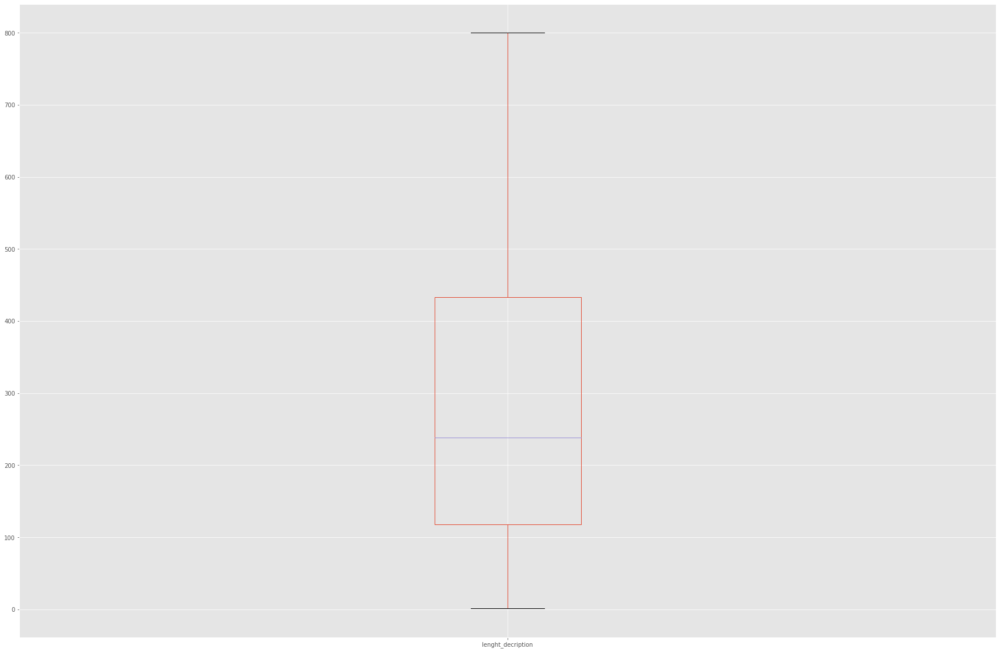

In [108]:
data["lenght_decription"].plot.box(figsize = (30, 20))

<AxesSubplot:>

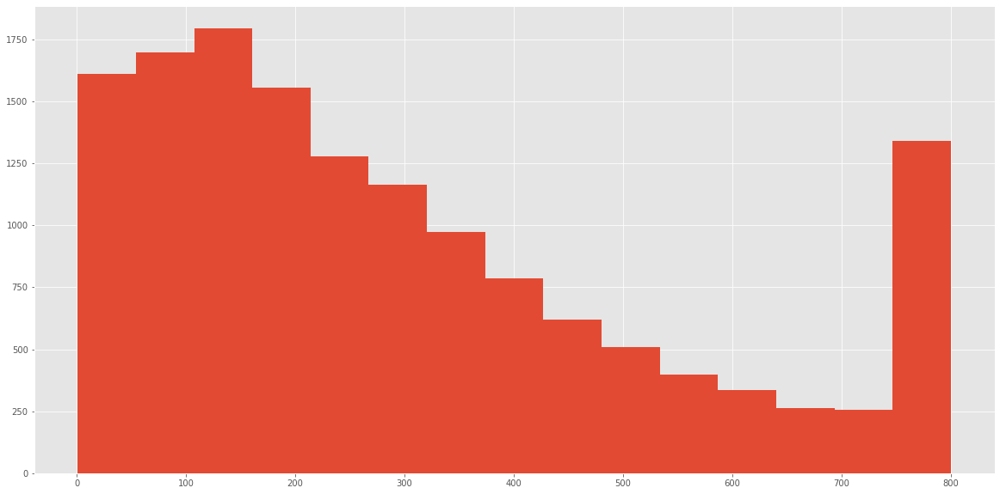

In [109]:
data["lenght_decription"].hist(figsize = (20, 10), bins = 15)

<AxesSubplot:>

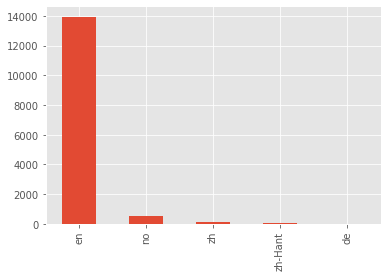

In [110]:
data["lang"].value_counts().plot.bar()

In [111]:
data["lang"].value_counts()

en         13939
no           511
zh            94
zh-Hant       36
de             2
Name: lang, dtype: int64

In [112]:
data[data["lang"] == 'zh']["Description"][1002] # китайский (упрощенный)

'小豹纹是一只两个月大的女生。她的性格非常活泼可爱。现在寻找一个有爱心，有耐心和有经济能力的有缘人来领养她。请一定要带她打三支预防针，过后每年打一支以及每个月放猫虱药。漂亮可爱的她在等着你带她回去哦!'

In [113]:
data[data["lang"] == 'en']["Description"][4] # английский

"This handsome yet cute boy is up for adoption. He is the most playful pal we've seen in our puppies. He loves to nibble on shoelaces , Chase you at such a young age. Imagine what a cute brat he will be when he grows. We are looking for a loving home for Hunter , one that will take care of him and give him the love that he needs. Please call urgently if you would like to adopt this cutie."

In [114]:
data[data["lang"] == 'zh-Hant']["Description"][571] # китайский (традиционный)

'有人可以給孩子們一個家嗎？ 有養貓經驗者優先... Whatsapp 救起來時，滿身黑油，好可憐，可以給孩子一個家嗎？ Puchong area........... 性格比较害怕人，只可以养在室内，要有养猫经验，要有耐心和他接触。。......'

In [115]:
data[data["lang"] == 'de']["Description"][14314] # немецкий

'Kiki Sgt manja dan aktiv.'

In [116]:
data.shape

(14582, 42)

In [117]:
data["lang"] = data["lang"].apply(lambda x: np.nan if x == 'de' else x)
data.dropna(inplace=True)
data.shape

(14580, 42)

In [118]:
data["lang"].value_counts()

en         13939
no           511
zh            94
zh-Hant       36
Name: lang, dtype: int64

In [119]:
data["lang"] = data["lang"].apply(lambda x: 'zh' if x == 'zh-Hant' else x) 

<AxesSubplot:>

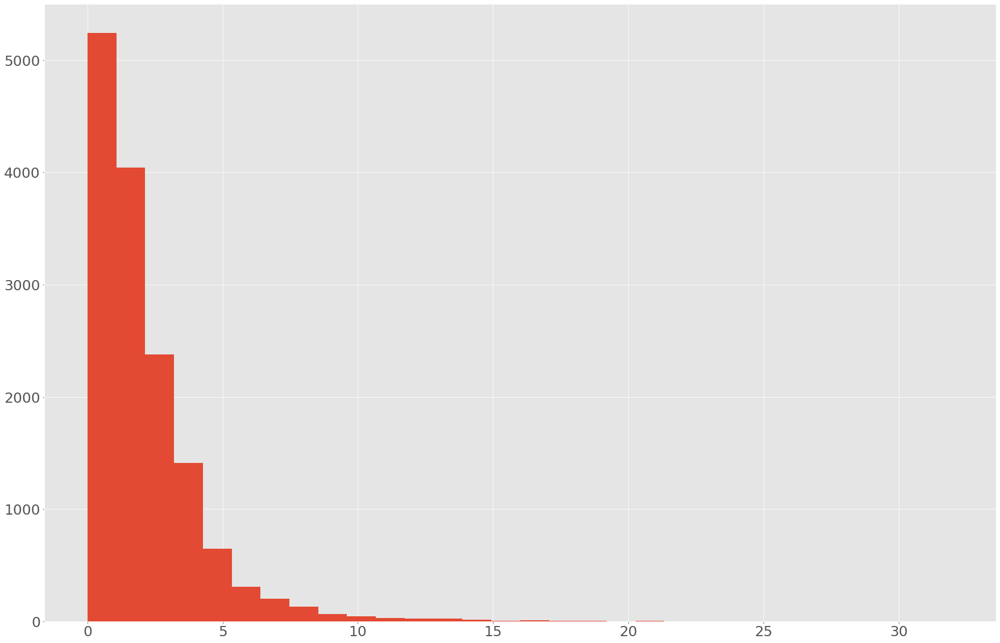

In [120]:
data["magnitude"].hist(bins = 30, figsize = (30, 20), xlabelsize=25, ylabelsize=25)

<AxesSubplot:>

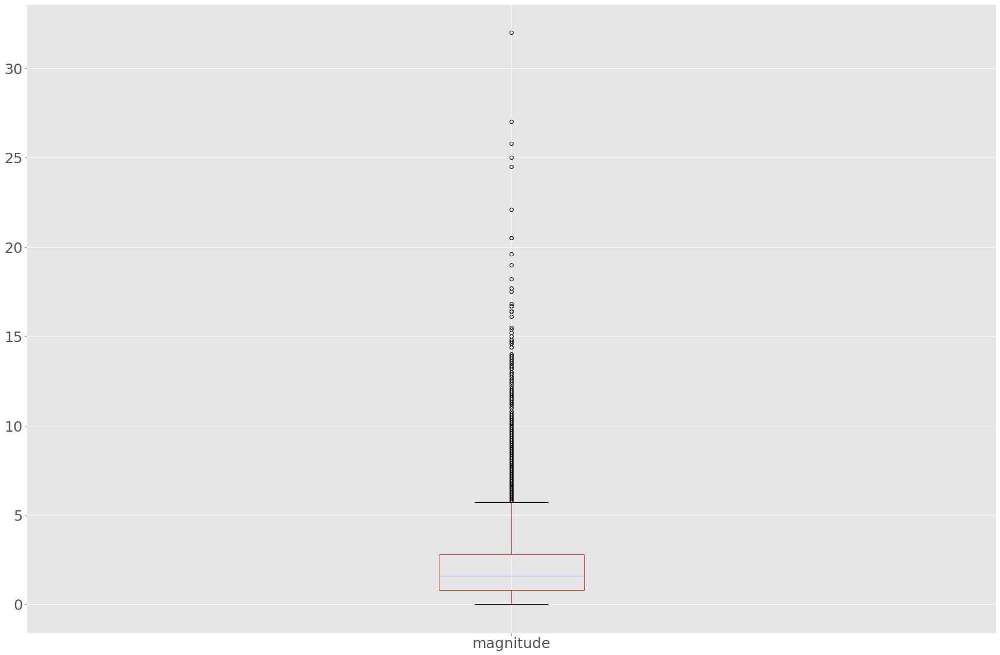

In [121]:
data["magnitude"].plot.box(fontsize=25, figsize=(30,20))

In [122]:
d_neg = data[data["score"] < -0.25][["Description", "score", "magnitude"]]
d_neg[d_neg["magnitude"] > 2]

,Description,score,magnitude
540,"Meet Baby Rosemary, one of the puppies that we...",-0.4,4.1
1544,Her name is Nicky She was dumped by her owner ...,-0.3,2.1
1981,please help me rescue this little baby..he's a...,-0.3,3.5
2603,"I found these poor kittens in Taipan, Subang. ...",-0.3,4.0
4561,Sep SPCA Ampang is relocating to a smaller pla...,-0.3,2.9
7271,I found her & her brother wandering about near...,-0.3,2.5
7566,Latte is one of three kittens that were rescue...,-0.3,4.6
8046,"suspected 2b lost, but posted everywhere tryin...",-0.3,3.0
8668,4 year old female siberian husky for adoption ...,-0.3,4.1
8915,"I found him when he was about 4 months, at our...",-0.3,2.7


In [123]:
index,para = outlier_detect_IQR(data=data,col='magnitude',threshold=1)
print('Верхняя граница:',para[0],'\nНижняя граница:',para[1])

Количество выбросов в данных: 1078
Доля выбросов: 0.07393689986282578
Верхняя граница: 4.8 
Нижняя граница: -1.1999999999999997


In [124]:
data = impute_outlier_with_arbitrary(data=data,outlier_index=index, value= 5, col=['magnitude'])

<AxesSubplot:>

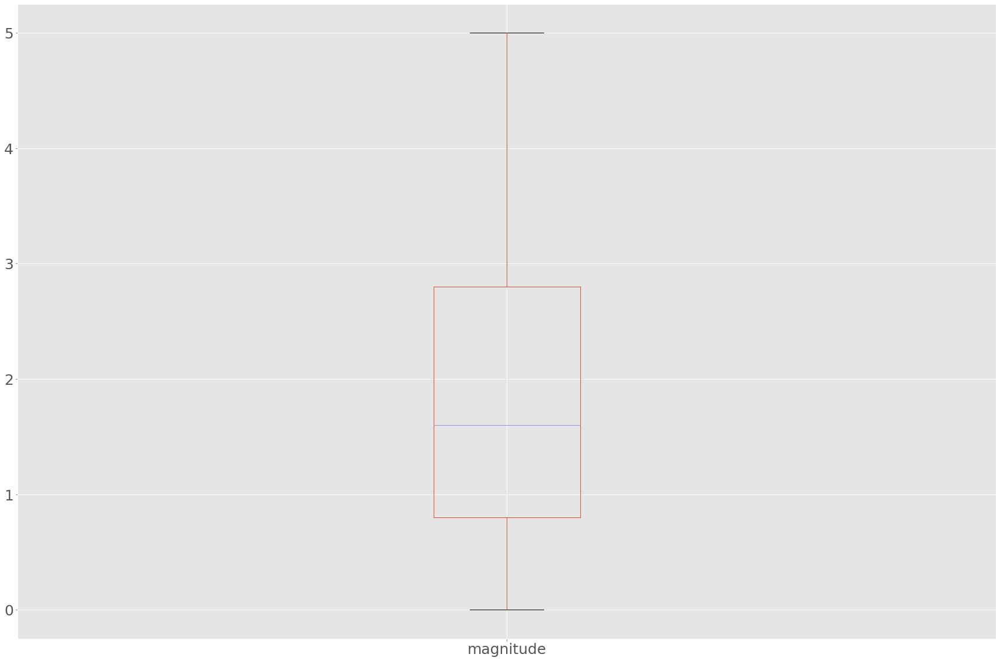

In [125]:
data["magnitude"].plot.box(fontsize=25, figsize=(30,20))

<AxesSubplot:>

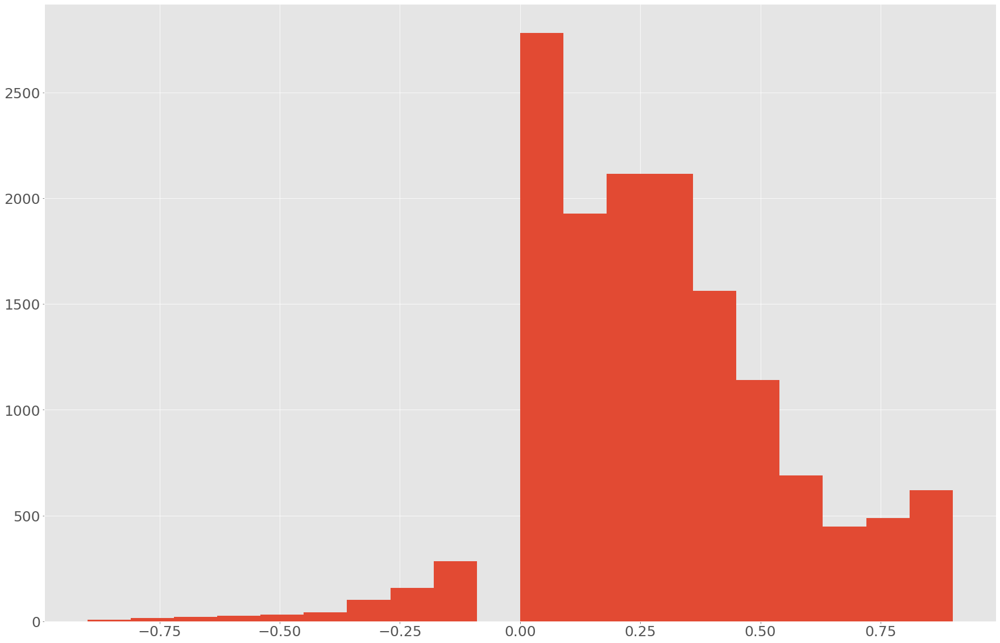

In [126]:
data["score"].hist(bins = 20, figsize = (30, 20), xlabelsize=25, ylabelsize=25)

## Информация с Google Vision API

In [127]:
metadata_dict = {}
i = 0
for filename in os.listdir('../petfinder/train_metadata/'):
    with open('../petfinder/train_metadata/' + filename, 'r', errors='ignore') as f:
        metadata = json.load(f)
    pet_id = filename.split('.')[0]
    if pet_id[-1] == '1':
        metadata_dict[pet_id[:-2]] = {}
        if 'labelAnnotations' in metadata:
            index = 0
            for i in range(0, len(metadata['labelAnnotations'])):
                desc = metadata['labelAnnotations'][i]['description']
                if desc.find('dog') != -1 or desc.find('cat') != -1:
                    index = i
                    break
            metadata_dict[pet_id[:-2]]['object_in_img'] = metadata['labelAnnotations'][index]['description']
            metadata_dict[pet_id[:-2]]['score_in_img'] = metadata['labelAnnotations'][index]['score']
        else:
            metadata_dict[pet_id[:-2]]['object_in_img'] = 'no'
            metadata_dict[pet_id[:-2]]['score_in_img'] = 0
metadata_dict

{'0008c5398': {'object_in_img': 'cat', 'score_in_img': 0.9943703},
 '000a290e4': {'object_in_img': 'dog', 'score_in_img': 0.96414083},
 '000fb9572': {'object_in_img': 'dog', 'score_in_img': 0.97213346},
 '0011d7c25': {'object_in_img': 'cat', 'score_in_img': 0.9923178},
 '00156db4a': {'object_in_img': 'dog', 'score_in_img': 0.95605063},
 '001a1aaad': {'object_in_img': 'cat', 'score_in_img': 0.97333777},
 '001b1507c': {'object_in_img': 'cat', 'score_in_img': 0.99399006},
 '002230dea': {'object_in_img': 'cat', 'score_in_img': 0.6242952},
 '002278114': {'object_in_img': 'skin', 'score_in_img': 0.9343813},
 '002278114-': {'object_in_img': 'cat', 'score_in_img': 0.99444574},
 '0025a8313': {'object_in_img': 'cat', 'score_in_img': 0.97613597},
 '0038234c6': {'object_in_img': 'dog', 'score_in_img': 0.9712321},
 '0038c9343': {'object_in_img': 'dog', 'score_in_img': 0.9496203},
 '003dd2e26': {'object_in_img': 'cat', 'score_in_img': 0.91389936},
 '0045ed62a': {'object_in_img': 'cat', 'score_in_img

In [128]:
data['object_in_img'] = data['PetID'].apply(lambda x: metadata_dict[x]['object_in_img'] if x in metadata_dict else 'no')
data['score_in_img'] = data['PetID'].apply(lambda x: metadata_dict[x]['score_in_img'] if x in metadata_dict else 0)
data

,Type,Name,Age,Breed1,Breed2,Gender,Color1,Color2,Color3,MaturitySize,...,Free,State_name,RankRescuer,has_video,lang,magnitude,score,lenght_decription,object_in_img,score_in_img
0,cat,Nibble,3,299,0,1,1,7,0,1,...,0,Selangor,54,0,en,2.4,0.3,359,cat,0.990786
1,cat,no_name,1,265,0,1,1,2,0,2,...,1,Kuala_Lumpur,61,0,en,0.7,-0.2,118,cat,0.981269
2,dog,Brisco,1,307,0,1,2,7,0,2,...,1,Selangor,1,0,en,3.7,0.2,393,dog,0.960457
3,dog,Miko,4,307,0,2,1,2,0,2,...,0,Kuala_Lumpur,19,0,en,0.9,0.9,146,dog,0.978698
4,dog,Hunter,1,307,0,1,1,0,0,2,...,1,Selangor,6,0,en,3.7,0.6,390,dog,0.984346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14988,cat,no_name,2,266,0,3,1,0,0,2,...,1,Selangor,58,0,en,2.5,0.4,396,cat,0.988874
14989,cat,Serato & Eddie,24,265,264,3,1,4,7,2,...,1,Selangor,59,0,en,0.3,0.0,172,cat,0.988031
14990,cat,Monkies,2,265,266,3,5,6,7,3,...,0,Selangor,43,0,en,2.5,0.8,64,cat,0.954626
14991,cat,Ms Daym,9,266,0,2,4,7,0,1,...,1,Johor,57,0,en,0.9,0.9,133,cat,0.993517


In [129]:
data["object_in_img"].value_counts()

cat                6273
dog                5875
dog breed          1193
dog like mammal     646
no                  333
                   ... 
clothing              1
hair                  1
hand                  1
meal                  1
road                  1
Name: object_in_img, Length: 64, dtype: int64

In [130]:
data["object_in_img"] = data["object_in_img"].apply(lambda x: "cat" if x.find("cat") != -1 else ("dog" if x.find("dog") != -1 else x))

In [131]:
data["object_in_img"].value_counts()

dog                  7802
cat                  6323
no                    333
fauna                  23
mammal                 11
cage                    8
plant                   5
floor                   4
furniture               4
structure               4
yellow                  3
blue                    3
skin                    3
car                     3
text                    3
face                    3
textile                 2
grass                   2
black                   2
light                   2
animal shelter          2
product                 2
vertebrate              2
fur                     2
hand                    1
rock                    1
window                  1
plush                   1
leg                     1
fashion accessory       1
photo caption           1
wheel                   1
footwear                1
white                   1
iron                    1
facial hair             1
wildlife                1
room                    1
stairs      

In [132]:
data["object_in_img"].value_counts().drop('dog').drop('cat').drop('no').sum()

122

In [133]:
data["object_in_img"] = data["object_in_img"].apply(lambda x: "cat" if x.find("cat") != -1 else ("dog" if x.find("dog") != -1 else 'no'))
data.loc[data["object_in_img"] == 'no', "score_in_img"] = 0

<AxesSubplot:>

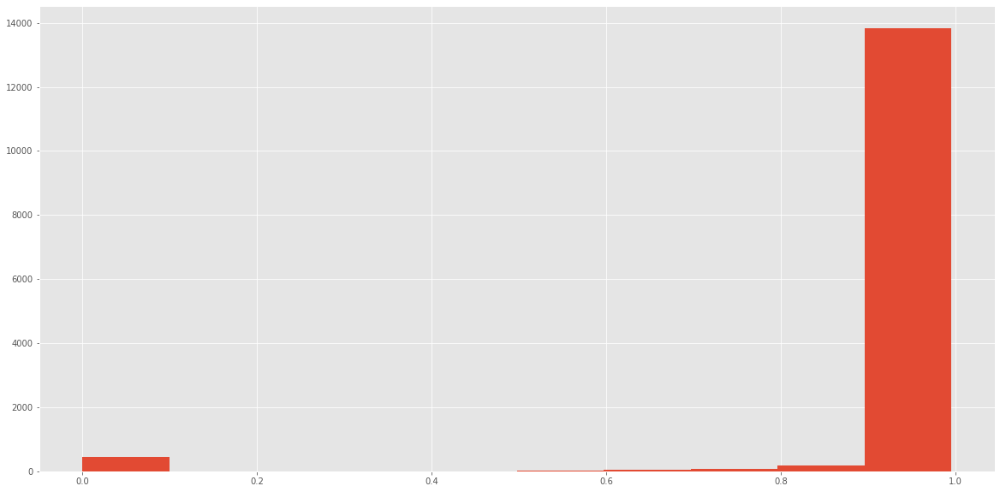

In [134]:
data["score_in_img"].hist(figsize=(20,10))

## Целевая переменная (скорость, с которой заберут питомца)
- 0 — питомец был принят в семью в тот же день, как его занесли в список
- 1 — животное было принято в семью в период от 1 до 7 дней (1 неделя) после внесения в список
- 2 — животное было принято в семью в период от 8 до 30 дней (1 месяц) после внесения в список
- 3 — животное было принято в семью в период от 31 до 90 дней (2-3 месяц) после внесения в список
- 4 — животное не было принято в семью после 100 дней ожидания

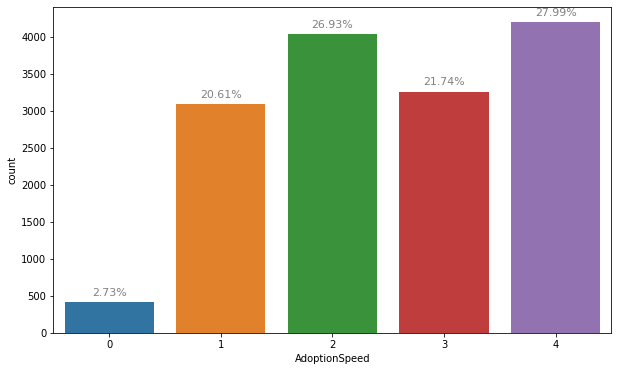

In [10]:
plt.figure(figsize=(10, 6));
g = sns.countplot(x='AdoptionSpeed', data=data)
# plt.title('Количество животных в каждом из классов');
ax=g.axes
for p in ax.patches:
     ax.annotate(f"{p.get_height() * 100 / data.shape[0]:.2f}%", (p.get_x() + p.get_width() / 2., p.get_height()),
         ha='center', va='center', fontsize=11, color='gray', rotation=0, xytext=(0, 10),
         textcoords='offset points') 

In [11]:
data["AdoptionSpeed"].value_counts()

4    4197
2    4037
3    3259
1    3090
0     410
Name: AdoptionSpeed, dtype: int64

## Выбираем признаки для обучения
### Препроцессинг

In [136]:
data.columns

Index(['Type', 'Name', 'Age', 'Breed1', 'Breed2', 'Gender', 'Color1', 'Color2',
       'Color3', 'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
       'Sterilized', 'Health', 'Quantity', 'Fee', 'State', 'RescuerID',
       'VideoAmt', 'Description', 'PetID', 'PhotoAmt', 'AdoptionSpeed',
       'No_name', 'Pure_breed', 'Breed1_name', 'Breed2_name', 'Color1_name',
       'Color2_name', 'Color3_name', 'full_color', 'full_health', 'one_pet',
       'Free', 'State_name', 'RankRescuer', 'has_video', 'lang', 'magnitude',
       'score', 'lenght_decription', 'object_in_img', 'score_in_img'],
      dtype='object')

In [137]:
data_tree = data.copy()

In [138]:
data_tree["Gender"] = data_tree["Gender"].apply(lambda x: 'male' if x == 1 else ('female' if x == 2 else 'mixed'))
data_tree["MaturitySize"] = data_tree["MaturitySize"].apply(lambda x: 'small' if x == 1 else ('medium' if x == 2 else ('large' if x == 3 else 'extra large')))
data_tree["FurLength"] = data_tree["FurLength"].apply(lambda x: 'short' if x == 1 else ('medium' if x == 2 else 'long'))
data_tree["Vaccinated"] = data_tree["Vaccinated"].apply(lambda x: 'yes' if x == 1 else ('no' if x == 2 else 'not sure'))
data_tree["Dewormed"] = data_tree["Dewormed"].apply(lambda x: 'yes' if x == 1 else ('no' if x == 2 else 'not sure'))
data_tree["Sterilized"] = data_tree["Sterilized"].apply(lambda x: 'yes' if x == 1 else ('no' if x == 2 else 'not sure'))
data_tree["Health"] = data_tree["Health"].apply(lambda x: 'Healthy' if x == 1 else ('Minor Injury' if x == 2 else 'Serious Injury'))

In [139]:
data_tree = data_tree[['Type', 'No_name', 'Age','Breed1', 'Breed2', 'Gender', 'Color1_name', 'Color2_name', 'Color3_name',
                       'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed', 'Sterilized', 'Health', 
                       'Quantity', 'Fee', 'State_name', 'RankRescuer', 'has_video', 'PhotoAmt', 'lang', 'magnitude', 
                       'score', 'lenght_decription', 'object_in_img', 'score_in_img', 'AdoptionSpeed']]

In [140]:
def encodeTextVariable(data, variables):
    for var in variables:
        labelEncoder = LabelEncoder()
        data[var] = labelEncoder.fit_transform(data[var])

encodeTextVariable(data=data_tree, variables=['Type', 'Breed1', 'Breed2', 'Gender', 'MaturitySize', 'FurLength', 
                                              'Vaccinated', 'Dewormed', 'Sterilized', 'Health', 
                                              'Color1_name', 'Color2_name', 'Color3_name', 'State_name', 
                                              'lang', 'object_in_img'])
data_tree

,Type,No_name,Age,Breed1,Breed2,Gender,Color1_name,Color2_name,Color3_name,MaturitySize,...,RankRescuer,has_video,PhotoAmt,lang,magnitude,score,lenght_decription,object_in_img,score_in_img,AdoptionSpeed
0,0,0,3,164,0,1,0,5,0,3,...,54,0,1.0,0,2.4,0.3,359,0,0.990786,2
1,0,1,1,133,0,1,0,1,0,2,...,61,0,2.0,0,0.7,-0.2,118,0,0.981269,0
2,1,0,1,172,0,1,1,5,0,2,...,1,0,7.0,0,3.7,0.2,393,1,0.960457,3
3,1,0,4,172,0,0,0,1,0,2,...,19,0,8.0,0,0.9,0.9,146,1,0.978698,2
4,1,0,1,172,0,1,0,0,0,2,...,6,0,3.0,0,3.7,0.6,390,1,0.984346,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14988,0,1,2,134,0,2,0,0,0,2,...,58,0,3.0,0,2.5,0.4,396,0,0.988874,2
14989,0,0,24,133,99,2,0,6,4,2,...,59,0,3.0,0,0.3,0.0,172,0,0.988031,4
14990,0,0,2,133,101,2,2,4,4,1,...,43,0,5.0,0,2.5,0.8,64,0,0.954626,3
14991,0,0,9,134,0,0,6,5,0,3,...,57,0,3.0,0,0.9,0.9,133,0,0.993517,4


In [141]:
X = data_tree.drop('AdoptionSpeed', axis=1)
y = data_tree['AdoptionSpeed']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y) 
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((11664, 27), (2916, 27), (11664,), (2916,))

## Target Encoding + Normalization

In [142]:
to_encode = ['Gender', 'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
                      'Sterilized', 'Health', 'Color1_name', 'Color2_name', 'Color3_name',
                      'State_name', 'lang', 'object_in_img']
target_enc = ce.TargetEncoder(cols=to_encode).fit(X_train,y_train)
X_train_tar = target_enc.transform(X_train)
X_test_tar = target_enc.transform(X_test)

In [143]:
ss = StandardScaler().fit(X_train_tar)
X_train_tar = ss.transform(X_train_tar)
X_test_tar = ss.transform(X_test_tar)
y_train_tar = y_train
y_test_tar = y_test

## One-Hot Encoding + Normalizaton

In [144]:
to_dummies = [ # переменные, которые сейчас не числовые
    'Gender', 'MaturitySize', 'FurLength', 'Vaccinated', 'Dewormed',
                      'Sterilized', 'Health', 'Color1_name', 'Color2_name', 'Color3_name',
                      'State_name', 'lang', 'object_in_img']

# Закодированные категориальные переменные методом OneHot Encoding
data_ohe = pd.get_dummies(data_tree, columns=to_dummies, drop_first=True)
data_ohe.shape

(14580, 56)

In [145]:
X_ohe = data_ohe.drop('AdoptionSpeed', axis=1)
y_ohe = data_ohe['AdoptionSpeed']
X_train_ohe, X_test_ohe, y_train_ohe, y_test_ohe = train_test_split(X_ohe, y_ohe, test_size=0.2, random_state=42, stratify=y) 
X_train_ohe.shape, X_test_ohe.shape, y_train_ohe.shape, y_test_ohe.shape

((11664, 55), (2916, 55), (11664,), (2916,))

In [146]:
ss = StandardScaler().fit(X_train_ohe)
X_train_ohe = ss.transform(X_train_ohe)
X_test_ohe = ss.transform(X_test_ohe) 

## Построим baseline
Необходимо построить baseline. Хороший baseline копирует распределение целевой переменной на train.

In [147]:
y_train.value_counts(normalize=True) # смотрим изначальное распределение целевой переменной

4    0.276063
2    0.271433
3    0.219050
1    0.206361
0    0.027092
Name: AdoptionSpeed, dtype: float64

In [152]:
y_naive_pred = np.random.choice(
    [4., 2., 3., 1., 0.], 
    len(y_test), 
    p=y_train.value_counts(normalize=True).values) # p - вероятности

Наивное предсказание в точности повторяет распределение тренировочной выборки

<AxesSubplot:>

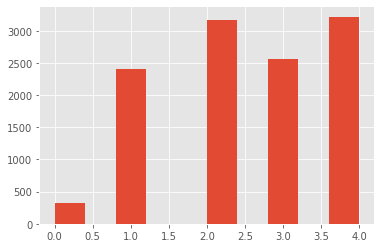

In [153]:
y_train.hist()

(array([ 83.,   0., 569.,   0.,   0., 799.,   0., 648.,   0., 817.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <BarContainer object of 10 artists>)

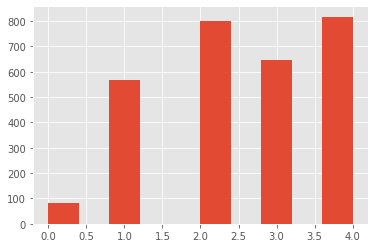

In [154]:
plt.hist(y_naive_pred)

0.021974708694860734


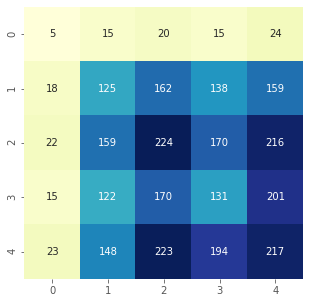

In [155]:
print(cohen_kappa_score(y_test, y_naive_pred, weights='quadratic'))

cm = confusion_matrix(y_test, y_naive_pred)

conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);
# внизу предсказанные метки, слева - истинные метки

## Деревья решений

In [156]:
tree_clf = DecisionTreeClassifier(max_depth=2, class_weight='balanced') # кол-во разбиений (уровней = глубина + 1)
tree_clf.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=2)

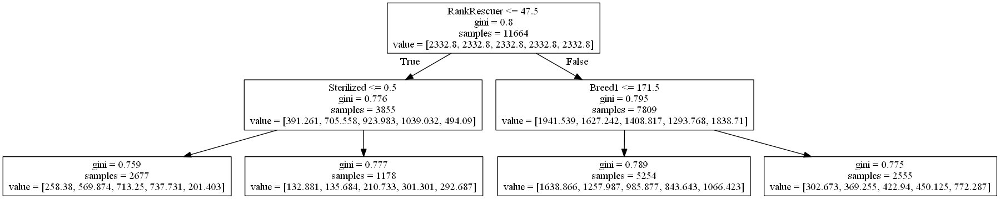

In [157]:
graph = Source(sklearn.tree.export_graphviz(tree_clf, out_file=None, feature_names=X.columns))
png_bytes = graph.pipe(format='png')
with open('dtree_pipe.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

In [158]:
print(cohen_kappa_score(y_test, tree_clf.predict(X_test), weights='quadratic'))

0.09047269931245372


In [159]:
tree_clf = DecisionTreeClassifier(max_depth=2, class_weight='balanced') # кол-во разбиений (уровней = глубина + 1)
tree_clf.fit(X_train_ohe, y_train_ohe)

DecisionTreeClassifier(class_weight='balanced', max_depth=2)

In [160]:
print(cohen_kappa_score(y_test_ohe, tree_clf.predict(X_test_ohe), weights='quadratic'))

0.09047269931245372


In [161]:
tree_clf = DecisionTreeClassifier(max_depth=2, class_weight='balanced') # кол-во разбиений (уровней = глубина + 1)
tree_clf.fit(X_train_tar, y_train_tar)

DecisionTreeClassifier(class_weight='balanced', max_depth=2)

In [162]:
print(cohen_kappa_score(y_test_tar, tree_clf.predict(X_test_tar), weights='quadratic'))

0.09047269931245372


In [163]:
scores =[]
for depth in range(2, 30):
    tree_clf = DecisionTreeClassifier(max_depth=depth, class_weight='balanced')
    tree_clf.fit(X_train, y_train)
    scores.append(cohen_kappa_score(y_test, tree_clf.predict(X_test), weights='quadratic'))

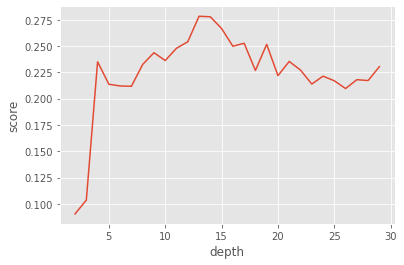

In [164]:
plt.plot(range(2, 30), scores)
plt.xlabel('depth')
plt.ylabel('score')
plt.show()

In [165]:
# функция для подбора наилучших параметров
def grid_search_cv(model, param_grid, x_train, y_train):
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=7)
    kappa_scorer = make_scorer(cohen_kappa_score, weights = 'quadratic')
    grid_search = GridSearchCV(model, param_grid, cv=kfold, scoring=kappa_scorer, verbose=4)
    t_start = time.time()
    grid_search.fit(x_train, y_train)
    t_end = time.time()
    print('model {} best score is {}'.format(model.__class__.__name__, grid_search.best_score_))
    print('time for training is {} seconds'.format(t_end - t_start))
    print(f"Best params = {grid_search.best_estimator_}")
    return grid_search.best_estimator_

In [166]:
# функция для подбора наилучших параметров
def randomized_cv(model, param_grid, x_train, y_train, n_iter = 20):
    kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=7)
    kappa_scorer = make_scorer(cohen_kappa_score, weights = 'quadratic')
    grid_search = RandomizedSearchCV(model, param_grid, cv=kfold, scoring=kappa_scorer, verbose=100, n_iter=n_iter)
    t_start = time.time()
    grid_search.fit(x_train, y_train)
    t_end = time.time()
    print('model {} best accuracy score is {}'.format(model.__class__.__name__, grid_search.best_score_))
    print('time for training is {} seconds'.format(t_end - t_start))
    print(grid_search.best_score_)
    print(f"Best params = {grid_search.best_estimator_}")
    return grid_search.best_estimator_

In [167]:
param_grid = {
    'max_depth': range(2,30),
    'min_samples_leaf': list(range(3,11)), # минимальное количество наблюдений в листе
    'class_weight': [None, 'balanced'],
    'criterion': ["gini", "entropy"]
}
tree_model = grid_search_cv(DecisionTreeClassifier(random_state=42), param_grid, X_train, y_train)

Fitting 10 folds for each of 896 candidates, totalling 8960 fits
[CV 1/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weigh

[CV 3/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total ti

[CV 5/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total ti

[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total ti

[CV 10/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total ti

[CV 1/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total ti

[CV 3/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total ti

[CV 5/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total ti

[CV 7/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5

[CV 8/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5

[CV 10/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5

[CV 1/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5

[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6

[CV 5/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6

[CV 7/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6

[CV 9/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6

[CV 1/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6

[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=7

[CV 3/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7

[CV 5/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7

[CV 7/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7

[CV 8/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7

[CV 9/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7

[CV 10/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7

[CV 2/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=8

[CV 4/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=8

[CV 6/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=2

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=3

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=4

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=6

[CV 8/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=7

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=8

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=9

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, ma

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, ma

[CV 2/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, ma

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, ma

[CV 9/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, ma

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, ma

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, ma

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, ma

[CV 9/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, ma

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, ma

[CV 5/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, ma

[CV 3/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, ma

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, ma

[CV 9/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, ma

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, ma

[CV 5/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, ma

[CV 3/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, ma

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, ma

[CV 9/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, ma

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, m

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, m

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini,

[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gin

[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gi

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterio

[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, 

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced,

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, c

[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, cr

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, cri

[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, crit

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, crite

[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criteri

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterio

[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterio

[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterio

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterio

[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterio

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterio

[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterio

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterio

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterio

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterio

[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterio

[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterio

[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=

[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=

[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END clas

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END clas

[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=10; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END cla

[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END 

[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 2/10] 

[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=9; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=9; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=9; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=9; total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=9; total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=9; total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=9; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=9; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.1s
[CV 2/10] END cla

[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 8/10] END clas

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 3/10] END clas

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END clas

[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END clas

[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END clas

[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END clas

[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END clas

[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END clas

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END clas

[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.2s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END clas

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.2s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.3s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.2s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END clas

model DecisionTreeClassifier best score is 0.29034115049362014
time for training is 1325.1748476028442 seconds
Best params = DecisionTreeClassifier(max_depth=8, min_samples_leaf=3, random_state=42)


In [168]:
tree_model = grid_search_cv(DecisionTreeClassifier(random_state=42), param_grid, X_train_ohe, y_train_ohe)

Fitting 10 folds for each of 896 candidates, totalling 8960 fits
[CV 1/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weigh

[CV 5/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total ti

[CV 7/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total ti

[CV 8/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=4; total ti

[CV 10/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total ti

[CV 1/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total ti

[CV 3/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total ti

[CV 5/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total ti

[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5

[CV 8/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5

[CV 10/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=5

[CV 2/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=6

[CV 4/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.2s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=6

[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6

[CV 6/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6

[CV 8/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6

[CV 9/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6

[CV 10/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6

[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=7

[CV 3/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7

[CV 4/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7

[CV 5/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7

[CV 6/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7

[CV 7/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7

[CV 8/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7

[CV 9/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7

[CV 10/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7

[CV 2/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8

[CV 3/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=2

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=4

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=5

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=6

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=7

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=8

[CV 10/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=9

[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, ma

[CV 8/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, ma

[CV 2/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, ma

[CV 10/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=5; total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, ma

[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, ma

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, ma

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, ma

[CV 2/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, ma

[CV 10/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, ma

[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=4; total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, ma

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=4; total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.2s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, ma

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, ma

[CV 2/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, ma

[CV 10/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, ma

[CV 8/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.2s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, ma

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=3; total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, ma

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=3; total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=3; total time=   0.2s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=3; total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=3; total time=   0.2s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=3; total time=   0.2s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=3; total time=   0.2s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=3; total time=   0.2s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, ma

[CV 2/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.2s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, ma

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.2s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.2s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, ma

[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, 

[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, 

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini,

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=5, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini,

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gin

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=g

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterio

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=9; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, c

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, cri

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, crite

[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 3/10] END class_weight=balanced, criter

[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=9; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterio

[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterio

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterio

[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterio

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterio

[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterio

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterio

[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterio

[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterio

[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterio

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterio

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterio

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterio

[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterio

[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterio

[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterio

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=

[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=

[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=

[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=

[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=

[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=

[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END clas

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END clas

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=10; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=10; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=10; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END c

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=10; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 3/10] E

[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=9; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=9; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=9; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=9; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=9; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=9; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=10; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=10; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=10; total time=   0.1s
[CV 4/10] END c

[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 4/10] END clas

[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END clas

[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END clas

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END clas

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END clas

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END clas

[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END clas

[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=4; total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END clas

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.2s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END clas

[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=3; total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END clas

[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.2s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=3; total time=   0.2s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=28, min_samples_leaf=4; total time=   0.2s
[CV 4/10] END clas

[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.2s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.2s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END clas

[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=10; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=10; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=10; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=10; total time=   0.1s
model DecisionTreeClassifier best score is 0.2892942243476467
time for training is 1438.3611710071564 seconds
Best params = DecisionTreeClassifier(max_depth=8, min_samples_leaf=3, random_state=42)


In [169]:
tree_model = grid_search_cv(DecisionTreeClassifier(random_state=42), param_grid, X_train_tar, y_train_tar)

Fitting 10 folds for each of 896 candidates, totalling 8960 fits
[CV 1/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weigh

[CV 5/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=4; total ti

[CV 9/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=4; total ti

[CV 3/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=6, min_samples_leaf=5; total ti

[CV 4/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=7, min_samples_leaf=5; total ti

[CV 7/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=8, min_samples_leaf=5; total ti

[CV 9/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=5; total ti

[CV 2/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=10, min_samples_leaf=6

[CV 4/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=6

[CV 5/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=6

[CV 6/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=14, min_samples_leaf=6

[CV 7/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=6

[CV 10/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=6

[CV 1/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=6

[CV 3/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=18, min_samples_leaf=7

[CV 4/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=19, min_samples_leaf=7

[CV 5/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=20, min_samples_leaf=7

[CV 7/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=21, min_samples_leaf=7

[CV 8/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=22, min_samples_leaf=7

[CV 9/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=23, min_samples_leaf=7

[CV 10/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=24, min_samples_leaf=7

[CV 1/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=25, min_samples_leaf=7

[CV 2/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=26, min_samples_leaf=8

[CV 3/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=27, min_samples_leaf=8

[CV 4/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=28, min_samples_leaf=8

[CV 6/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=gini, max_depth=29, min_samples_leaf=8

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=2

[CV 9/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=3

[CV 8/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=4

[CV 5/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=6, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=6

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=7, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=7

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=8, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=8

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=9

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=None, criterion=entropy, ma

[CV 3/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=11, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, ma

[CV 2/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=12, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, ma

[CV 10/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, ma

[CV 8/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=14, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, ma

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=15, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, ma

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, ma

[CV 4/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, ma

[CV 9/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, ma

[CV 7/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=20, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, ma

[CV 6/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=21, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, ma

[CV 5/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=22, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, ma

[CV 3/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=23, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, ma

[CV 1/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=24, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, ma

[CV 5/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, ma

[CV 3/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, ma

[CV 8/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=None, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=None, criterion=entropy, ma

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=2, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, m

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=3, min_samples_leaf=4; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, m

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=3; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=4, min_samples_leaf=4; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, m

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, m

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, m

[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=8, min_samples_leaf=3; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, 

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=9, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=3; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=3; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterio

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, cr

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, cr

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=12, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=3; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=3; total time=   0.0s
[CV 4/10] END class_weight=balanced, cr

[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=13, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=3; total time=   0.0s
[CV 2/10] END class_weight=balanced, 

[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 10/10] END class_weight=balanced,

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, c

[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 7/10] END class_weight=balanced, cr

[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 6/10] END class_weight=balanced, cri

[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, crit

[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criter

[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterio

[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=21, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterio

[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=22, min_samples_leaf=9; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterio

[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=23, min_samples_leaf=9; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterio

[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=24, min_samples_leaf=9; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterio

[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=25, min_samples_leaf=9; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterio

[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=26, min_samples_leaf=8; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterio

[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=27, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterio

[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=gini, max_depth=28, min_samples_leaf=8; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterio

[CV 8/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=gini, max_depth=29, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterio

[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=2, min_samples_leaf=8; total time=   0.0s
[CV 5/10] END class_weight=

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=7; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=3, min_samples_leaf=8; total time=   0.0s
[CV 3/10] END class_weight=

[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=4, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=

[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=5, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=6, min_samples_leaf=7; total time=   0.0s
[CV 3/10] END class_weight=

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=6; total time=   0.0s
[CV 1/10] END class_weight=

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=6; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=6; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=6; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=6; total time=   0.0s
[CV 7/10] END class_weight=

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=5; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=6; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=9, min_samples_leaf=6; total time=   0.0s
[CV 3/10] END class_weight=

[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=5; total time=   0.0s
[CV 9/10] END clas

[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=4; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=5; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=11, min_samples_leaf=5; total time=   0.0s
[CV 5/10] END clas

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=12, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END clas

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.0s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=4; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=4; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=4; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=13, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END clas

[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=3; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=4; total time=   0.1s
[CV 2/10] END clas

[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=14, min_samples_leaf=10; total time=   0.0s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=15, min_samples_leaf=3; total time=   0.1s
[CV 9/10] END cla

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.0s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=16, min_samples_leaf=10; total time=   0.1s
[CV 1/10]

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=9; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=10; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=10; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=10; total time=   0.0s
[CV 7/10] EN

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=9; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=10; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=10; total time=   0.1s
[CV 3/10] END cl

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=8; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=9; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=20, min_samples_leaf=9; total time=   0.1s
[CV 3/10] END clas

[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=8; total time=   0.0s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=21, min_samples_leaf=8; total time=   0.1s
[CV 9/10] END clas

[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.0s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=7; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=22, min_samples_leaf=8; total time=   0.1s
[CV 4/10] END clas

[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.0s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=23, min_samples_leaf=7; total time=   0.1s
[CV 10/10] END clas

[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=24, min_samples_leaf=7; total time=   0.1s
[CV 6/10] END clas

[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=25, min_samples_leaf=6; total time=   0.1s
[CV 1/10] END clas

[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=26, min_samples_leaf=6; total time=   0.1s
[CV 7/10] END clas

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.0s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=5; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=6; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=27, min_samples_leaf=6; total time=   0.1s
[CV 3/10] END clas

[CV 4/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 5/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 6/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 7/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 8/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 9/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 10/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=4; total time=   0.1s
[CV 1/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=5; total time=   0.1s
[CV 2/10] END class_weight=balanced, criterion=entropy, max_depth=29, min_samples_leaf=5; total time=   0.1s
[CV 3/10] END clas

 Score = 0.3315742536320757
Time = 0.09474682807922363 seconds


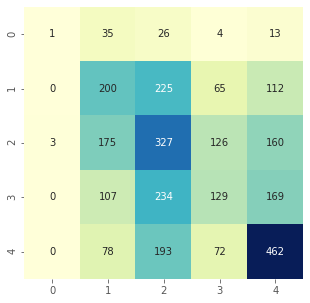

In [195]:
t_start = time.time()
tree_clf = DecisionTreeClassifier(max_depth=8, min_samples_leaf=3, random_state=42) # кол-во разбиений (уровней = глубина + 1)
tree_clf.fit(X_train, y_train)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test, tree_clf.predict(X_test), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test, tree_clf.predict(X_test))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.3350237954505293
Time = 0.14860272407531738 seconds


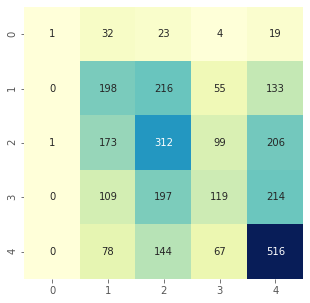

In [196]:
t_start = time.time()
tree_clf = DecisionTreeClassifier(max_depth=8, min_samples_leaf=3, random_state=42)
tree_clf.fit(X_train_ohe, y_train_ohe)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_ohe, tree_clf.predict(X_test_ohe), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_ohe, tree_clf.predict(X_test_ohe))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.3218469396835203
Time = 0.09873580932617188 seconds


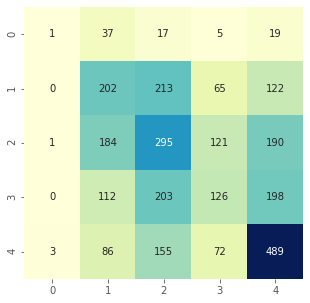

In [197]:
t_start = time.time()
tree_clf = DecisionTreeClassifier(max_depth=8, min_samples_leaf=3, random_state=42)
tree_clf.fit(X_train_tar, y_train_tar)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_tar, tree_clf.predict(X_test_tar), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_tar, tree_clf.predict(X_test_tar))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

In [194]:
import warnings
warnings.filterwarnings("ignore")

## Логистическая регрессия

In [198]:
log_reg = LogisticRegression()

log_reg.fit(X_train, y_train)

print(cohen_kappa_score(y_test, log_reg.predict(X_test), weights='quadratic'))

0.16762819323035805


In [199]:
log_reg = LogisticRegression()

log_reg.fit(X_train_ohe, y_train_ohe)

print(cohen_kappa_score(y_test_ohe, log_reg.predict(X_test_ohe), weights='quadratic'))

0.3127792475934328


In [200]:
log_reg = LogisticRegression()

log_reg.fit(X_train_tar, y_train_tar)

print(cohen_kappa_score(y_test_tar, log_reg.predict(X_test_tar), weights='quadratic'))

0.3183727797097937


In [201]:
param_grid = {
    'C': [0.1, 0.3, 0.5, 1.0],
    'class_weight': [None, 'balanced'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag']
}

log_reg_model = grid_search_cv(LogisticRegression(), param_grid, X_train, y_train)

Fitting 10 folds for each of 32 candidates, totalling 320 fits
[CV 1/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  25.6s
[CV 2/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  26.3s
[CV 3/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  20.3s
[CV 4/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  22.5s
[CV 5/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  23.0s
[CV 6/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  15.6s
[CV 7/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  22.0s
[CV 8/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  19.8s
[CV 9/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=  25.1s
[CV 10/10] END ...C=0.1, class_weight=None, solver=newton-cg; total time=  23.8s
[CV 1/10] END ........C=0.1, class_weight=None, solver=lbfgs; total time=   0.9s
[CV 2/10] END ........C=0.1, class_weight=None

[CV 2/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.7s
[CV 3/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.9s
[CV 4/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.9s
[CV 5/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.9s
[CV 6/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.9s
[CV 7/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.7s
[CV 8/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.5s
[CV 9/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.8s
[CV 10/10] END ...C=0.3, class_weight=None, solver=liblinear; total time=   1.9s
[CV 1/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   1.7s
[CV 2/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   1.7s
[CV 3/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   1.8s
[CV 4/10] END ..........C=0.

[CV 4/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=  18.7s
[CV 5/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=  18.4s
[CV 6/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=  19.6s
[CV 7/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=  21.2s
[CV 8/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=  17.5s
[CV 9/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=  19.2s
[CV 10/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=  19.5s
[CV 1/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.7s
[CV 2/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.7s
[CV 3/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.7s
[CV 4/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.7s
[CV 5/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.7s
[CV 6/10] END ....C=0.5, cl

[CV 6/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   1.7s
[CV 7/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   2.0s
[CV 8/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   2.4s
[CV 9/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   2.0s
[CV 10/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   2.2s
[CV 1/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.7s
[CV 2/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.7s
[CV 3/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.7s
[CV 4/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.7s
[CV 5/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.8s
[CV 6/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.7s
[CV 7/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.7s
[CV 8/10] END ......C=1.0, 

In [202]:
param_grid = {
    'C': [0.1, 0.3, 0.5, 1.0],
    'class_weight': [None, 'balanced'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag']
}

log_reg_model = grid_search_cv(LogisticRegression(), param_grid, X_train_ohe, y_train_ohe)

Fitting 10 folds for each of 32 candidates, totalling 320 fits
[CV 1/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.1s
[CV 2/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.2s
[CV 3/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.2s
[CV 4/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.2s
[CV 5/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.2s
[CV 6/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.1s
[CV 7/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.2s
[CV 8/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.3s
[CV 9/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   1.3s
[CV 10/10] END ...C=0.1, class_weight=None, solver=newton-cg; total time=   1.3s
[CV 1/10] END ........C=0.1, class_weight=None, solver=lbfgs; total time=   0.5s
[CV 2/10] END ........C=0.1, class_weight=None

[CV 2/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.8s
[CV 3/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.7s
[CV 4/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.8s
[CV 5/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.7s
[CV 6/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.7s
[CV 7/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.7s
[CV 8/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.7s
[CV 9/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   1.9s
[CV 10/10] END ...C=0.3, class_weight=None, solver=liblinear; total time=   1.6s
[CV 1/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   3.0s
[CV 2/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   3.0s
[CV 3/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   2.9s
[CV 4/10] END ..........C=0.

[CV 4/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   1.2s
[CV 5/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   1.3s
[CV 6/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   1.3s
[CV 7/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   1.6s
[CV 8/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   1.4s
[CV 9/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   1.4s
[CV 10/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   1.6s
[CV 1/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.8s
[CV 2/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.8s
[CV 3/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.8s
[CV 4/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.7s
[CV 5/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.7s
[CV 6/10] END ....C=0.5, cl

[CV 6/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   1.7s
[CV 7/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   1.8s
[CV 8/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   1.7s
[CV 9/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   2.1s
[CV 10/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   1.9s
[CV 1/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   3.0s
[CV 2/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   3.0s
[CV 3/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   3.0s
[CV 4/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   3.0s
[CV 5/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   3.0s
[CV 6/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   3.0s
[CV 7/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   3.0s
[CV 8/10] END ......C=1.0, 

In [203]:
param_grid = {
    'C': [0.1, 0.3, 0.5, 1.0],
    'class_weight': [None, 'balanced'],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag']
}

log_reg_model = grid_search_cv(LogisticRegression(), param_grid, X_train_tar, y_train_tar)

Fitting 10 folds for each of 32 candidates, totalling 320 fits
[CV 1/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 2/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 3/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 4/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 5/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 6/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 7/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.7s
[CV 8/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 9/10] END ....C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 10/10] END ...C=0.1, class_weight=None, solver=newton-cg; total time=   0.8s
[CV 1/10] END ........C=0.1, class_weight=None, solver=lbfgs; total time=   0.3s
[CV 2/10] END ........C=0.1, class_weight=None

[CV 2/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   0.4s
[CV 3/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   0.4s
[CV 4/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   0.5s
[CV 5/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   0.5s
[CV 6/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   0.5s
[CV 7/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   0.4s
[CV 8/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   0.4s
[CV 9/10] END ....C=0.3, class_weight=None, solver=liblinear; total time=   0.5s
[CV 10/10] END ...C=0.3, class_weight=None, solver=liblinear; total time=   0.4s
[CV 1/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   0.5s
[CV 2/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   0.4s
[CV 3/10] END ..........C=0.3, class_weight=None, solver=sag; total time=   0.5s
[CV 4/10] END ..........C=0.

[CV 4/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   0.6s
[CV 5/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   0.6s
[CV 6/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   0.6s
[CV 7/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   0.6s
[CV 8/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   0.6s
[CV 9/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   0.6s
[CV 10/10] END C=0.5, class_weight=balanced, solver=newton-cg; total time=   0.6s
[CV 1/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.2s
[CV 2/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.2s
[CV 3/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.2s
[CV 4/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.2s
[CV 5/10] END ....C=0.5, class_weight=balanced, solver=lbfgs; total time=   0.2s
[CV 6/10] END ....C=0.5, cl

[CV 6/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   0.4s
[CV 7/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   0.4s
[CV 8/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   0.4s
[CV 9/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   0.4s
[CV 10/10] END C=1.0, class_weight=balanced, solver=liblinear; total time=   0.4s
[CV 1/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.4s
[CV 2/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   0.8s
[CV 3/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   0.8s
[CV 4/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   0.8s
[CV 5/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   0.9s
[CV 6/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   1.1s
[CV 7/10] END ......C=1.0, class_weight=balanced, solver=sag; total time=   0.9s
[CV 8/10] END ......C=1.0, 

 Score = 0.28277812414804937
Time = 2.5267982482910156 seconds


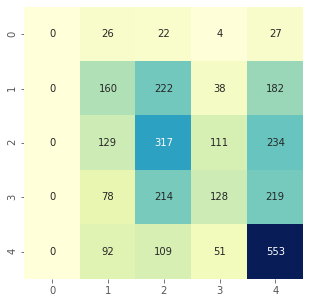

In [204]:
t_start = time.time()
log_reg = LogisticRegression(C=0.3, solver='liblinear')
log_reg.fit(X_train, y_train)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test, log_reg.predict(X_test), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test, log_reg.predict(X_test))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.3121781593532168
Time = 0.978381872177124 seconds


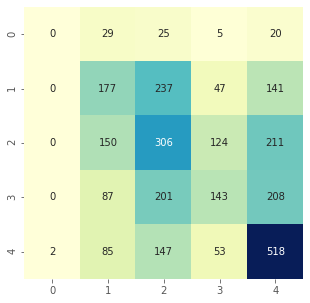

In [205]:
t_start = time.time()
log_reg = LogisticRegression(C=0.3)
log_reg.fit(X_train_ohe, y_train_ohe)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_ohe, log_reg.predict(X_test_ohe), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_ohe, log_reg.predict(X_test_ohe))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.31682352217717025
Time = 0.48667168617248535 seconds


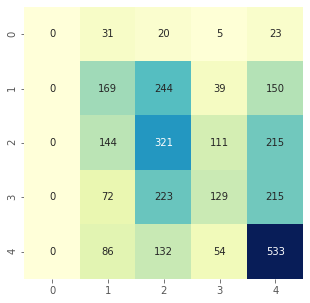

In [206]:
t_start = time.time()
log_reg = LogisticRegression(C=0.1)
log_reg.fit(X_train_tar, y_train_tar)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_tar, log_reg.predict(X_test_tar), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_tar, log_reg.predict(X_test_tar))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

# Ансамбли

## Модель случайного леса

In [176]:
t_start = time.time()
r_forest = RandomForestClassifier()
r_forest.fit(X_train, y_train)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test, r_forest.predict(X_test), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

 Score = 0.42468184626683303
Time = 3.2750773429870605 seconds


In [177]:
t_start = time.time()
r_forest = RandomForestClassifier()
r_forest.fit(X_train_ohe, y_train_ohe)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_ohe, r_forest.predict(X_test_ohe), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

 Score = 0.41310541944009205
Time = 3.155869960784912 seconds


In [178]:
t_start = time.time()
r_forest = RandomForestClassifier()
r_forest.fit(X_train_tar, y_train_tar)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_tar, r_forest.predict(X_test_tar), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

 Score = 0.4196636690065916
Time = 2.7579550743103027 seconds


In [179]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': range(2,20),
    'min_samples_leaf': [3, 5, 7, 9, 11], # минимальное количество наблюдений в листе
    'class_weight': [None, 'balanced'],
    'criterion': ["gini", "entropy"]
}
forest_model = randomized_cv(RandomForestClassifier(random_state=42), param_grid, X_train, y_train, 40)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
[CV 1/10; 1/40] START class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=7, n_estimators=200
[CV 1/10; 1/40] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=7, n_estimators=200; total time=   3.5s
[CV 2/10; 1/40] START class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=7, n_estimators=200
[CV 2/10; 1/40] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=7, n_estimators=200; total time=   3.3s
[CV 3/10; 1/40] START class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=7, n_estimators=200
[CV 3/10; 1/40] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=7, n_estimators=200; total time=   3.3s
[CV 4/10; 1/40] START class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=7, n_estimators=200
[CV 4/10; 1/40] END class_weight=None, criterion=gini, max_depth=17, min_samples_leaf=7, n_estimators=200; total time=   3.3s
[

[CV 5/10; 4/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=11, n_estimators=100; total time=   1.7s
[CV 6/10; 4/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=11, n_estimators=100
[CV 6/10; 4/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=11, n_estimators=100; total time=   1.6s
[CV 7/10; 4/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=11, n_estimators=100
[CV 7/10; 4/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=11, n_estimators=100; total time=   1.6s
[CV 8/10; 4/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=11, n_estimators=100
[CV 8/10; 4/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=11, n_estimators=100; total time=   1.6s
[CV 9/10; 4/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=11, n_estimators=100
[CV 9/10; 4/40] END class_weight=None, c

[CV 10/10; 7/40] END class_weight=balanced, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=200; total time=   4.9s
[CV 1/10; 8/40] START class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=7, n_estimators=100
[CV 1/10; 8/40] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=7, n_estimators=100; total time=   1.6s
[CV 2/10; 8/40] START class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=7, n_estimators=100
[CV 2/10; 8/40] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=7, n_estimators=100; total time=   1.6s
[CV 3/10; 8/40] START class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=7, n_estimators=100
[CV 3/10; 8/40] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=7, n_estimators=100; total time=   1.6s
[CV 4/10; 8/40] START class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=7, n_estimators=100
[CV 4/10; 8/40] END class_weight=None, criterion=gini, m

[CV 5/10; 11/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=5, n_estimators=300; total time=   5.3s
[CV 6/10; 11/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=5, n_estimators=300
[CV 6/10; 11/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=5, n_estimators=300; total time=   5.3s
[CV 7/10; 11/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=5, n_estimators=300
[CV 7/10; 11/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=5, n_estimators=300; total time=   5.3s
[CV 8/10; 11/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=5, n_estimators=300
[CV 8/10; 11/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=5, n_estimators=300; total time=   5.2s
[CV 9/10; 11/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=5, n_estimators=300
[CV 9/10; 11/40] END class_weight=None, 

[CV 10/10; 14/40] END class_weight=None, criterion=entropy, max_depth=3, min_samples_leaf=7, n_estimators=200; total time=   1.4s
[CV 1/10; 15/40] START class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=11, n_estimators=200
[CV 1/10; 15/40] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=11, n_estimators=200; total time=   3.0s
[CV 2/10; 15/40] START class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=11, n_estimators=200
[CV 2/10; 15/40] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=11, n_estimators=200; total time=   3.3s
[CV 3/10; 15/40] START class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=11, n_estimators=200
[CV 3/10; 15/40] END class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=11, n_estimators=200; total time=   2.9s
[CV 4/10; 15/40] START class_weight=None, criterion=gini, max_depth=13, min_samples_leaf=11, n_estimators=200
[CV 4/10; 15/40] END class_weight=None, criter

[CV 5/10; 18/40] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=3, n_estimators=300; total time=   8.5s
[CV 6/10; 18/40] START class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=3, n_estimators=300
[CV 6/10; 18/40] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=3, n_estimators=300; total time=   8.6s
[CV 7/10; 18/40] START class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=3, n_estimators=300
[CV 7/10; 18/40] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=3, n_estimators=300; total time=   8.5s
[CV 8/10; 18/40] START class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=3, n_estimators=300
[CV 8/10; 18/40] END class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=3, n_estimators=300; total time=   8.2s
[CV 9/10; 18/40] START class_weight=None, criterion=entropy, max_depth=16, min_samples_leaf=3, n_estimators=300
[CV 9/10; 18/40] END class_weigh

[CV 10/10; 21/40] END class_weight=None, criterion=gini, max_depth=11, min_samples_leaf=5, n_estimators=100; total time=   1.4s
[CV 1/10; 22/40] START class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100
[CV 1/10; 22/40] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100; total time=   2.2s
[CV 2/10; 22/40] START class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100
[CV 2/10; 22/40] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100; total time=   2.7s
[CV 3/10; 22/40] START class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100
[CV 3/10; 22/40] END class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100; total time=   2.3s
[CV 4/10; 22/40] START class_weight=balanced, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100
[CV 4/

[CV 4/10; 25/40] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3, n_estimators=100; total time=   0.8s
[CV 5/10; 25/40] START class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3, n_estimators=100
[CV 5/10; 25/40] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3, n_estimators=100; total time=   0.8s
[CV 6/10; 25/40] START class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3, n_estimators=100
[CV 6/10; 25/40] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3, n_estimators=100; total time=   0.8s
[CV 7/10; 25/40] START class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3, n_estimators=100
[CV 7/10; 25/40] END class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3, n_estimators=100; total time=   0.9s
[CV 8/10; 25/40] START class_weight=None, criterion=gini, max_depth=5, min_samples_leaf=3, n_estimators=100
[CV 8/10; 25/40] END class_weight=None, criterion=gini, max_dept

[CV 8/10; 28/40] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=7, n_estimators=100; total time=   1.5s
[CV 9/10; 28/40] START class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=7, n_estimators=100
[CV 9/10; 28/40] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=7, n_estimators=100; total time=   1.4s
[CV 10/10; 28/40] START class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=7, n_estimators=100
[CV 10/10; 28/40] END class_weight=None, criterion=gini, max_depth=12, min_samples_leaf=7, n_estimators=100; total time=   1.4s
[CV 1/10; 29/40] START class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=5, n_estimators=100
[CV 1/10; 29/40] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=5, n_estimators=100; total time=   1.7s
[CV 2/10; 29/40] START class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=5, n_estimators=100
[CV 2/10; 29/40] END class_weight=balanced

[CV 2/10; 32/40] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=200; total time=   3.5s
[CV 3/10; 32/40] START class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=200
[CV 3/10; 32/40] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=200; total time=   3.5s
[CV 4/10; 32/40] START class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=200
[CV 4/10; 32/40] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=200; total time=   3.6s
[CV 5/10; 32/40] START class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=200
[CV 5/10; 32/40] END class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=200; total time=   3.5s
[CV 6/10; 32/40] START class_weight=balanced, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimat

[CV 6/10; 35/40] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=9, n_estimators=200; total time=   1.4s
[CV 7/10; 35/40] START class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=9, n_estimators=200
[CV 7/10; 35/40] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=9, n_estimators=200; total time=   1.5s
[CV 8/10; 35/40] START class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=9, n_estimators=200
[CV 8/10; 35/40] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=9, n_estimators=200; total time=   1.4s
[CV 9/10; 35/40] START class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=9, n_estimators=200
[CV 9/10; 35/40] END class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=9, n_estimators=200; total time=   1.4s
[CV 10/10; 35/40] START class_weight=None, criterion=gini, max_depth=4, min_samples_leaf=9, n_estimators=200
[CV 10/10; 35/40] END class_weight=None, criterion=gini, max_de

[CV 1/10; 39/40] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7, n_estimators=200; total time=   4.7s
[CV 2/10; 39/40] START class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7, n_estimators=200
[CV 2/10; 39/40] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7, n_estimators=200; total time=   4.6s
[CV 3/10; 39/40] START class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7, n_estimators=200
[CV 3/10; 39/40] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7, n_estimators=200; total time=   4.6s
[CV 4/10; 39/40] START class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7, n_estimators=200
[CV 4/10; 39/40] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7, n_estimators=200; total time=   4.6s
[CV 5/10; 39/40] START class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=7, n_estimators=200
[CV 5/10; 39/40] END class_weigh

In [180]:
forest_model = randomized_cv(RandomForestClassifier(random_state=42), param_grid, X_train_ohe, y_train_ohe, 40)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
[CV 1/10; 1/40] START class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=5, n_estimators=200
[CV 1/10; 1/40] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=5, n_estimators=200; total time=   2.7s
[CV 2/10; 1/40] START class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=5, n_estimators=200
[CV 2/10; 1/40] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=5, n_estimators=200; total time=   2.6s
[CV 3/10; 1/40] START class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=5, n_estimators=200
[CV 3/10; 1/40] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=5, n_estimators=200; total time=   2.7s
[CV 4/10; 1/40] START class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=5, n_estimators=200
[CV 4/10; 1/40] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=5, n_esti

[CV 4/10; 4/40] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9, n_estimators=200; total time=   3.0s
[CV 5/10; 4/40] START class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9, n_estimators=200
[CV 5/10; 4/40] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9, n_estimators=200; total time=   3.0s
[CV 6/10; 4/40] START class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9, n_estimators=200
[CV 6/10; 4/40] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9, n_estimators=200; total time=   3.2s
[CV 7/10; 4/40] START class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9, n_estimators=200
[CV 7/10; 4/40] END class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9, n_estimators=200; total time=   2.9s
[CV 8/10; 4/40] START class_weight=balanced, criterion=gini, max_depth=17, min_samples_leaf=9, n_estimators=200
[CV 8/10; 4/40] END class_weight

[CV 8/10; 7/40] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=3, n_estimators=300; total time=   7.3s
[CV 9/10; 7/40] START class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=3, n_estimators=300
[CV 9/10; 7/40] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=3, n_estimators=300; total time=   7.9s
[CV 10/10; 7/40] START class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=3, n_estimators=300
[CV 10/10; 7/40] END class_weight=None, criterion=entropy, max_depth=17, min_samples_leaf=3, n_estimators=300; total time=   7.6s
[CV 1/10; 8/40] START class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100
[CV 1/10; 8/40] END class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100; total time=   2.0s
[CV 2/10; 8/40] START class_weight=None, criterion=entropy, max_depth=19, min_samples_leaf=7, n_estimators=100
[CV 2/10; 8/40] END class_weight=None,

[CV 3/10; 11/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7, n_estimators=100; total time=   1.5s
[CV 4/10; 11/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7, n_estimators=100
[CV 4/10; 11/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7, n_estimators=100; total time=   1.6s
[CV 5/10; 11/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7, n_estimators=100
[CV 5/10; 11/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7, n_estimators=100; total time=   1.6s
[CV 6/10; 11/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7, n_estimators=100
[CV 6/10; 11/40] END class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7, n_estimators=100; total time=   1.5s
[CV 7/10; 11/40] START class_weight=None, criterion=entropy, max_depth=9, min_samples_leaf=7, n_estimators=100
[CV 7/10; 11/40] END class_weight=None, 

[CV 7/10; 14/40] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=11, n_estimators=200; total time=   3.7s
[CV 8/10; 14/40] START class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=11, n_estimators=200
[CV 8/10; 14/40] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=11, n_estimators=200; total time=   3.7s
[CV 9/10; 14/40] START class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=11, n_estimators=200
[CV 9/10; 14/40] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=11, n_estimators=200; total time=   3.8s
[CV 10/10; 14/40] START class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=11, n_estimators=200
[CV 10/10; 14/40] END class_weight=balanced, criterion=entropy, max_depth=17, min_samples_leaf=11, n_estimators=200; total time=   4.0s
[CV 1/10; 15/40] START class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=9, n_estimators

[CV 2/10; 18/40] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=3, n_estimators=100; total time=   0.9s
[CV 3/10; 18/40] START class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=3, n_estimators=100
[CV 3/10; 18/40] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=3, n_estimators=100; total time=   0.9s
[CV 4/10; 18/40] START class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=3, n_estimators=100
[CV 4/10; 18/40] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=3, n_estimators=100; total time=   0.8s
[CV 5/10; 18/40] START class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=3, n_estimators=100
[CV 5/10; 18/40] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=3, n_estimators=100; total time=   0.9s
[CV 6/10; 18/40] START class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=3, n_estimators=100
[CV 6/10; 18/40] END class_weight=None, 

[CV 6/10; 21/40] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7, n_estimators=200; total time=   1.8s
[CV 7/10; 21/40] START class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7, n_estimators=200
[CV 7/10; 21/40] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7, n_estimators=200; total time=   1.7s
[CV 8/10; 21/40] START class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7, n_estimators=200
[CV 8/10; 21/40] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7, n_estimators=200; total time=   1.8s
[CV 9/10; 21/40] START class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7, n_estimators=200
[CV 9/10; 21/40] END class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7, n_estimators=200; total time=   1.7s
[CV 10/10; 21/40] START class_weight=None, criterion=entropy, max_depth=4, min_samples_leaf=7, n_estimators=200
[CV 10/10; 21/40] END class_weight=None

[CV 10/10; 24/40] END class_weight=balanced, criterion=gini, max_depth=10, min_samples_leaf=11, n_estimators=200; total time=   2.5s
[CV 1/10; 25/40] START class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=9, n_estimators=300
[CV 1/10; 25/40] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=9, n_estimators=300; total time=   4.4s
[CV 2/10; 25/40] START class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=9, n_estimators=300
[CV 2/10; 25/40] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=9, n_estimators=300; total time=   4.5s
[CV 3/10; 25/40] START class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=9, n_estimators=300
[CV 3/10; 25/40] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=9, n_estimators=300; total time=   4.5s
[CV 4/10; 25/40] START class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=9, n_estimators=300
[CV 4/10; 25/40] END class_weight=None, criterion=

[CV 4/10; 28/40] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=3, n_estimators=300; total time=   5.4s
[CV 5/10; 28/40] START class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=3, n_estimators=300
[CV 5/10; 28/40] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=3, n_estimators=300; total time=   5.2s
[CV 6/10; 28/40] START class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=3, n_estimators=300
[CV 6/10; 28/40] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=3, n_estimators=300; total time=   5.2s
[CV 7/10; 28/40] START class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=3, n_estimators=300
[CV 7/10; 28/40] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=3, n_estimators=300; total time=   5.2s
[CV 8/10; 28/40] START class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=3, n_estimators=300
[CV 8/10; 28/40] END class_weigh

[CV 8/10; 31/40] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=7, n_estimators=200; total time=   2.1s
[CV 9/10; 31/40] START class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=7, n_estimators=200
[CV 9/10; 31/40] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=7, n_estimators=200; total time=   2.0s
[CV 10/10; 31/40] START class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=7, n_estimators=200
[CV 10/10; 31/40] END class_weight=balanced, criterion=gini, max_depth=7, min_samples_leaf=7, n_estimators=200; total time=   2.0s
[CV 1/10; 32/40] START class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=11, n_estimators=100
[CV 1/10; 32/40] END class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=11, n_estimators=100; total time=   1.7s
[CV 2/10; 32/40] START class_weight=None, criterion=entropy, max_depth=13, min_samples_leaf=11, n_estimators=100
[CV 2/10; 32/40] END class_

[CV 2/10; 35/40] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=3, n_estimators=300; total time=   5.9s
[CV 3/10; 35/40] START class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=3, n_estimators=300
[CV 3/10; 35/40] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=3, n_estimators=300; total time=   5.8s
[CV 4/10; 35/40] START class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=3, n_estimators=300
[CV 4/10; 35/40] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=3, n_estimators=300; total time=   5.7s
[CV 5/10; 35/40] START class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=3, n_estimators=300
[CV 5/10; 35/40] END class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=3, n_estimators=300; total time=   5.6s
[CV 6/10; 35/40] START class_weight=balanced, criterion=gini, max_depth=19, min_samples_leaf=3, n_estimators=300
[CV 6/10; 35/40] END cla

[CV 6/10; 38/40] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5, n_estimators=200; total time=   2.5s
[CV 7/10; 38/40] START class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5, n_estimators=200
[CV 7/10; 38/40] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5, n_estimators=200; total time=   2.6s
[CV 8/10; 38/40] START class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5, n_estimators=200
[CV 8/10; 38/40] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5, n_estimators=200; total time=   2.5s
[CV 9/10; 38/40] START class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5, n_estimators=200
[CV 9/10; 38/40] END class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5, n_estimators=200; total time=   2.5s
[CV 10/10; 38/40] START class_weight=balanced, criterion=entropy, max_depth=7, min_samples_leaf=5, n_estimators=200
[CV 10/

In [181]:
forest_model = randomized_cv(RandomForestClassifier(random_state=42), param_grid, X_train_tar, y_train_tar, 40)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
[CV 1/10; 1/40] START class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=7, n_estimators=300
[CV 1/10; 1/40] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=7, n_estimators=300; total time=   4.8s
[CV 2/10; 1/40] START class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=7, n_estimators=300
[CV 2/10; 1/40] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=7, n_estimators=300; total time=   4.8s
[CV 3/10; 1/40] START class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=7, n_estimators=300
[CV 3/10; 1/40] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=7, n_estimators=300; total time=   4.7s
[CV 4/10; 1/40] START class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=7, n_estimators=300
[CV 4/10; 1/40] END class_weight=balanced, criterion=entropy, max_depth=8, min_sample

[CV 4/10; 4/40] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=300; total time=   7.5s
[CV 5/10; 4/40] START class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=300
[CV 5/10; 4/40] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=300; total time=   7.4s
[CV 6/10; 4/40] START class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=300
[CV 6/10; 4/40] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=300; total time=   7.3s
[CV 7/10; 4/40] START class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=300
[CV 7/10; 4/40] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=300; total time=   7.6s
[CV 8/10; 4/40] START class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=5, n_estimators=300
[CV 8/10; 4/40] END class_weight=None, c

[CV 8/10; 7/40] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=100; total time=   1.8s
[CV 9/10; 7/40] START class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=100
[CV 9/10; 7/40] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=100; total time=   1.8s
[CV 10/10; 7/40] START class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=100
[CV 10/10; 7/40] END class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=11, n_estimators=100; total time=   1.7s
[CV 1/10; 8/40] START class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=11, n_estimators=200
[CV 1/10; 8/40] END class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=11, n_estimators=200; total time=   2.4s
[CV 2/10; 8/40] START class_weight=None, criterion=gini, max_depth=9, min_samples_leaf=11, n_estimators=200
[CV 2/10; 8/40] END class_weight=None, cri

[CV 3/10; 11/40] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5, n_estimators=300; total time=   4.8s
[CV 4/10; 11/40] START class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5, n_estimators=300
[CV 4/10; 11/40] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5, n_estimators=300; total time=   4.7s
[CV 5/10; 11/40] START class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5, n_estimators=300
[CV 5/10; 11/40] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5, n_estimators=300; total time=   5.1s
[CV 6/10; 11/40] START class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5, n_estimators=300
[CV 6/10; 11/40] END class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5, n_estimators=300; total time=   4.8s
[CV 7/10; 11/40] START class_weight=balanced, criterion=entropy, max_depth=8, min_samples_leaf=5, n_estimators=300
[CV 7/10

[CV 7/10; 14/40] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3, n_estimators=100; total time=   1.4s
[CV 8/10; 14/40] START class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3, n_estimators=100
[CV 8/10; 14/40] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3, n_estimators=100; total time=   1.4s
[CV 9/10; 14/40] START class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3, n_estimators=100
[CV 9/10; 14/40] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3, n_estimators=100; total time=   1.5s
[CV 10/10; 14/40] START class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3, n_estimators=100
[CV 10/10; 14/40] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=3, n_estimators=100; total time=   1.4s
[CV 1/10; 15/40] START class_weight=None, criterion=entropy, max_depth=10, min_samples_leaf=5, n_estimators=200
[CV 1/10; 15/40] END cl

[CV 1/10; 18/40] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=5, n_estimators=200; total time=   1.9s
[CV 2/10; 18/40] START class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=5, n_estimators=200
[CV 2/10; 18/40] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=5, n_estimators=200; total time=   1.9s
[CV 3/10; 18/40] START class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=5, n_estimators=200
[CV 3/10; 18/40] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=5, n_estimators=200; total time=   1.9s
[CV 4/10; 18/40] START class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=5, n_estimators=200
[CV 4/10; 18/40] END class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=5, n_estimators=200; total time=   1.9s
[CV 5/10; 18/40] START class_weight=balanced, criterion=gini, max_depth=6, min_samples_leaf=5, n_estimators=200
[CV 5/10; 18/40] END class_weigh

[CV 6/10; 21/40] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=11, n_estimators=200; total time=   3.1s
[CV 7/10; 21/40] START class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=11, n_estimators=200
[CV 7/10; 21/40] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=11, n_estimators=200; total time=   3.5s
[CV 8/10; 21/40] START class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=11, n_estimators=200
[CV 8/10; 21/40] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=11, n_estimators=200; total time=   3.0s
[CV 9/10; 21/40] START class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=11, n_estimators=200
[CV 9/10; 21/40] END class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=11, n_estimators=200; total time=   2.9s
[CV 10/10; 21/40] START class_weight=None, criterion=gini, max_depth=16, min_samples_leaf=11, n_estimators=200
[CV 10/10; 21/40] END class_weight=None, criter

[CV 1/10; 25/40] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=11, n_estimators=100; total time=   1.3s
[CV 2/10; 25/40] START class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=11, n_estimators=100
[CV 2/10; 25/40] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=11, n_estimators=100; total time=   1.3s
[CV 3/10; 25/40] START class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=11, n_estimators=100
[CV 3/10; 25/40] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=11, n_estimators=100; total time=   1.4s
[CV 4/10; 25/40] START class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=11, n_estimators=100
[CV 4/10; 25/40] END class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=11, n_estimators=100; total time=   1.3s
[CV 5/10; 25/40] START class_weight=balanced, criterion=gini, max_depth=11, min_samples_leaf=11, n_estimators=100
[CV 5/10; 25/40]

[CV 5/10; 28/40] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=9, n_estimators=200; total time=   4.3s
[CV 6/10; 28/40] START class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=9, n_estimators=200
[CV 6/10; 28/40] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=9, n_estimators=200; total time=   4.4s
[CV 7/10; 28/40] START class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=9, n_estimators=200
[CV 7/10; 28/40] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=9, n_estimators=200; total time=   4.3s
[CV 8/10; 28/40] START class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=9, n_estimators=200
[CV 8/10; 28/40] END class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=9, n_estimators=200; total time=   4.4s
[CV 9/10; 28/40] START class_weight=None, criterion=entropy, max_depth=18, min_samples_leaf=9, n_estimators=200
[CV 9/10; 28/40] END class_weigh

[CV 10/10; 31/40] END class_weight=None, criterion=gini, max_depth=15, min_samples_leaf=9, n_estimators=200; total time=   3.3s
[CV 1/10; 32/40] START class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=5, n_estimators=100
[CV 1/10; 32/40] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=5, n_estimators=100; total time=   1.8s
[CV 2/10; 32/40] START class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=5, n_estimators=100
[CV 2/10; 32/40] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=5, n_estimators=100; total time=   1.8s
[CV 3/10; 32/40] START class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=5, n_estimators=100
[CV 3/10; 32/40] END class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=5, n_estimators=100; total time=   1.7s
[CV 4/10; 32/40] START class_weight=balanced, criterion=gini, max_depth=18, min_samples_leaf=5, n_estimators=100
[CV 4/10; 32/40] END class_

[CV 4/10; 35/40] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=5, n_estimators=300; total time=   1.9s
[CV 5/10; 35/40] START class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=5, n_estimators=300
[CV 5/10; 35/40] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=5, n_estimators=300; total time=   2.0s
[CV 6/10; 35/40] START class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=5, n_estimators=300
[CV 6/10; 35/40] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=5, n_estimators=300; total time=   2.0s
[CV 7/10; 35/40] START class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=5, n_estimators=300
[CV 7/10; 35/40] END class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=5, n_estimators=300; total time=   2.0s
[CV 8/10; 35/40] START class_weight=None, criterion=gini, max_depth=3, min_samples_leaf=5, n_estimators=300
[CV 8/10; 35/40] END class_weight=None, criterion=gini, max_dept

[CV 9/10; 38/40] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=5, n_estimators=200; total time=   3.4s
[CV 10/10; 38/40] START class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=5, n_estimators=200
[CV 10/10; 38/40] END class_weight=balanced, criterion=gini, max_depth=15, min_samples_leaf=5, n_estimators=200; total time=   3.4s
[CV 1/10; 39/40] START class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=9, n_estimators=200
[CV 1/10; 39/40] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=9, n_estimators=200; total time=   1.2s
[CV 2/10; 39/40] START class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=9, n_estimators=200
[CV 2/10; 39/40] END class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=9, n_estimators=200; total time=   1.2s
[CV 3/10; 39/40] START class_weight=None, criterion=entropy, max_depth=2, min_samples_leaf=9, n_estimators=200
[CV 3/10; 39/40] END class_weigh

 Score = 0.4098590420354743
Time = 13.883994102478027 seconds


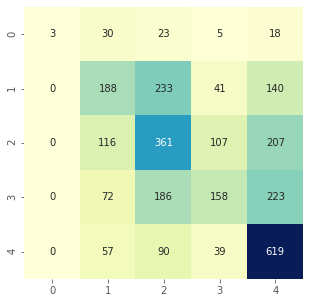

In [207]:
t_start = time.time()
r_forest = RandomForestClassifier(criterion='entropy', max_depth=16, min_samples_leaf=3,
                       n_estimators=300, random_state=42)
r_forest.fit(X_train, y_train)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test, r_forest.predict(X_test), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test, r_forest.predict(X_test))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.4168135477070587
Time = 10.02495813369751 seconds


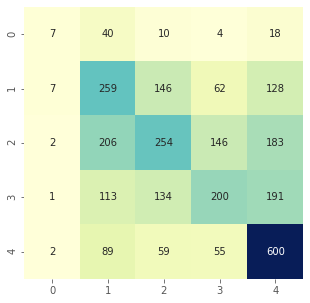

In [208]:
t_start = time.time()
r_forest = RandomForestClassifier(class_weight='balanced', max_depth=19,
                       min_samples_leaf=3, n_estimators=300, random_state=42)
r_forest.fit(X_train_ohe, y_train_ohe)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_ohe, r_forest.predict(X_test_ohe), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_ohe, r_forest.predict(X_test_ohe))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.4166656016064654
Time = 8.586639642715454 seconds


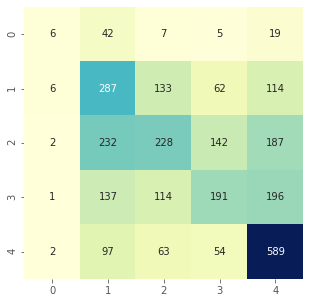

In [209]:
t_start = time.time()
r_forest = RandomForestClassifier(class_weight='balanced', max_depth=14,
                       min_samples_leaf=3, n_estimators=300, random_state=42)
r_forest.fit(X_train_tar, y_train_tar)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_tar, r_forest.predict(X_test_tar), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_tar, r_forest.predict(X_test_tar))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

<AxesSubplot:xlabel='feature'>

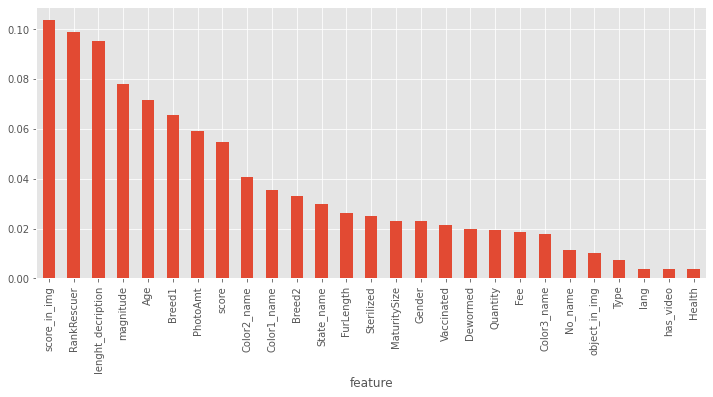

In [210]:
featureImportance = pd.DataFrame({"feature": X_train.columns, 
                                  "importance": r_forest.feature_importances_})

# смотрим, какие признаки влияют на то, что модель предскажет 0 класс

featureImportance.set_index('feature', inplace=True)
featureImportance.sort_values(["importance"], ascending=False, inplace=True)
featureImportance["importance"].head(30).plot(kind='bar', figsize=(12,5))
featureImportance["importance"].tail(30).plot(kind='bar', figsize=(12,5))

## Бустинг

### Адаптивный бустинг

In [182]:
ada_clf = AdaBoostClassifier()
ada_clf.fit(X_train, y_train)

print(cohen_kappa_score(y_test, ada_clf.predict(X_test), weights='quadratic'))

0.34706331658842127


In [183]:
ada_clf = AdaBoostClassifier()
ada_clf.fit(X_train_ohe, y_train_ohe)

print(cohen_kappa_score(y_test_ohe, ada_clf.predict(X_test_ohe), weights='quadratic'))

0.3589410274110435


In [184]:
ada_clf = AdaBoostClassifier()
ada_clf.fit(X_train_tar, y_train_tar)

print(cohen_kappa_score(y_test_tar, ada_clf.predict(X_test_tar), weights='quadratic'))

0.3403528515979196


In [185]:
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [1.0, 0.5, 0.25, 0.1],
    'algorithm': ['SAMME', 'SAMME.R']
}
ada_model = randomized_cv(AdaBoostClassifier(DecisionTreeClassifier(max_depth=7)), param_grid, X_train, y_train, 40)

Fitting 10 folds for each of 32 candidates, totalling 320 fits
[CV 1/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......


C:\Users\Irina\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:289: UserWarning: The total space of parameters 32 is smaller than n_iter=40. Running 32 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


[CV 1/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.0s
[CV 2/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 2/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.0s
[CV 3/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 3/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   2.9s
[CV 4/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 4/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.0s
[CV 5/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 5/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.1s
[CV 6/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 6/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.0s
[CV 7/10; 1/32] START algorithm=SAMME, lear

[CV 9/10; 5/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=50; total time=   2.9s
[CV 10/10; 5/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=50......
[CV 10/10; 5/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=50; total time=   3.0s
[CV 1/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 1/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   6.1s
[CV 2/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 2/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   6.1s
[CV 3/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 3/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   6.1s
[CV 4/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 4/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   6.1s
[CV 5/10; 6/32] START algorithm=SAMME,

[CV 7/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   6.0s
[CV 8/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100....
[CV 8/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   6.1s
[CV 9/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100....
[CV 9/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   6.1s
[CV 10/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100...
[CV 10/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   6.0s
[CV 1/10; 11/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=200....
[CV 1/10; 11/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=200; total time=  12.6s
[CV 2/10; 11/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=200....
[CV 2/10; 11/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=200; total time=  12.0s
[CV 3/10; 11/32] START a

[CV 4/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  12.2s
[CV 5/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 5/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  12.2s
[CV 6/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 6/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  12.1s
[CV 7/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 7/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  12.3s
[CV 8/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 8/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  12.2s
[CV 9/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 9/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  12.5s
[CV 10/10; 15/32] START algorit

[CV 1/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  19.1s
[CV 2/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 2/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  19.2s
[CV 3/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 3/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  19.5s
[CV 4/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 4/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  19.4s
[CV 5/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 5/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  19.6s
[CV 6/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 6/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  19.2s
[CV 7/10; 20/32] ST

[CV 8/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  19.7s
[CV 9/10; 24/32] START algorithm=SAMME.R, learning_rate=0.5, n_estimators=300...
[CV 9/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  19.4s
[CV 10/10; 24/32] START algorithm=SAMME.R, learning_rate=0.5, n_estimators=300..
[CV 10/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  19.1s
[CV 1/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 1/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   3.1s
[CV 2/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 2/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   3.1s
[CV 3/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 3/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   3.1s
[CV 4/10; 25/32] S

[CV 5/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.1s
[CV 6/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 6/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.1s
[CV 7/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 7/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.5s
[CV 8/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 8/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.3s
[CV 9/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 9/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.2s
[CV 10/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50...
[CV 10/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.2s
[CV 1/10; 30/32] START a

In [186]:
ada_model = randomized_cv(AdaBoostClassifier(DecisionTreeClassifier(max_depth=7)), param_grid, X_train_ohe, y_train_ohe, 40)

Fitting 10 folds for each of 32 candidates, totalling 320 fits
[CV 1/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......


C:\Users\Irina\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:289: UserWarning: The total space of parameters 32 is smaller than n_iter=40. Running 32 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


[CV 1/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   4.6s
[CV 2/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 2/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   4.5s
[CV 3/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 3/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   4.2s
[CV 4/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 4/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   4.2s
[CV 5/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 5/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   4.2s
[CV 6/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 6/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   4.2s
[CV 7/10; 1/32] START algorithm=SAMME, lear

[CV 9/10; 5/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=50; total time=   4.3s
[CV 10/10; 5/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=50......
[CV 10/10; 5/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=50; total time=   4.2s
[CV 1/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 1/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   8.8s
[CV 2/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 2/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   8.9s
[CV 3/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 3/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   8.7s
[CV 4/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 4/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   8.6s
[CV 5/10; 6/32] START algorithm=SAMME,

[CV 7/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   9.0s
[CV 8/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100....
[CV 8/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   9.2s
[CV 9/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100....
[CV 9/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   9.7s
[CV 10/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100...
[CV 10/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   9.2s
[CV 1/10; 11/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=200....
[CV 1/10; 11/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=200; total time=  18.6s
[CV 2/10; 11/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=200....
[CV 2/10; 11/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=200; total time=  18.2s
[CV 3/10; 11/32] START a

[CV 4/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  20.0s
[CV 5/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 5/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  18.9s
[CV 6/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 6/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  20.2s
[CV 7/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 7/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  19.0s
[CV 8/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 8/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  18.7s
[CV 9/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 9/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  18.4s
[CV 10/10; 15/32] START algorit

[CV 1/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  29.9s
[CV 2/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 2/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  29.7s
[CV 3/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 3/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  29.7s
[CV 4/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 4/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  30.0s
[CV 5/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 5/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  29.6s
[CV 6/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 6/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  29.5s
[CV 7/10; 20/32] ST

[CV 8/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  29.6s
[CV 9/10; 24/32] START algorithm=SAMME.R, learning_rate=0.5, n_estimators=300...
[CV 9/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  30.3s
[CV 10/10; 24/32] START algorithm=SAMME.R, learning_rate=0.5, n_estimators=300..
[CV 10/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  30.2s
[CV 1/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 1/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   4.8s
[CV 2/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 2/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   5.0s
[CV 3/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 3/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   4.9s
[CV 4/10; 25/32] S

[CV 5/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   4.7s
[CV 6/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 6/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   4.9s
[CV 7/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 7/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   4.7s
[CV 8/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 8/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   4.7s
[CV 9/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 9/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   4.7s
[CV 10/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50...
[CV 10/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   4.6s
[CV 1/10; 30/32] START a

In [187]:
ada_model = randomized_cv(AdaBoostClassifier(DecisionTreeClassifier(max_depth=7)), param_grid, X_train_tar, y_train_tar, 40)

Fitting 10 folds for each of 32 candidates, totalling 320 fits
[CV 1/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......


C:\Users\Irina\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:289: UserWarning: The total space of parameters 32 is smaller than n_iter=40. Running 32 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)


[CV 1/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.3s
[CV 2/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 2/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.7s
[CV 3/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 3/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.3s
[CV 4/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 4/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.4s
[CV 5/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 5/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.1s
[CV 6/10; 1/32] START algorithm=SAMME, learning_rate=1.0, n_estimators=50.......
[CV 6/10; 1/32] END algorithm=SAMME, learning_rate=1.0, n_estimators=50; total time=   3.2s
[CV 7/10; 1/32] START algorithm=SAMME, lear

[CV 9/10; 5/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=50; total time=   3.1s
[CV 10/10; 5/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=50......
[CV 10/10; 5/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=50; total time=   3.3s
[CV 1/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 1/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   6.3s
[CV 2/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 2/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   6.4s
[CV 3/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 3/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   7.0s
[CV 4/10; 6/32] START algorithm=SAMME, learning_rate=0.5, n_estimators=100......
[CV 4/10; 6/32] END algorithm=SAMME, learning_rate=0.5, n_estimators=100; total time=   6.6s
[CV 5/10; 6/32] START algorithm=SAMME,

[CV 7/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   6.4s
[CV 8/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100....
[CV 8/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   6.4s
[CV 9/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100....
[CV 9/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   6.5s
[CV 10/10; 10/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=100...
[CV 10/10; 10/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=100; total time=   7.0s
[CV 1/10; 11/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=200....
[CV 1/10; 11/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=200; total time=  13.3s
[CV 2/10; 11/32] START algorithm=SAMME, learning_rate=0.25, n_estimators=200....
[CV 2/10; 11/32] END algorithm=SAMME, learning_rate=0.25, n_estimators=200; total time=  13.0s
[CV 3/10; 11/32] START a

[CV 4/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  13.2s
[CV 5/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 5/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  13.1s
[CV 6/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 6/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  13.1s
[CV 7/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 7/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  13.5s
[CV 8/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 8/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  13.4s
[CV 9/10; 15/32] START algorithm=SAMME, learning_rate=0.1, n_estimators=200.....
[CV 9/10; 15/32] END algorithm=SAMME, learning_rate=0.1, n_estimators=200; total time=  13.8s
[CV 10/10; 15/32] START algorit

[CV 1/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  21.6s
[CV 2/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 2/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  21.2s
[CV 3/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 3/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  21.7s
[CV 4/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 4/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  21.3s
[CV 5/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 5/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  21.4s
[CV 6/10; 20/32] START algorithm=SAMME.R, learning_rate=1.0, n_estimators=300...
[CV 6/10; 20/32] END algorithm=SAMME.R, learning_rate=1.0, n_estimators=300; total time=  21.5s
[CV 7/10; 20/32] ST

[CV 8/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  20.7s
[CV 9/10; 24/32] START algorithm=SAMME.R, learning_rate=0.5, n_estimators=300...
[CV 9/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  21.6s
[CV 10/10; 24/32] START algorithm=SAMME.R, learning_rate=0.5, n_estimators=300..
[CV 10/10; 24/32] END algorithm=SAMME.R, learning_rate=0.5, n_estimators=300; total time=  21.0s
[CV 1/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 1/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   3.4s
[CV 2/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 2/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   3.3s
[CV 3/10; 25/32] START algorithm=SAMME.R, learning_rate=0.25, n_estimators=50...
[CV 3/10; 25/32] END algorithm=SAMME.R, learning_rate=0.25, n_estimators=50; total time=   3.4s
[CV 4/10; 25/32] S

[CV 5/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.3s
[CV 6/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 6/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.4s
[CV 7/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 7/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.2s
[CV 8/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 8/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.4s
[CV 9/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50....
[CV 9/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.4s
[CV 10/10; 29/32] START algorithm=SAMME.R, learning_rate=0.1, n_estimators=50...
[CV 10/10; 29/32] END algorithm=SAMME.R, learning_rate=0.1, n_estimators=50; total time=   3.4s
[CV 1/10; 30/32] START a

 Score = 0.39884805613239827
Time = 10.266168117523193 seconds


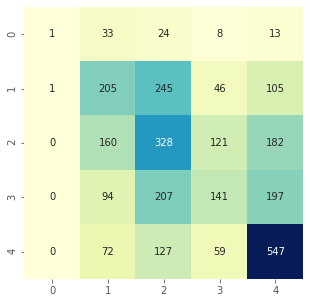

In [211]:
t_start = time.time()
ada = AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=DecisionTreeClassifier(max_depth=7),
                   learning_rate=0.1, n_estimators=100)
ada.fit(X_train, y_train)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test, ada.predict(X_test), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test, ada.predict(X_test))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.40414212117212533
Time = 13.761859893798828 seconds


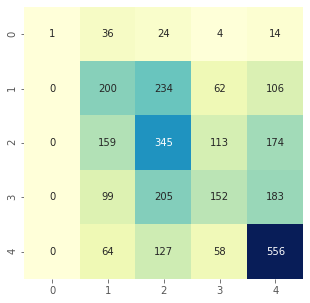

In [212]:
t_start = time.time()
ada = AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=DecisionTreeClassifier(max_depth=7),
                   learning_rate=0.1, n_estimators=100)
ada.fit(X_train_ohe, y_train_ohe)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_ohe, ada.predict(X_test_ohe), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_ohe, ada.predict(X_test_ohe))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.4006763933568349
Time = 30.173818826675415 seconds


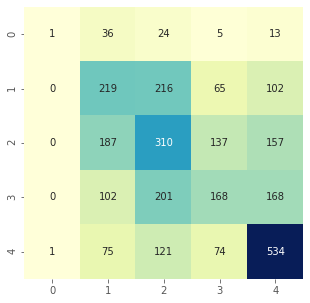

In [213]:
t_start = time.time()
ada = AdaBoostClassifier(algorithm='SAMME',
                   base_estimator=DecisionTreeClassifier(max_depth=7),
                   learning_rate=0.1, n_estimators=300)
ada.fit(X_train_tar, y_train_tar)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_tar, ada.predict(X_test_tar), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_tar, ada.predict(X_test_tar))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

### Градиентный бустинг

In [188]:
est = GradientBoostingClassifier()
est.fit(X_train, y_train)

print(cohen_kappa_score(y_test, est.predict(X_test), weights='quadratic'))

0.3834166296276056


In [189]:
est = GradientBoostingClassifier()
est.fit(X_train_ohe, y_train_ohe)

print(cohen_kappa_score(y_test_ohe, est.predict(X_test_ohe), weights='quadratic'))

0.3932465272677671


In [190]:
est = GradientBoostingClassifier()
est.fit(X_train_tar, y_train_tar)

print(cohen_kappa_score(y_test_tar, est.predict(X_test_tar), weights='quadratic'))

0.39724209611651895


In [191]:
param_grid = {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [1.0, 0.5, 0.25, 0.1],
    'criterion': ['friedman_mse', 'mse'],
    'max_depth': [1, 3, 5, 7]
}
gbc_model = randomized_cv(GradientBoostingClassifier(), param_grid, X_train, y_train, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200
[CV 1/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200; total time=  42.9s
[CV 2/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200
[CV 2/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200; total time=  43.1s
[CV 3/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200
[CV 3/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200; total time=  43.8s
[CV 4/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200
[CV 4/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200; total time=  43.8s
[CV 5/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200
[CV 5/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=200; total 

[CV 3/10; 5/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  26.7s
[CV 4/10; 5/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 4/10; 5/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  27.0s
[CV 5/10; 5/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 5/10; 5/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  27.0s
[CV 6/10; 5/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 6/10; 5/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  27.0s
[CV 7/10; 5/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 7/10; 5/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  26.9s
[CV 8/10; 5/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 8/10; 5/30] END criterion=mse, learn

[CV 3/10; 9/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300; total time= 1.1min
[CV 4/10; 9/30] START criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300
[CV 4/10; 9/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300; total time= 1.1min
[CV 5/10; 9/30] START criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300
[CV 5/10; 9/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300; total time= 1.1min
[CV 6/10; 9/30] START criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300
[CV 6/10; 9/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300; total time= 1.1min
[CV 7/10; 9/30] START criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300
[CV 7/10; 9/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=5, n_estimators=300; total time= 1.1min
[CV 8/10; 9/30] START criterion=friedman_mse, learning_

[CV 3/10; 13/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200; total time=  26.4s
[CV 4/10; 13/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200
[CV 4/10; 13/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200; total time=  26.7s
[CV 5/10; 13/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200
[CV 5/10; 13/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200; total time=  26.1s
[CV 6/10; 13/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200
[CV 6/10; 13/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200; total time=  26.5s
[CV 7/10; 13/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200
[CV 7/10; 13/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=3, n_estimators=200; total time=  26.6s
[CV 8/10; 13/30] START criterion=friedman_mse,

[CV 4/10; 17/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50; total time=  10.6s
[CV 5/10; 17/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50
[CV 5/10; 17/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50; total time=  10.7s
[CV 6/10; 17/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50
[CV 6/10; 17/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50; total time=  11.0s
[CV 7/10; 17/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50
[CV 7/10; 17/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50; total time=  10.7s
[CV 8/10; 17/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50
[CV 8/10; 17/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=50; total time=  10.6s
[CV 9/10; 17/30] START criterion=friedman_mse, learning

[CV 5/10; 21/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100; total time=  21.8s
[CV 6/10; 21/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100
[CV 6/10; 21/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100; total time=  21.2s
[CV 7/10; 21/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100
[CV 7/10; 21/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100; total time=  21.1s
[CV 8/10; 21/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100
[CV 8/10; 21/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100; total time=  20.8s
[CV 9/10; 21/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100
[CV 9/10; 21/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100; total time=  21.4s
[CV 10/10; 21/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=100
[CV 10/10; 21/30] END criterion=mse, le

[CV 7/10; 25/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=100; total time=  21.1s
[CV 8/10; 25/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=100
[CV 8/10; 25/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=100; total time=  21.4s
[CV 9/10; 25/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=100
[CV 9/10; 25/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=100; total time=  21.7s
[CV 10/10; 25/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=100
[CV 10/10; 25/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=5, n_estimators=100; total time=  21.8s
[CV 1/10; 26/30] START criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=100
[CV 1/10; 26/30] END criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=100; total time=  30.4s
[CV 2/10; 26/30] START criterion=mse, learning_rate=1.0, max_d

[CV 9/10; 29/30] END criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=300; total time=  39.5s
[CV 10/10; 29/30] START criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=300
[CV 10/10; 29/30] END criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=300; total time=  39.7s
[CV 1/10; 30/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 1/10; 30/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  27.4s
[CV 2/10; 30/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 2/10; 30/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  26.0s
[CV 3/10; 30/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 3/10; 30/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  26.3s
[CV 4/10; 30/30] START criterion=friedman_mse, learning_rate=0.25

In [192]:
gbc_model = randomized_cv(GradientBoostingClassifier(), param_grid, X_train_ohe, y_train_ohe, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300
[CV 1/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300; total time= 2.3min
[CV 2/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300
[CV 2/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300; total time= 2.4min
[CV 3/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300
[CV 3/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300; total time= 2.4min
[CV 4/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300
[CV 4/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300; total time= 2.5min
[CV 5/10; 1/30] START criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300
[CV 5/10; 1/30] END criterion=mse, learning_rate=1.0, max_depth=7, n_estimators=300; total 

[CV 2/10; 5/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100; total time=  48.5s
[CV 3/10; 5/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100
[CV 3/10; 5/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100; total time=  48.1s
[CV 4/10; 5/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100
[CV 4/10; 5/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100; total time=  47.1s
[CV 5/10; 5/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100
[CV 5/10; 5/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100; total time=  47.8s
[CV 6/10; 5/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100
[CV 6/10; 5/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100; total time=  46.7s
[CV 7/10; 5/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=100
[CV 7/10; 5/30] END criterion=mse, learning_rate=0

[CV 6/10; 9/30] END criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   9.2s
[CV 7/10; 9/30] START criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100
[CV 7/10; 9/30] END criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   9.7s
[CV 8/10; 9/30] START criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100
[CV 8/10; 9/30] END criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   9.2s
[CV 9/10; 9/30] START criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100
[CV 9/10; 9/30] END criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   9.2s
[CV 10/10; 9/30] START criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100
[CV 10/10; 9/30] END criterion=mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   9.2s
[CV 1/10; 10/30] START criterion=mse, learning_rate=0.25, max_depth=5, n_estimators=300
[CV 1/10; 10/30] END criterion=mse, learning_r

[CV 8/10; 13/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=7, n_estimators=300; total time= 1.9min
[CV 9/10; 13/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=7, n_estimators=300
[CV 9/10; 13/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=7, n_estimators=300; total time= 1.9min
[CV 10/10; 13/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=7, n_estimators=300
[CV 10/10; 13/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=7, n_estimators=300; total time= 1.8min
[CV 1/10; 14/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=50
[CV 1/10; 14/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=50; total time=  19.6s
[CV 2/10; 14/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=50
[CV 2/10; 14/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=50; total time=  18.9s
[CV 3/10; 14/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=5

[CV 1/10; 18/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  33.4s
[CV 2/10; 18/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 2/10; 18/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  35.4s
[CV 3/10; 18/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 3/10; 18/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  33.7s
[CV 4/10; 18/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 4/10; 18/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  33.7s
[CV 5/10; 18/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 5/10; 18/30] END criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200; total time=  34.1s
[CV 6/10; 18/30] START criterion=mse, learning_rate=0.25, max_depth=3, n_estimators=200
[CV 6/10; 18/30] END criterion

[CV 3/10; 22/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50; total time=  13.0s
[CV 4/10; 22/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50
[CV 4/10; 22/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50; total time=  13.4s
[CV 5/10; 22/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50
[CV 5/10; 22/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50; total time=  13.8s
[CV 6/10; 22/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50
[CV 6/10; 22/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50; total time=  13.2s
[CV 7/10; 22/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50
[CV 7/10; 22/30] END criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50; total time=  13.5s
[CV 8/10; 22/30] START criterion=mse, learning_rate=1.0, max_depth=5, n_estimators=50
[CV 8/10; 22/30] END criterion=mse, learning_rate=

[CV 6/10; 26/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300; total time= 1.7min
[CV 7/10; 26/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300
[CV 7/10; 26/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300; total time= 1.7min
[CV 8/10; 26/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300
[CV 8/10; 26/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300; total time= 1.7min
[CV 9/10; 26/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300
[CV 9/10; 26/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300; total time= 1.7min
[CV 10/10; 26/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300
[CV 10/10; 26/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=7, n_estimators=300; total time= 1.8min
[CV 1/10; 27/30] START criterion=ms

[CV 7/10; 30/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=1, n_estimators=50; total time=   3.6s
[CV 8/10; 30/30] START criterion=friedman_mse, learning_rate=1.0, max_depth=1, n_estimators=50
[CV 8/10; 30/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=1, n_estimators=50; total time=   3.5s
[CV 9/10; 30/30] START criterion=friedman_mse, learning_rate=1.0, max_depth=1, n_estimators=50
[CV 9/10; 30/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=1, n_estimators=50; total time=   3.5s
[CV 10/10; 30/30] START criterion=friedman_mse, learning_rate=1.0, max_depth=1, n_estimators=50
[CV 10/10; 30/30] END criterion=friedman_mse, learning_rate=1.0, max_depth=1, n_estimators=50; total time=   3.5s
model GradientBoostingClassifier best accuracy score is 0.36152606295733236
time for training is 12500.078218460083 seconds
0.36152606295733236
Best params = GradientBoostingClassifier(max_depth=7, n_estimators=300)


In [193]:
gbc_model = randomized_cv(GradientBoostingClassifier(), param_grid, X_train_tar, y_train_tar, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50
[CV 1/10; 1/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50; total time=   9.7s
[CV 2/10; 1/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50
[CV 2/10; 1/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50; total time=   9.7s
[CV 3/10; 1/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50
[CV 3/10; 1/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50; total time=   9.7s
[CV 4/10; 1/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50
[CV 4/10; 1/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50; total time=   9.8s
[CV 5/10; 1/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=5, n_estimators=50
[CV 5/10; 

[CV 2/10; 5/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200; total time=  39.2s
[CV 3/10; 5/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200
[CV 3/10; 5/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200; total time=  39.6s
[CV 4/10; 5/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200
[CV 4/10; 5/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200; total time=  39.3s
[CV 5/10; 5/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200
[CV 5/10; 5/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200; total time=  39.3s
[CV 6/10; 5/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200
[CV 6/10; 5/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=5, n_estimators=200; total time=  39.7s
[CV 7/10; 5/30] START criterion=friedman_mse, learning_

[CV 2/10; 9/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   5.4s
[CV 3/10; 9/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100
[CV 3/10; 9/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   5.3s
[CV 4/10; 9/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100
[CV 4/10; 9/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   5.2s
[CV 5/10; 9/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100
[CV 5/10; 9/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   5.2s
[CV 6/10; 9/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100
[CV 6/10; 9/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=100; total time=   5.1s
[CV 7/10; 9/30] START criterion=friedman_mse, learning_

[CV 2/10; 13/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300; total time= 1.4min
[CV 3/10; 13/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300
[CV 3/10; 13/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300; total time= 1.4min
[CV 4/10; 13/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300
[CV 4/10; 13/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300; total time= 1.4min
[CV 5/10; 13/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300
[CV 5/10; 13/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300; total time= 1.4min
[CV 6/10; 13/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300
[CV 6/10; 13/30] END criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300; total time= 1.4min
[CV 7/10; 13/30] START criterion=mse, learning_rate=0.1, max_depth=7, n_estimators=300
[CV 7/10; 13/30] END criterion=mse, lear

[CV 4/10; 17/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200; total time=  10.4s
[CV 5/10; 17/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200
[CV 5/10; 17/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200; total time=  10.5s
[CV 6/10; 17/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200
[CV 6/10; 17/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200; total time=  10.4s
[CV 7/10; 17/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200
[CV 7/10; 17/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200; total time=  10.5s
[CV 8/10; 17/30] START criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200
[CV 8/10; 17/30] END criterion=friedman_mse, learning_rate=0.1, max_depth=1, n_estimators=200; total time=  10.4s
[CV 9/10; 17/30] START criterion=friedman_mse,

[CV 5/10; 21/30] END criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50; total time=   5.9s
[CV 6/10; 21/30] START criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50
[CV 6/10; 21/30] END criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50; total time=   6.2s
[CV 7/10; 21/30] START criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50
[CV 7/10; 21/30] END criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50; total time=   5.8s
[CV 8/10; 21/30] START criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50
[CV 8/10; 21/30] END criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50; total time=   5.6s
[CV 9/10; 21/30] START criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50
[CV 9/10; 21/30] END criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50; total time=   5.6s
[CV 10/10; 21/30] START criterion=mse, learning_rate=0.5, max_depth=3, n_estimators=50
[CV 10/10; 21/30] END criterion=mse, learning_rat

[CV 6/10; 25/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100; total time=  12.2s
[CV 7/10; 25/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100
[CV 7/10; 25/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100; total time=  12.4s
[CV 8/10; 25/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100
[CV 8/10; 25/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100; total time=  12.1s
[CV 9/10; 25/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100
[CV 9/10; 25/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100; total time=  12.5s
[CV 10/10; 25/30] START criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100
[CV 10/10; 25/30] END criterion=friedman_mse, learning_rate=0.25, max_depth=3, n_estimators=100; total time=  12.8s
[CV 1/10; 26/30] START criterion=ms

[CV 6/10; 29/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300; total time=  36.2s
[CV 7/10; 29/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300
[CV 7/10; 29/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300; total time=  37.2s
[CV 8/10; 29/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300
[CV 8/10; 29/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300; total time=  36.7s
[CV 9/10; 29/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300
[CV 9/10; 29/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300; total time=  36.6s
[CV 10/10; 29/30] START criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300
[CV 10/10; 29/30] END criterion=friedman_mse, learning_rate=0.5, max_depth=3, n_estimators=300; total time=  36.9s
[CV 1/10; 30/30] START criterion=mse, learni

 Score = 0.38852285898740946
Time = 41.428433895111084 seconds


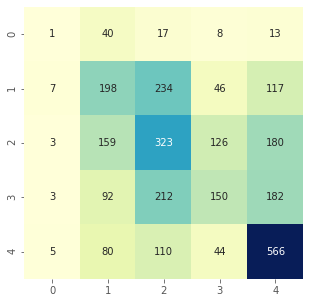

In [214]:
t_start = time.time()
gbc = GradientBoostingClassifier(n_estimators=200)
gbc.fit(X_train, y_train)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test, gbc.predict(X_test), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test, gbc.predict(X_test))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.4082036027987961
Time = 179.62291812896729 seconds


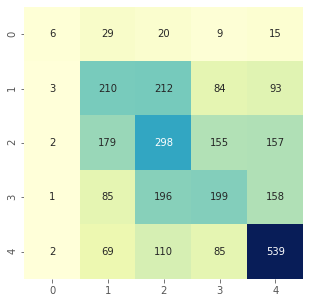

In [215]:
t_start = time.time()
gbc = GradientBoostingClassifier(max_depth=7, n_estimators=300)
gbc.fit(X_train_ohe, y_train_ohe)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_ohe, gbc.predict(X_test_ohe), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_ohe, gbc.predict(X_test_ohe))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.41129513918161065
Time = 31.47444725036621 seconds


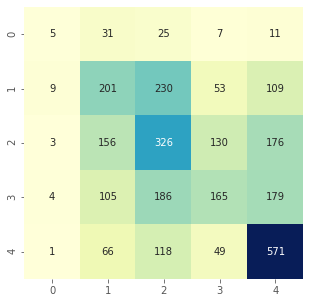

In [216]:
t_start = time.time()
gbc = GradientBoostingClassifier(max_depth=5)
gbc.fit(X_train_tar, y_train_tar)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_tar, gbc.predict(X_test_tar), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_tar, gbc.predict(X_test_tar))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

## XGB

In [217]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(X_train, y_train)

print(cohen_kappa_score(y_test, xgb_model.predict(X_test), weights='quadratic'))

0.4175859196649011


In [218]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(X_train_ohe, y_train_ohe)

print(cohen_kappa_score(y_test_ohe, xgb_model.predict(X_test_ohe), weights='quadratic'))

0.41794548529289366


In [219]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(X_train_tar, y_train_tar)

print(cohen_kappa_score(y_test_tar, xgb_model.predict(X_test_tar), weights='quadratic'))

0.4231012369500242


In [220]:
param_grid = {
    'max_depth': [1, 3, 5, 7, 9],
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [1.0, 0.5, 0.1, 0.05, 0.025, 0.01, 0.005]
}

In [221]:
xgb = randomized_cv(xgb.XGBClassifier(), param_grid, X_train, y_train, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START learning_rate=0.025, max_depth=9, n_estimators=300........
[CV 1/10; 1/30] END learning_rate=0.025, max_depth=9, n_estimators=300; total time= 1.2min
[CV 2/10; 1/30] START learning_rate=0.025, max_depth=9, n_estimators=300........
[CV 2/10; 1/30] END learning_rate=0.025, max_depth=9, n_estimators=300; total time= 1.1min
[CV 3/10; 1/30] START learning_rate=0.025, max_depth=9, n_estimators=300........
[CV 3/10; 1/30] END learning_rate=0.025, max_depth=9, n_estimators=300; total time= 1.1min
[CV 4/10; 1/30] START learning_rate=0.025, max_depth=9, n_estimators=300........
[CV 4/10; 1/30] END learning_rate=0.025, max_depth=9, n_estimators=300; total time= 1.0min
[CV 5/10; 1/30] START learning_rate=0.025, max_depth=9, n_estimators=300........
[CV 5/10; 1/30] END learning_rate=0.025, max_depth=9, n_estimators=300; total time=  54.7s
[CV 6/10; 1/30] START learning_rate=0.025, max_depth=9, n_estimators=300.....

[CV 9/10; 5/30] END learning_rate=0.005, max_depth=3, n_estimators=100; total time=   5.3s
[CV 10/10; 5/30] START learning_rate=0.005, max_depth=3, n_estimators=100.......
[CV 10/10; 5/30] END learning_rate=0.005, max_depth=3, n_estimators=100; total time=   5.5s
[CV 1/10; 6/30] START learning_rate=0.5, max_depth=3, n_estimators=100..........
[CV 1/10; 6/30] END learning_rate=0.5, max_depth=3, n_estimators=100; total time=   5.0s
[CV 2/10; 6/30] START learning_rate=0.5, max_depth=3, n_estimators=100..........
[CV 2/10; 6/30] END learning_rate=0.5, max_depth=3, n_estimators=100; total time=   5.1s
[CV 3/10; 6/30] START learning_rate=0.5, max_depth=3, n_estimators=100..........
[CV 3/10; 6/30] END learning_rate=0.5, max_depth=3, n_estimators=100; total time=   5.3s
[CV 4/10; 6/30] START learning_rate=0.5, max_depth=3, n_estimators=100..........
[CV 4/10; 6/30] END learning_rate=0.5, max_depth=3, n_estimators=100; total time=   5.8s
[CV 5/10; 6/30] START learning_rate=0.5, max_depth=3, n_

[CV 7/10; 10/30] END learning_rate=0.01, max_depth=5, n_estimators=100; total time=   9.3s
[CV 8/10; 10/30] START learning_rate=0.01, max_depth=5, n_estimators=100........
[CV 8/10; 10/30] END learning_rate=0.01, max_depth=5, n_estimators=100; total time=   9.6s
[CV 9/10; 10/30] START learning_rate=0.01, max_depth=5, n_estimators=100........
[CV 9/10; 10/30] END learning_rate=0.01, max_depth=5, n_estimators=100; total time=  10.1s
[CV 10/10; 10/30] START learning_rate=0.01, max_depth=5, n_estimators=100.......
[CV 10/10; 10/30] END learning_rate=0.01, max_depth=5, n_estimators=100; total time=  11.1s
[CV 1/10; 11/30] START learning_rate=0.01, max_depth=5, n_estimators=200........
[CV 1/10; 11/30] END learning_rate=0.01, max_depth=5, n_estimators=200; total time=  27.2s
[CV 2/10; 11/30] START learning_rate=0.01, max_depth=5, n_estimators=200........
[CV 2/10; 11/30] END learning_rate=0.01, max_depth=5, n_estimators=200; total time=  21.5s
[CV 3/10; 11/30] START learning_rate=0.01, max_d

[CV 5/10; 15/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   7.5s
[CV 6/10; 15/30] START learning_rate=0.005, max_depth=7, n_estimators=50........
[CV 6/10; 15/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   7.0s
[CV 7/10; 15/30] START learning_rate=0.005, max_depth=7, n_estimators=50........
[CV 7/10; 15/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   6.9s
[CV 8/10; 15/30] START learning_rate=0.005, max_depth=7, n_estimators=50........
[CV 8/10; 15/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   7.0s
[CV 9/10; 15/30] START learning_rate=0.005, max_depth=7, n_estimators=50........
[CV 9/10; 15/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   7.0s
[CV 10/10; 15/30] START learning_rate=0.005, max_depth=7, n_estimators=50.......
[CV 10/10; 15/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   6.8s
[CV 1/10; 16/30] START learning_rate=0.025, max_

[CV 3/10; 20/30] END learning_rate=0.005, max_depth=5, n_estimators=100; total time=   9.6s
[CV 4/10; 20/30] START learning_rate=0.005, max_depth=5, n_estimators=100.......
[CV 4/10; 20/30] END learning_rate=0.005, max_depth=5, n_estimators=100; total time=   9.0s
[CV 5/10; 20/30] START learning_rate=0.005, max_depth=5, n_estimators=100.......
[CV 5/10; 20/30] END learning_rate=0.005, max_depth=5, n_estimators=100; total time=  10.3s
[CV 6/10; 20/30] START learning_rate=0.005, max_depth=5, n_estimators=100.......
[CV 6/10; 20/30] END learning_rate=0.005, max_depth=5, n_estimators=100; total time=   9.6s
[CV 7/10; 20/30] START learning_rate=0.005, max_depth=5, n_estimators=100.......
[CV 7/10; 20/30] END learning_rate=0.005, max_depth=5, n_estimators=100; total time=   9.5s
[CV 8/10; 20/30] START learning_rate=0.005, max_depth=5, n_estimators=100.......
[CV 8/10; 20/30] END learning_rate=0.005, max_depth=5, n_estimators=100; total time=   8.9s
[CV 9/10; 20/30] START learning_rate=0.005,

[CV 1/10; 25/30] END learning_rate=0.01, max_depth=3, n_estimators=50; total time=   2.9s
[CV 2/10; 25/30] START learning_rate=0.01, max_depth=3, n_estimators=50.........
[CV 2/10; 25/30] END learning_rate=0.01, max_depth=3, n_estimators=50; total time=   2.7s
[CV 3/10; 25/30] START learning_rate=0.01, max_depth=3, n_estimators=50.........
[CV 3/10; 25/30] END learning_rate=0.01, max_depth=3, n_estimators=50; total time=   2.6s
[CV 4/10; 25/30] START learning_rate=0.01, max_depth=3, n_estimators=50.........
[CV 4/10; 25/30] END learning_rate=0.01, max_depth=3, n_estimators=50; total time=   3.1s
[CV 5/10; 25/30] START learning_rate=0.01, max_depth=3, n_estimators=50.........
[CV 5/10; 25/30] END learning_rate=0.01, max_depth=3, n_estimators=50; total time=   3.0s
[CV 6/10; 25/30] START learning_rate=0.01, max_depth=3, n_estimators=50.........
[CV 6/10; 25/30] END learning_rate=0.01, max_depth=3, n_estimators=50; total time=   3.2s
[CV 7/10; 25/30] START learning_rate=0.01, max_depth=3,

[CV 9/10; 29/30] END learning_rate=0.5, max_depth=1, n_estimators=100; total time=   7.4s
[CV 10/10; 29/30] START learning_rate=0.5, max_depth=1, n_estimators=100........
[CV 10/10; 29/30] END learning_rate=0.5, max_depth=1, n_estimators=100; total time=   3.9s
[CV 1/10; 30/30] START learning_rate=0.025, max_depth=5, n_estimators=50........
[CV 1/10; 30/30] END learning_rate=0.025, max_depth=5, n_estimators=50; total time=   4.9s
[CV 2/10; 30/30] START learning_rate=0.025, max_depth=5, n_estimators=50........
[CV 2/10; 30/30] END learning_rate=0.025, max_depth=5, n_estimators=50; total time=   5.1s
[CV 3/10; 30/30] START learning_rate=0.025, max_depth=5, n_estimators=50........
[CV 3/10; 30/30] END learning_rate=0.025, max_depth=5, n_estimators=50; total time=   4.6s
[CV 4/10; 30/30] START learning_rate=0.025, max_depth=5, n_estimators=50........
[CV 4/10; 30/30] END learning_rate=0.025, max_depth=5, n_estimators=50; total time=   4.6s
[CV 5/10; 30/30] START learning_rate=0.025, max_de

In [225]:
xgb = randomized_cv(XGBClassifier(), param_grid, X_train_ohe, y_train_ohe, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START learning_rate=0.1, max_depth=9, n_estimators=100..........
[CV 1/10; 1/30] END learning_rate=0.1, max_depth=9, n_estimators=100; total time=  21.3s
[CV 2/10; 1/30] START learning_rate=0.1, max_depth=9, n_estimators=100..........
[CV 2/10; 1/30] END learning_rate=0.1, max_depth=9, n_estimators=100; total time=  19.5s
[CV 3/10; 1/30] START learning_rate=0.1, max_depth=9, n_estimators=100..........
[CV 3/10; 1/30] END learning_rate=0.1, max_depth=9, n_estimators=100; total time=  18.6s
[CV 4/10; 1/30] START learning_rate=0.1, max_depth=9, n_estimators=100..........
[CV 4/10; 1/30] END learning_rate=0.1, max_depth=9, n_estimators=100; total time=  17.9s
[CV 5/10; 1/30] START learning_rate=0.1, max_depth=9, n_estimators=100..........
[CV 5/10; 1/30] END learning_rate=0.1, max_depth=9, n_estimators=100; total time=  17.9s
[CV 6/10; 1/30] START learning_rate=0.1, max_depth=9, n_estimators=100..........
[CV 6/

[CV 9/10; 5/30] END learning_rate=0.01, max_depth=1, n_estimators=100; total time=   2.6s
[CV 10/10; 5/30] START learning_rate=0.01, max_depth=1, n_estimators=100........
[CV 10/10; 5/30] END learning_rate=0.01, max_depth=1, n_estimators=100; total time=   2.6s
[CV 1/10; 6/30] START learning_rate=0.005, max_depth=1, n_estimators=50.........
[CV 1/10; 6/30] END learning_rate=0.005, max_depth=1, n_estimators=50; total time=   1.3s
[CV 2/10; 6/30] START learning_rate=0.005, max_depth=1, n_estimators=50.........
[CV 2/10; 6/30] END learning_rate=0.005, max_depth=1, n_estimators=50; total time=   1.3s
[CV 3/10; 6/30] START learning_rate=0.005, max_depth=1, n_estimators=50.........
[CV 3/10; 6/30] END learning_rate=0.005, max_depth=1, n_estimators=50; total time=   1.2s
[CV 4/10; 6/30] START learning_rate=0.005, max_depth=1, n_estimators=50.........
[CV 4/10; 6/30] END learning_rate=0.005, max_depth=1, n_estimators=50; total time=   1.2s
[CV 5/10; 6/30] START learning_rate=0.005, max_depth=1

[CV 7/10; 10/30] END learning_rate=0.025, max_depth=5, n_estimators=200; total time=  18.1s
[CV 8/10; 10/30] START learning_rate=0.025, max_depth=5, n_estimators=200.......
[CV 8/10; 10/30] END learning_rate=0.025, max_depth=5, n_estimators=200; total time=  21.5s
[CV 9/10; 10/30] START learning_rate=0.025, max_depth=5, n_estimators=200.......
[CV 9/10; 10/30] END learning_rate=0.025, max_depth=5, n_estimators=200; total time=  18.4s
[CV 10/10; 10/30] START learning_rate=0.025, max_depth=5, n_estimators=200......
[CV 10/10; 10/30] END learning_rate=0.025, max_depth=5, n_estimators=200; total time=  20.1s
[CV 1/10; 11/30] START learning_rate=0.01, max_depth=5, n_estimators=100........
[CV 1/10; 11/30] END learning_rate=0.01, max_depth=5, n_estimators=100; total time=   9.1s
[CV 2/10; 11/30] START learning_rate=0.01, max_depth=5, n_estimators=100........
[CV 2/10; 11/30] END learning_rate=0.01, max_depth=5, n_estimators=100; total time=   8.8s
[CV 3/10; 11/30] START learning_rate=0.01, m

[CV 5/10; 15/30] END learning_rate=0.005, max_depth=5, n_estimators=50; total time=   4.3s
[CV 6/10; 15/30] START learning_rate=0.005, max_depth=5, n_estimators=50........
[CV 6/10; 15/30] END learning_rate=0.005, max_depth=5, n_estimators=50; total time=   4.4s
[CV 7/10; 15/30] START learning_rate=0.005, max_depth=5, n_estimators=50........
[CV 7/10; 15/30] END learning_rate=0.005, max_depth=5, n_estimators=50; total time=   4.2s
[CV 8/10; 15/30] START learning_rate=0.005, max_depth=5, n_estimators=50........
[CV 8/10; 15/30] END learning_rate=0.005, max_depth=5, n_estimators=50; total time=   4.4s
[CV 9/10; 15/30] START learning_rate=0.005, max_depth=5, n_estimators=50........
[CV 9/10; 15/30] END learning_rate=0.005, max_depth=5, n_estimators=50; total time=   4.3s
[CV 10/10; 15/30] START learning_rate=0.005, max_depth=5, n_estimators=50.......
[CV 10/10; 15/30] END learning_rate=0.005, max_depth=5, n_estimators=50; total time=   4.3s
[CV 1/10; 16/30] START learning_rate=0.5, max_de

[CV 3/10; 20/30] END learning_rate=0.01, max_depth=5, n_estimators=50; total time=   4.4s
[CV 4/10; 20/30] START learning_rate=0.01, max_depth=5, n_estimators=50.........
[CV 4/10; 20/30] END learning_rate=0.01, max_depth=5, n_estimators=50; total time=   4.3s
[CV 5/10; 20/30] START learning_rate=0.01, max_depth=5, n_estimators=50.........
[CV 5/10; 20/30] END learning_rate=0.01, max_depth=5, n_estimators=50; total time=   4.4s
[CV 6/10; 20/30] START learning_rate=0.01, max_depth=5, n_estimators=50.........
[CV 6/10; 20/30] END learning_rate=0.01, max_depth=5, n_estimators=50; total time=   4.4s
[CV 7/10; 20/30] START learning_rate=0.01, max_depth=5, n_estimators=50.........
[CV 7/10; 20/30] END learning_rate=0.01, max_depth=5, n_estimators=50; total time=   4.3s
[CV 8/10; 20/30] START learning_rate=0.01, max_depth=5, n_estimators=50.........
[CV 8/10; 20/30] END learning_rate=0.01, max_depth=5, n_estimators=50; total time=   4.4s
[CV 9/10; 20/30] START learning_rate=0.01, max_depth=5,

[CV 1/10; 25/30] END learning_rate=0.1, max_depth=9, n_estimators=300; total time=  49.9s
[CV 2/10; 25/30] START learning_rate=0.1, max_depth=9, n_estimators=300.........
[CV 2/10; 25/30] END learning_rate=0.1, max_depth=9, n_estimators=300; total time=  47.9s
[CV 3/10; 25/30] START learning_rate=0.1, max_depth=9, n_estimators=300.........
[CV 3/10; 25/30] END learning_rate=0.1, max_depth=9, n_estimators=300; total time=  48.6s
[CV 4/10; 25/30] START learning_rate=0.1, max_depth=9, n_estimators=300.........
[CV 4/10; 25/30] END learning_rate=0.1, max_depth=9, n_estimators=300; total time=  47.7s
[CV 5/10; 25/30] START learning_rate=0.1, max_depth=9, n_estimators=300.........
[CV 5/10; 25/30] END learning_rate=0.1, max_depth=9, n_estimators=300; total time=  47.5s
[CV 6/10; 25/30] START learning_rate=0.1, max_depth=9, n_estimators=300.........
[CV 6/10; 25/30] END learning_rate=0.1, max_depth=9, n_estimators=300; total time=  46.8s
[CV 7/10; 25/30] START learning_rate=0.1, max_depth=9, 

[CV 9/10; 29/30] END learning_rate=0.025, max_depth=3, n_estimators=200; total time=   9.3s
[CV 10/10; 29/30] START learning_rate=0.025, max_depth=3, n_estimators=200......
[CV 10/10; 29/30] END learning_rate=0.025, max_depth=3, n_estimators=200; total time=   9.3s
[CV 1/10; 30/30] START learning_rate=0.5, max_depth=9, n_estimators=200.........
[CV 1/10; 30/30] END learning_rate=0.5, max_depth=9, n_estimators=200; total time=  24.3s
[CV 2/10; 30/30] START learning_rate=0.5, max_depth=9, n_estimators=200.........
[CV 2/10; 30/30] END learning_rate=0.5, max_depth=9, n_estimators=200; total time=  24.3s
[CV 3/10; 30/30] START learning_rate=0.5, max_depth=9, n_estimators=200.........
[CV 3/10; 30/30] END learning_rate=0.5, max_depth=9, n_estimators=200; total time=  24.2s
[CV 4/10; 30/30] START learning_rate=0.5, max_depth=9, n_estimators=200.........
[CV 4/10; 30/30] END learning_rate=0.5, max_depth=9, n_estimators=200; total time=  24.6s
[CV 5/10; 30/30] START learning_rate=0.5, max_dept

In [226]:
xgb = randomized_cv(XGBClassifier(), param_grid, X_train_tar, y_train_tar, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START learning_rate=0.005, max_depth=7, n_estimators=50.........
[CV 1/10; 1/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   4.5s
[CV 2/10; 1/30] START learning_rate=0.005, max_depth=7, n_estimators=50.........
[CV 2/10; 1/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   4.5s
[CV 3/10; 1/30] START learning_rate=0.005, max_depth=7, n_estimators=50.........
[CV 3/10; 1/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   4.5s
[CV 4/10; 1/30] START learning_rate=0.005, max_depth=7, n_estimators=50.........
[CV 4/10; 1/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   4.4s
[CV 5/10; 1/30] START learning_rate=0.005, max_depth=7, n_estimators=50.........
[CV 5/10; 1/30] END learning_rate=0.005, max_depth=7, n_estimators=50; total time=   4.5s
[CV 6/10; 1/30] START learning_rate=0.005, max_depth=7, n_estimators=50.........
[

[CV 9/10; 5/30] END learning_rate=1.0, max_depth=7, n_estimators=300; total time=  33.6s
[CV 10/10; 5/30] START learning_rate=1.0, max_depth=7, n_estimators=300.........
[CV 10/10; 5/30] END learning_rate=1.0, max_depth=7, n_estimators=300; total time=  32.2s
[CV 1/10; 6/30] START learning_rate=0.5, max_depth=5, n_estimators=300..........
[CV 1/10; 6/30] END learning_rate=0.5, max_depth=5, n_estimators=300; total time=  20.2s
[CV 2/10; 6/30] START learning_rate=0.5, max_depth=5, n_estimators=300..........
[CV 2/10; 6/30] END learning_rate=0.5, max_depth=5, n_estimators=300; total time=  17.9s
[CV 3/10; 6/30] START learning_rate=0.5, max_depth=5, n_estimators=300..........
[CV 3/10; 6/30] END learning_rate=0.5, max_depth=5, n_estimators=300; total time=  19.3s
[CV 4/10; 6/30] START learning_rate=0.5, max_depth=5, n_estimators=300..........
[CV 4/10; 6/30] END learning_rate=0.5, max_depth=5, n_estimators=300; total time=  19.7s
[CV 5/10; 6/30] START learning_rate=0.5, max_depth=5, n_esti

[CV 7/10; 10/30] END learning_rate=0.1, max_depth=5, n_estimators=100; total time=   5.8s
[CV 8/10; 10/30] START learning_rate=0.1, max_depth=5, n_estimators=100.........
[CV 8/10; 10/30] END learning_rate=0.1, max_depth=5, n_estimators=100; total time=   5.8s
[CV 9/10; 10/30] START learning_rate=0.1, max_depth=5, n_estimators=100.........
[CV 9/10; 10/30] END learning_rate=0.1, max_depth=5, n_estimators=100; total time=   5.8s
[CV 10/10; 10/30] START learning_rate=0.1, max_depth=5, n_estimators=100........
[CV 10/10; 10/30] END learning_rate=0.1, max_depth=5, n_estimators=100; total time=   5.4s
[CV 1/10; 11/30] START learning_rate=0.01, max_depth=3, n_estimators=50.........
[CV 1/10; 11/30] END learning_rate=0.01, max_depth=3, n_estimators=50; total time=   2.1s
[CV 2/10; 11/30] START learning_rate=0.01, max_depth=3, n_estimators=50.........
[CV 2/10; 11/30] END learning_rate=0.01, max_depth=3, n_estimators=50; total time=   1.6s
[CV 3/10; 11/30] START learning_rate=0.01, max_depth=3

[CV 5/10; 15/30] END learning_rate=0.01, max_depth=7, n_estimators=100; total time=   9.0s
[CV 6/10; 15/30] START learning_rate=0.01, max_depth=7, n_estimators=100........
[CV 6/10; 15/30] END learning_rate=0.01, max_depth=7, n_estimators=100; total time=   9.9s
[CV 7/10; 15/30] START learning_rate=0.01, max_depth=7, n_estimators=100........
[CV 7/10; 15/30] END learning_rate=0.01, max_depth=7, n_estimators=100; total time=   9.1s
[CV 8/10; 15/30] START learning_rate=0.01, max_depth=7, n_estimators=100........
[CV 8/10; 15/30] END learning_rate=0.01, max_depth=7, n_estimators=100; total time=   9.0s
[CV 9/10; 15/30] START learning_rate=0.01, max_depth=7, n_estimators=100........
[CV 9/10; 15/30] END learning_rate=0.01, max_depth=7, n_estimators=100; total time=   8.9s
[CV 10/10; 15/30] START learning_rate=0.01, max_depth=7, n_estimators=100.......
[CV 10/10; 15/30] END learning_rate=0.01, max_depth=7, n_estimators=100; total time=   9.0s
[CV 1/10; 16/30] START learning_rate=0.005, max_

[CV 3/10; 20/30] END learning_rate=0.025, max_depth=3, n_estimators=50; total time=   1.9s
[CV 4/10; 20/30] START learning_rate=0.025, max_depth=3, n_estimators=50........
[CV 4/10; 20/30] END learning_rate=0.025, max_depth=3, n_estimators=50; total time=   1.9s
[CV 5/10; 20/30] START learning_rate=0.025, max_depth=3, n_estimators=50........
[CV 5/10; 20/30] END learning_rate=0.025, max_depth=3, n_estimators=50; total time=   1.8s
[CV 6/10; 20/30] START learning_rate=0.025, max_depth=3, n_estimators=50........
[CV 6/10; 20/30] END learning_rate=0.025, max_depth=3, n_estimators=50; total time=   2.0s
[CV 7/10; 20/30] START learning_rate=0.025, max_depth=3, n_estimators=50........
[CV 7/10; 20/30] END learning_rate=0.025, max_depth=3, n_estimators=50; total time=   2.4s
[CV 8/10; 20/30] START learning_rate=0.025, max_depth=3, n_estimators=50........
[CV 8/10; 20/30] END learning_rate=0.025, max_depth=3, n_estimators=50; total time=   2.1s
[CV 9/10; 20/30] START learning_rate=0.025, max_d

[CV 1/10; 25/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   3.7s
[CV 2/10; 25/30] START learning_rate=0.5, max_depth=1, n_estimators=200.........
[CV 2/10; 25/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   3.3s
[CV 3/10; 25/30] START learning_rate=0.5, max_depth=1, n_estimators=200.........
[CV 3/10; 25/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   3.7s
[CV 4/10; 25/30] START learning_rate=0.5, max_depth=1, n_estimators=200.........
[CV 4/10; 25/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   3.4s
[CV 5/10; 25/30] START learning_rate=0.5, max_depth=1, n_estimators=200.........
[CV 5/10; 25/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   3.3s
[CV 6/10; 25/30] START learning_rate=0.5, max_depth=1, n_estimators=200.........
[CV 6/10; 25/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   3.7s
[CV 7/10; 25/30] START learning_rate=0.5, max_depth=1, 

[CV 9/10; 29/30] END learning_rate=0.5, max_depth=5, n_estimators=200; total time=  12.9s
[CV 10/10; 29/30] START learning_rate=0.5, max_depth=5, n_estimators=200........
[CV 10/10; 29/30] END learning_rate=0.5, max_depth=5, n_estimators=200; total time=  13.9s
[CV 1/10; 30/30] START learning_rate=0.1, max_depth=9, n_estimators=50..........
[CV 1/10; 30/30] END learning_rate=0.1, max_depth=9, n_estimators=50; total time=   8.0s
[CV 2/10; 30/30] START learning_rate=0.1, max_depth=9, n_estimators=50..........
[CV 2/10; 30/30] END learning_rate=0.1, max_depth=9, n_estimators=50; total time=   7.5s
[CV 3/10; 30/30] START learning_rate=0.1, max_depth=9, n_estimators=50..........
[CV 3/10; 30/30] END learning_rate=0.1, max_depth=9, n_estimators=50; total time=   6.9s
[CV 4/10; 30/30] START learning_rate=0.1, max_depth=9, n_estimators=50..........
[CV 4/10; 30/30] END learning_rate=0.1, max_depth=9, n_estimators=50; total time=   6.9s
[CV 5/10; 30/30] START learning_rate=0.1, max_depth=9, n_e

 Score = 0.41817708886538607
Time = 46.994672536849976 seconds


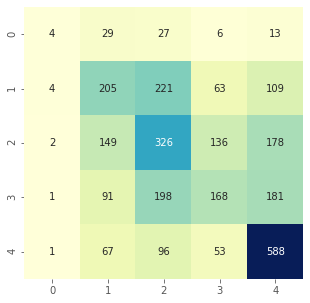

In [228]:
t_start = time.time()
xgb = XGBClassifier(learning_rate=0.025, max_depth=9, n_estimators=300)
xgb.fit(X_train, y_train)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test, xgb.predict(X_test), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test, xgb.predict(X_test))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.4213457502881114
Time = 52.873796463012695 seconds


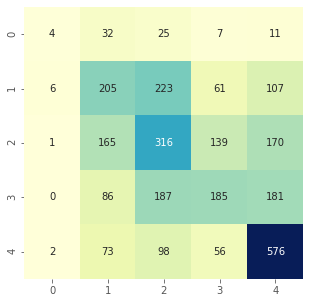

In [229]:
t_start = time.time()
xgb = XGBClassifier(base_score=0.5, booster='gbtree', learning_rate=0.025, max_depth=9, n_estimators=300)
xgb.fit(X_train_ohe, y_train_ohe)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_ohe, xgb.predict(X_test_ohe), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_ohe, xgb.predict(X_test_ohe))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

 Score = 0.4191713864260447
Time = 8.319628953933716 seconds


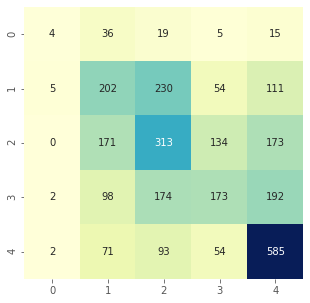

In [230]:
t_start = time.time()
xgb = XGBClassifier(base_score=0.5, booster='gbtree', learning_rate=0.1, max_depth=9, n_estimators=50)
xgb.fit(X_train_tar, y_train_tar)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_tar, xgb.predict(X_test_tar), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_tar, xgb.predict(X_test_tar))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

## LightGBM

In [233]:
lgb_model = lgb.LGBMClassifier()
lgb_model.fit(X_train, y_train)

print(cohen_kappa_score(y_test, lgb_model.predict(X_test), weights='quadratic'))

0.42737008915551244


In [234]:
lgb_model = lgb.LGBMClassifier()
lgb_model.fit(X_train_ohe, y_train_ohe)

print(cohen_kappa_score(y_test_ohe, lgb_model.predict(X_test_ohe), weights='quadratic'))

0.4192884742700542


In [235]:
lgb_model = lgb.LGBMClassifier()
lgb_model.fit(X_train_tar, y_train_tar)

print(cohen_kappa_score(y_test_tar, lgb_model.predict(X_test_tar), weights='quadratic'))

0.43022984971564404


In [236]:
param_grid = {
    'max_depth': [1, 3, 5, 7, 9],
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [1.0, 0.5, 0.1, 0.05, 0.025, 0.01, 0.005]
}

In [237]:
lgb_model = randomized_cv(lgb.LGBMClassifier(), param_grid, X_train, y_train, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START learning_rate=0.5, max_depth=9, n_estimators=50...........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 1/10; 1/30] END learning_rate=0.5, max_depth=9, n_estimators=50; total time=   1.3s
[CV 2/10; 1/30] START learning_rate=0.5, max_depth=9, n_estimators=50...........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 1/30] END learning_rate=0.5, max_depth=9, n_estimators=50; total time=   1.5s
[CV 3/10; 1/30] START learning_rate=0.5, max_depth=9, n_estimators=50...........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 1/30] END learning_rate=0.5, max_depth=9, n_estimators=50; total time=   1.5s
[CV 4/10; 1/30] START learning_rate=0.5, max_depth=9, n_estimators=50...........
[LightGBM] [Warning] Accuracy may be bad si

[CV 1/10; 4/30] END learning_rate=0.01, max_depth=7, n_estimators=300; total time=   7.2s
[CV 2/10; 4/30] START learning_rate=0.01, max_depth=7, n_estimators=300.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 4/30] END learning_rate=0.01, max_depth=7, n_estimators=300; total time=   7.4s
[CV 3/10; 4/30] START learning_rate=0.01, max_depth=7, n_estimators=300.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 4/30] END learning_rate=0.01, max_depth=7, n_estimators=300; total time=   7.1s
[CV 4/10; 4/30] START learning_rate=0.01, max_depth=7, n_estimators=300.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 4/10; 4/30] END learning_rate=0.01, max_depth=7, n_estimators=300; total time=   9.4s
[CV 5/10; 4/30] START learning_rate=0.01, max_depth=7, n_estimators=300.........
[LightGBM]

[CV 8/10; 7/30] END learning_rate=0.005, max_depth=1, n_estimators=50; total time=   0.3s
[CV 9/10; 7/30] START learning_rate=0.005, max_depth=1, n_estimators=50.........
[CV 9/10; 7/30] END learning_rate=0.005, max_depth=1, n_estimators=50; total time=   0.3s
[CV 10/10; 7/30] START learning_rate=0.005, max_depth=1, n_estimators=50........
[CV 10/10; 7/30] END learning_rate=0.005, max_depth=1, n_estimators=50; total time=   0.2s
[CV 1/10; 8/30] START learning_rate=0.5, max_depth=9, n_estimators=300..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 1/10; 8/30] END learning_rate=0.5, max_depth=9, n_estimators=300; total time=   6.0s
[CV 2/10; 8/30] START learning_rate=0.5, max_depth=9, n_estimators=300..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 8/30] END learning_rate=0.5, max_depth=9, n_estimators=300; total time=   5.9s
[CV 3/10; 8/30] START l

[CV 9/10; 10/30] END learning_rate=0.025, max_depth=9, n_estimators=50; total time=   1.4s
[CV 10/10; 10/30] START learning_rate=0.025, max_depth=9, n_estimators=50.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 10/10; 10/30] END learning_rate=0.025, max_depth=9, n_estimators=50; total time=   1.1s
[CV 1/10; 11/30] START learning_rate=0.01, max_depth=7, n_estimators=50.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 1/10; 11/30] END learning_rate=0.01, max_depth=7, n_estimators=50; total time=   1.2s
[CV 2/10; 11/30] START learning_rate=0.01, max_depth=7, n_estimators=50.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 11/30] END learning_rate=0.01, max_depth=7, n_estimators=50; total time=   1.3s
[CV 3/10; 11/30] START learning_rate=0.01, max_depth=7, n_estimators=50.........
[LightG

[CV 3/10; 14/30] END learning_rate=0.5, max_depth=9, n_estimators=100; total time=   1.6s
[CV 4/10; 14/30] START learning_rate=0.5, max_depth=9, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 4/10; 14/30] END learning_rate=0.5, max_depth=9, n_estimators=100; total time=   1.6s
[CV 5/10; 14/30] START learning_rate=0.5, max_depth=9, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 5/10; 14/30] END learning_rate=0.5, max_depth=9, n_estimators=100; total time=   1.6s
[CV 6/10; 14/30] START learning_rate=0.5, max_depth=9, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 6/10; 14/30] END learning_rate=0.5, max_depth=9, n_estimators=100; total time=   1.9s
[CV 7/10; 14/30] START learning_rate=0.5, max_depth=9, n_estimators=100.........
[LightGBM]

[CV 7/10; 17/30] END learning_rate=0.05, max_depth=9, n_estimators=200; total time=   3.4s
[CV 8/10; 17/30] START learning_rate=0.05, max_depth=9, n_estimators=200........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 8/10; 17/30] END learning_rate=0.05, max_depth=9, n_estimators=200; total time=   3.3s
[CV 9/10; 17/30] START learning_rate=0.05, max_depth=9, n_estimators=200........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 9/10; 17/30] END learning_rate=0.05, max_depth=9, n_estimators=200; total time=   3.3s
[CV 10/10; 17/30] START learning_rate=0.05, max_depth=9, n_estimators=200.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 10/10; 17/30] END learning_rate=0.05, max_depth=9, n_estimators=200; total time=   3.3s
[CV 1/10; 18/30] START learning_rate=0.01, max_depth=1, n_estimators=200........
[CV 1

[CV 1/10; 21/30] END learning_rate=1.0, max_depth=5, n_estimators=50; total time=   0.6s
[CV 2/10; 21/30] START learning_rate=1.0, max_depth=5, n_estimators=50..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 21/30] END learning_rate=1.0, max_depth=5, n_estimators=50; total time=   0.7s
[CV 3/10; 21/30] START learning_rate=1.0, max_depth=5, n_estimators=50..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 21/30] END learning_rate=1.0, max_depth=5, n_estimators=50; total time=   0.7s
[CV 4/10; 21/30] START learning_rate=1.0, max_depth=5, n_estimators=50..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 4/10; 21/30] END learning_rate=1.0, max_depth=5, n_estimators=50; total time=   0.6s
[CV 5/10; 21/30] START learning_rate=1.0, max_depth=5, n_estimators=50..........
[LightGBM] [Wa

[CV 5/10; 24/30] END learning_rate=0.5, max_depth=7, n_estimators=100; total time=   2.0s
[CV 6/10; 24/30] START learning_rate=0.5, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 6/10; 24/30] END learning_rate=0.5, max_depth=7, n_estimators=100; total time=   2.1s
[CV 7/10; 24/30] START learning_rate=0.5, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 7/10; 24/30] END learning_rate=0.5, max_depth=7, n_estimators=100; total time=   1.9s
[CV 8/10; 24/30] START learning_rate=0.5, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 8/10; 24/30] END learning_rate=0.5, max_depth=7, n_estimators=100; total time=   1.7s
[CV 9/10; 24/30] START learning_rate=0.5, max_depth=7, n_estimators=100.........
[LightGBM]

[CV 9/10; 27/30] END learning_rate=0.5, max_depth=7, n_estimators=50; total time=   1.0s
[CV 10/10; 27/30] START learning_rate=0.5, max_depth=7, n_estimators=50.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 10/10; 27/30] END learning_rate=0.5, max_depth=7, n_estimators=50; total time=   0.9s
[CV 1/10; 28/30] START learning_rate=0.05, max_depth=5, n_estimators=100........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 1/10; 28/30] END learning_rate=0.05, max_depth=5, n_estimators=100; total time=   1.8s
[CV 2/10; 28/30] START learning_rate=0.05, max_depth=5, n_estimators=100........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 28/30] END learning_rate=0.05, max_depth=5, n_estimators=100; total time=   1.9s
[CV 3/10; 28/30] START learning_rate=0.05, max_depth=5, n_estimators=100........
[LightGBM

In [238]:
lgb_model = randomized_cv(lgb.LGBMClassifier(), param_grid, X_train_ohe, y_train_ohe, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START learning_rate=0.01, max_depth=1, n_estimators=300.........
[CV 1/10; 1/30] END learning_rate=0.01, max_depth=1, n_estimators=300; total time=   1.7s
[CV 2/10; 1/30] START learning_rate=0.01, max_depth=1, n_estimators=300.........
[CV 2/10; 1/30] END learning_rate=0.01, max_depth=1, n_estimators=300; total time=   1.6s
[CV 3/10; 1/30] START learning_rate=0.01, max_depth=1, n_estimators=300.........
[CV 3/10; 1/30] END learning_rate=0.01, max_depth=1, n_estimators=300; total time=   1.6s
[CV 4/10; 1/30] START learning_rate=0.01, max_depth=1, n_estimators=300.........
[CV 4/10; 1/30] END learning_rate=0.01, max_depth=1, n_estimators=300; total time=   1.6s
[CV 5/10; 1/30] START learning_rate=0.01, max_depth=1, n_estimators=300.........
[CV 5/10; 1/30] END learning_rate=0.01, max_depth=1, n_estimators=300; total time=   1.7s
[CV 6/10; 1/30] START learning_rate=0.01, max_depth=1, n_estimators=300.........
[

[CV 4/10; 4/30] END learning_rate=0.005, max_depth=9, n_estimators=50; total time=   1.1s
[CV 5/10; 4/30] START learning_rate=0.005, max_depth=9, n_estimators=50.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 5/10; 4/30] END learning_rate=0.005, max_depth=9, n_estimators=50; total time=   1.1s
[CV 6/10; 4/30] START learning_rate=0.005, max_depth=9, n_estimators=50.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 6/10; 4/30] END learning_rate=0.005, max_depth=9, n_estimators=50; total time=   1.1s
[CV 7/10; 4/30] START learning_rate=0.005, max_depth=9, n_estimators=50.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 7/10; 4/30] END learning_rate=0.005, max_depth=9, n_estimators=50; total time=   1.1s
[CV 8/10; 4/30] START learning_rate=0.005, max_depth=9, n_estimators=50.........
[LightGBM]

[CV 7/10; 7/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   1.1s
[CV 8/10; 7/30] START learning_rate=0.5, max_depth=1, n_estimators=200..........
[CV 8/10; 7/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   1.1s
[CV 9/10; 7/30] START learning_rate=0.5, max_depth=1, n_estimators=200..........
[CV 9/10; 7/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   1.0s
[CV 10/10; 7/30] START learning_rate=0.5, max_depth=1, n_estimators=200.........
[CV 10/10; 7/30] END learning_rate=0.5, max_depth=1, n_estimators=200; total time=   1.0s
[CV 1/10; 8/30] START learning_rate=0.025, max_depth=7, n_estimators=300........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 1/10; 8/30] END learning_rate=0.025, max_depth=7, n_estimators=300; total time=   5.6s
[CV 2/10; 8/30] START learning_rate=0.025, max_depth=7, n_estimators=300........
[LightGBM] [Warning] Accuracy may be bad sinc

[CV 9/10; 10/30] END learning_rate=0.05, max_depth=5, n_estimators=200; total time=   3.0s
[CV 10/10; 10/30] START learning_rate=0.05, max_depth=5, n_estimators=200.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 10/10; 10/30] END learning_rate=0.05, max_depth=5, n_estimators=200; total time=   3.0s
[CV 1/10; 11/30] START learning_rate=1.0, max_depth=1, n_estimators=300.........
[CV 1/10; 11/30] END learning_rate=1.0, max_depth=1, n_estimators=300; total time=   1.5s
[CV 2/10; 11/30] START learning_rate=1.0, max_depth=1, n_estimators=300.........
[CV 2/10; 11/30] END learning_rate=1.0, max_depth=1, n_estimators=300; total time=   1.5s
[CV 3/10; 11/30] START learning_rate=1.0, max_depth=1, n_estimators=300.........
[CV 3/10; 11/30] END learning_rate=1.0, max_depth=1, n_estimators=300; total time=   1.5s
[CV 4/10; 11/30] START learning_rate=1.0, max_depth=1, n_estimators=300.........
[CV 4/10; 11/30] END learning_rate=1.0, 

[CV 1/10; 15/30] END learning_rate=0.1, max_depth=7, n_estimators=200; total time=   3.5s
[CV 2/10; 15/30] START learning_rate=0.1, max_depth=7, n_estimators=200.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 15/30] END learning_rate=0.1, max_depth=7, n_estimators=200; total time=   4.0s
[CV 3/10; 15/30] START learning_rate=0.1, max_depth=7, n_estimators=200.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 15/30] END learning_rate=0.1, max_depth=7, n_estimators=200; total time=   3.6s
[CV 4/10; 15/30] START learning_rate=0.1, max_depth=7, n_estimators=200.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 4/10; 15/30] END learning_rate=0.1, max_depth=7, n_estimators=200; total time=   3.5s
[CV 5/10; 15/30] START learning_rate=0.1, max_depth=7, n_estimators=200.........
[LightGBM]

[CV 1/10; 18/30] END learning_rate=0.01, max_depth=7, n_estimators=200; total time=   5.5s
[CV 2/10; 18/30] START learning_rate=0.01, max_depth=7, n_estimators=200........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 18/30] END learning_rate=0.01, max_depth=7, n_estimators=200; total time=   4.2s
[CV 3/10; 18/30] START learning_rate=0.01, max_depth=7, n_estimators=200........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 18/30] END learning_rate=0.01, max_depth=7, n_estimators=200; total time=   4.3s
[CV 4/10; 18/30] START learning_rate=0.01, max_depth=7, n_estimators=200........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 4/10; 18/30] END learning_rate=0.01, max_depth=7, n_estimators=200; total time=   4.7s
[CV 5/10; 18/30] START learning_rate=0.01, max_depth=7, n_estimators=200........
[Light

[CV 4/10; 22/30] END learning_rate=0.5, max_depth=1, n_estimators=300; total time=   2.2s
[CV 5/10; 22/30] START learning_rate=0.5, max_depth=1, n_estimators=300.........
[CV 5/10; 22/30] END learning_rate=0.5, max_depth=1, n_estimators=300; total time=   1.5s
[CV 6/10; 22/30] START learning_rate=0.5, max_depth=1, n_estimators=300.........
[CV 6/10; 22/30] END learning_rate=0.5, max_depth=1, n_estimators=300; total time=   1.5s
[CV 7/10; 22/30] START learning_rate=0.5, max_depth=1, n_estimators=300.........
[CV 7/10; 22/30] END learning_rate=0.5, max_depth=1, n_estimators=300; total time=   1.5s
[CV 8/10; 22/30] START learning_rate=0.5, max_depth=1, n_estimators=300.........
[CV 8/10; 22/30] END learning_rate=0.5, max_depth=1, n_estimators=300; total time=   1.5s
[CV 9/10; 22/30] START learning_rate=0.5, max_depth=1, n_estimators=300.........
[CV 9/10; 22/30] END learning_rate=0.5, max_depth=1, n_estimators=300; total time=   1.5s
[CV 10/10; 22/30] START learning_rate=0.5, max_depth=1,

[CV 10/10; 25/30] END learning_rate=0.01, max_depth=3, n_estimators=200; total time=   1.9s
[CV 1/10; 26/30] START learning_rate=0.5, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 1/10; 26/30] END learning_rate=0.5, max_depth=7, n_estimators=100; total time=   1.8s
[CV 2/10; 26/30] START learning_rate=0.5, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 26/30] END learning_rate=0.5, max_depth=7, n_estimators=100; total time=   1.8s
[CV 3/10; 26/30] START learning_rate=0.5, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 26/30] END learning_rate=0.5, max_depth=7, n_estimators=100; total time=   2.0s
[CV 4/10; 26/30] START learning_rate=0.5, max_depth=7, n_estimators=100.........
[LightGB

[CV 4/10; 29/30] END learning_rate=0.1, max_depth=7, n_estimators=100; total time=   2.0s
[CV 5/10; 29/30] START learning_rate=0.1, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 5/10; 29/30] END learning_rate=0.1, max_depth=7, n_estimators=100; total time=   1.9s
[CV 6/10; 29/30] START learning_rate=0.1, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 6/10; 29/30] END learning_rate=0.1, max_depth=7, n_estimators=100; total time=   2.1s
[CV 7/10; 29/30] START learning_rate=0.1, max_depth=7, n_estimators=100.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 7/10; 29/30] END learning_rate=0.1, max_depth=7, n_estimators=100; total time=   1.9s
[CV 8/10; 29/30] START learning_rate=0.1, max_depth=7, n_estimators=100.........
[LightGBM]

In [239]:
lgb_model = randomized_cv(lgb.LGBMClassifier(), param_grid, X_train_tar, y_train_tar, 30)

Fitting 10 folds for each of 30 candidates, totalling 300 fits
[CV 1/10; 1/30] START learning_rate=0.1, max_depth=5, n_estimators=200..........
[CV 1/10; 1/30] END learning_rate=0.1, max_depth=5, n_estimators=200; total time=   2.9s
[CV 2/10; 1/30] START learning_rate=0.1, max_depth=5, n_estimators=200..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 1/30] END learning_rate=0.1, max_depth=5, n_estimators=200; total time=   2.9s
[CV 3/10; 1/30] START learning_rate=0.1, max_depth=5, n_estimators=200..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 1/30] END learning_rate=0.1, max_depth=5, n_estimators=200; total time=   3.1s
[CV 4/10; 1/30] START learning_rate=0.1, max_depth=5, n_estimators=200..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 4/10; 1/30] END learning_rate=0.1, m

[CV 1/10; 4/30] END learning_rate=0.5, max_depth=5, n_estimators=300; total time=   4.7s
[CV 2/10; 4/30] START learning_rate=0.5, max_depth=5, n_estimators=300..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 4/30] END learning_rate=0.5, max_depth=5, n_estimators=300; total time=   4.7s
[CV 3/10; 4/30] START learning_rate=0.5, max_depth=5, n_estimators=300..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 4/30] END learning_rate=0.5, max_depth=5, n_estimators=300; total time=   4.7s
[CV 4/10; 4/30] START learning_rate=0.5, max_depth=5, n_estimators=300..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 4/10; 4/30] END learning_rate=0.5, max_depth=5, n_estimators=300; total time=   4.8s
[CV 5/10; 4/30] START learning_rate=0.5, max_depth=5, n_estimators=300..........
[LightGBM] [Wa

[CV 2/10; 7/30] END learning_rate=0.5, max_depth=3, n_estimators=200; total time=   1.7s
[CV 3/10; 7/30] START learning_rate=0.5, max_depth=3, n_estimators=200..........
[CV 3/10; 7/30] END learning_rate=0.5, max_depth=3, n_estimators=200; total time=   1.9s
[CV 4/10; 7/30] START learning_rate=0.5, max_depth=3, n_estimators=200..........
[CV 4/10; 7/30] END learning_rate=0.5, max_depth=3, n_estimators=200; total time=   1.9s
[CV 5/10; 7/30] START learning_rate=0.5, max_depth=3, n_estimators=200..........
[CV 5/10; 7/30] END learning_rate=0.5, max_depth=3, n_estimators=200; total time=   1.8s
[CV 6/10; 7/30] START learning_rate=0.5, max_depth=3, n_estimators=200..........
[CV 6/10; 7/30] END learning_rate=0.5, max_depth=3, n_estimators=200; total time=   1.8s
[CV 7/10; 7/30] START learning_rate=0.5, max_depth=3, n_estimators=200..........
[CV 7/10; 7/30] END learning_rate=0.5, max_depth=3, n_estimators=200; total time=   1.8s
[CV 8/10; 7/30] START learning_rate=0.5, max_depth=3, n_estim

[CV 9/10; 10/30] END learning_rate=0.01, max_depth=5, n_estimators=100; total time=   1.9s
[CV 10/10; 10/30] START learning_rate=0.01, max_depth=5, n_estimators=100.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 10/10; 10/30] END learning_rate=0.01, max_depth=5, n_estimators=100; total time=   1.9s
[CV 1/10; 11/30] START learning_rate=1.0, max_depth=7, n_estimators=300.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 1/10; 11/30] END learning_rate=1.0, max_depth=7, n_estimators=300; total time=   3.8s
[CV 2/10; 11/30] START learning_rate=1.0, max_depth=7, n_estimators=300.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 11/30] END learning_rate=1.0, max_depth=7, n_estimators=300; total time=   3.7s
[CV 3/10; 11/30] START learning_rate=1.0, max_depth=7, n_estimators=300.........
[LightG

[CV 3/10; 14/30] END learning_rate=0.005, max_depth=9, n_estimators=100; total time=   2.3s
[CV 4/10; 14/30] START learning_rate=0.005, max_depth=9, n_estimators=100.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 4/10; 14/30] END learning_rate=0.005, max_depth=9, n_estimators=100; total time=   2.3s
[CV 5/10; 14/30] START learning_rate=0.005, max_depth=9, n_estimators=100.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 5/10; 14/30] END learning_rate=0.005, max_depth=9, n_estimators=100; total time=   2.3s
[CV 6/10; 14/30] START learning_rate=0.005, max_depth=9, n_estimators=100.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 6/10; 14/30] END learning_rate=0.005, max_depth=9, n_estimators=100; total time=   2.3s
[CV 7/10; 14/30] START learning_rate=0.005, max_depth=9, n_estimators=100.......
[L

[CV 5/10; 18/30] END learning_rate=0.01, max_depth=9, n_estimators=200; total time=   4.5s
[CV 6/10; 18/30] START learning_rate=0.01, max_depth=9, n_estimators=200........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 6/10; 18/30] END learning_rate=0.01, max_depth=9, n_estimators=200; total time=   4.5s
[CV 7/10; 18/30] START learning_rate=0.01, max_depth=9, n_estimators=200........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 7/10; 18/30] END learning_rate=0.01, max_depth=9, n_estimators=200; total time=   4.5s
[CV 8/10; 18/30] START learning_rate=0.01, max_depth=9, n_estimators=200........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 8/10; 18/30] END learning_rate=0.01, max_depth=9, n_estimators=200; total time=   4.6s
[CV 9/10; 18/30] START learning_rate=0.01, max_depth=9, n_estimators=200........
[Light

[CV 6/10; 21/30] END learning_rate=0.5, max_depth=9, n_estimators=300; total time=   5.3s
[CV 7/10; 21/30] START learning_rate=0.5, max_depth=9, n_estimators=300.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 7/10; 21/30] END learning_rate=0.5, max_depth=9, n_estimators=300; total time=   5.3s
[CV 8/10; 21/30] START learning_rate=0.5, max_depth=9, n_estimators=300.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 8/10; 21/30] END learning_rate=0.5, max_depth=9, n_estimators=300; total time=   5.3s
[CV 9/10; 21/30] START learning_rate=0.5, max_depth=9, n_estimators=300.........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 9/10; 21/30] END learning_rate=0.5, max_depth=9, n_estimators=300; total time=   5.3s
[CV 10/10; 21/30] START learning_rate=0.5, max_depth=9, n_estimators=300........
[LightGBM]

[CV 10/10; 24/30] END learning_rate=0.005, max_depth=9, n_estimators=300; total time=   6.9s
[CV 1/10; 25/30] START learning_rate=1.0, max_depth=5, n_estimators=50..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 1/10; 25/30] END learning_rate=1.0, max_depth=5, n_estimators=50; total time=   0.7s
[CV 2/10; 25/30] START learning_rate=1.0, max_depth=5, n_estimators=50..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 2/10; 25/30] END learning_rate=1.0, max_depth=5, n_estimators=50; total time=   0.7s
[CV 3/10; 25/30] START learning_rate=1.0, max_depth=5, n_estimators=50..........
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 3/10; 25/30] END learning_rate=1.0, max_depth=5, n_estimators=50; total time=   0.8s
[CV 4/10; 25/30] START learning_rate=1.0, max_depth=5, n_estimators=50..........
[LightGBM]

[CV 4/10; 28/30] END learning_rate=0.025, max_depth=5, n_estimators=200; total time=   3.3s
[CV 5/10; 28/30] START learning_rate=0.025, max_depth=5, n_estimators=200.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 5/10; 28/30] END learning_rate=0.025, max_depth=5, n_estimators=200; total time=   3.3s
[CV 6/10; 28/30] START learning_rate=0.025, max_depth=5, n_estimators=200.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 6/10; 28/30] END learning_rate=0.025, max_depth=5, n_estimators=200; total time=   3.4s
[CV 7/10; 28/30] START learning_rate=0.025, max_depth=5, n_estimators=200.......
[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
[CV 7/10; 28/30] END learning_rate=0.025, max_depth=5, n_estimators=200; total time=   3.3s
[CV 8/10; 28/30] START learning_rate=0.025, max_depth=5, n_estimators=200.......
[L

 Score = 0.42031303461617664
Time = 3.1988062858581543 seconds


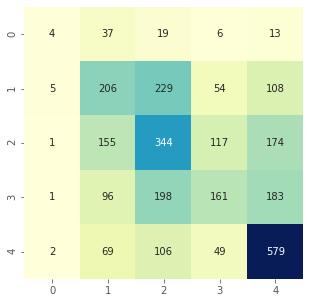

In [240]:
t_start = time.time()
lgb_model = lgb.LGBMClassifier(learning_rate=0.05, max_depth=9, n_estimators=200)
lgb_model.fit(X_train, y_train)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test, lgb_model.predict(X_test), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test, lgb_model.predict(X_test))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
 Score = 0.4228013688152027
Time = 3.471630811691284 seconds


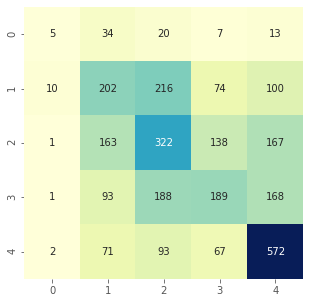

In [241]:
t_start = time.time()
lgb_model = lgb.LGBMClassifier(max_depth=7, n_estimators=200)
lgb_model.fit(X_train_ohe, y_train_ohe)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_ohe, lgb_model.predict(X_test_ohe), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_ohe, lgb_model.predict(X_test_ohe))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

[LightGBM] [Warning] Accuracy may be bad since you didn't set num_leaves and 2^max_depth > num_leaves
 Score = 0.4249991191199106
Time = 3.408841609954834 seconds


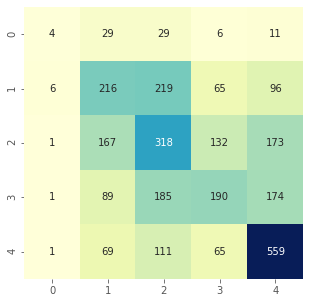

In [242]:
t_start = time.time()
lgb_model = lgb.LGBMClassifier(max_depth=9, n_estimators=200)
lgb_model.fit(X_train_tar, y_train_tar)
t_end = time.time()

print(f" Score = {cohen_kappa_score(y_test_tar, lgb_model.predict(X_test_tar), weights='quadratic')}")
print(f"Time = {t_end - t_start} seconds")

cm = confusion_matrix(y_test_tar, lgb_model.predict(X_test_tar))
conf_matrix = pd.DataFrame(data = cm, index=range(0, 5), columns=range(0, 5))
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);